In [27]:
pip install afinn

In [5]:
pip install vaderSentiment

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.7 MB/s eta 0:00:00


In [7]:
pip install nltk

In [8]:
pip install textblob

In [9]:
pip install scikit-learn

In [10]:
import pandas as pd
Qu_1=pd.read_csv('/content/Question1_project.csv')

In [12]:
import re
import pandas as pd
from nltk.tokenize import TweetTokenizer
import string
from afinn import Afinn
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.preprocessing import LabelEncoder

# Convert tweets to lowercase
Qu_1['Tweet'] = Qu_1['Tweet'].str.lower()

# Print to verify changes
print("Cleaned and updated DataFrame:")
print(Qu_1[['Date', 'Tweet']].head(10))

# Remove URL links
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r'https?:\/\/\S+', '', str(x)))

# Remove URL/website that didn't use http, only checking for .com websites
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r"www\.[a-z]?\.?(com)+|[a-z]+\.(com)", '', str(x)))

# Remove @mention
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r'@\w+', '', str(x)))

# Remove {link}
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r'{link}', '', str(x)))

# Remove &text; HTML chars
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r'&[a-z]+;', '', str(x)))

# Remove [video]
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r'\[video\]', '', str(x)))

# Remove all remaining characters that aren't letters, white space, or emojis/hashtags
Qu_1['Tweet'] = Qu_1['Tweet'].apply(lambda x: re.sub(r"[^a-z\s\(\-:\)\\\/\];='#]", '', str(x)))

# Initialize Tweet tokenizer
tknzr = TweetTokenizer()

# Tokenize the 'Tweet' column and store the tokens in a new column
Qu_1['tokens'] = Qu_1['Tweet'].apply(tknzr.tokenize)

# Define punctuation list
PUNCTUATION_LIST = list(string.punctuation)

def remove_punctuation(word_list):
    """Remove punctuation tokens from a list of tokens"""
    return [w for w in word_list if w not in PUNCTUATION_LIST]

# Apply punctuation removal function
Qu_1['tokens'] = Qu_1['tokens'].apply(remove_punctuation)

# Display the DataFrame preview
print("Data Preview with Tokens:")
print(Qu_1[['Tweet', 'tokens']].head())

# Convert the Date column to datetime format
Qu_1['Date'] = pd.to_datetime(Qu_1['Date'], dayfirst=True, errors='coerce')

# Initialize sentiment analyzers
afn = Afinn(emoticons=True)
analyzer = SentimentIntensityAnalyzer()

# Calculate sentiment scores
Qu_1['score_afinn'] = Qu_1['Tweet'].apply(afn.score)
Qu_1['score_textblob'] = Qu_1['Tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)
Qu_1['score_vader'] = Qu_1['Tweet'].apply(lambda tweet: analyzer.polarity_scores(tweet)['compound'])

# Classify sentiment based on the scores
Qu_1['class_afinn'] = Qu_1['score_afinn'].apply(lambda x: 'positive' if x > 0 else 'negative' if x < 0 else 'neutral')
Qu_1['class_textblob'] = Qu_1['score_textblob'].apply(lambda x: 'positive' if x >= 0.05 else 'negative' if x <= -0.05 else 'neutral')
Qu_1['class_vader'] = Qu_1['score_vader'].apply(lambda x: 'positive' if x >= 0.05 else 'negative' if x <= -0.05 else 'neutral')

# Compare sentiment classifications with the label column
def compare_sentiment(row, method):
    return 'match' if row[f'class_{method}'] == row['label'] else 'mismatch'

Qu_1['compare_afinn'] = Qu_1.apply(lambda row: compare_sentiment(row, 'afinn'), axis=1)
Qu_1['compare_textblob'] = Qu_1.apply(lambda row: compare_sentiment(row, 'textblob'), axis=1)
Qu_1['compare_vader'] = Qu_1.apply(lambda row: compare_sentiment(row, 'vader'), axis=1)

# Initialize label encoder
le = LabelEncoder()

# Encode labels for comparison
Qu_1['label_encoded'] = le.fit_transform(Qu_1['label'])
Qu_1['class_afinn_encoded'] = le.transform(Qu_1['class_afinn'])
Qu_1['class_textblob_encoded'] = le.transform(Qu_1['class_textblob'])
Qu_1['class_vader_encoded'] = le.transform(Qu_1['class_vader'])

# Define a function to print metrics with handling for zero_division
def print_metrics(y_true, y_pred, method_name):
    print(f"Metrics for {method_name}:")
    print(pd.crosstab(y_true, y_pred))
    print('----')
    print('Accuracy: ', accuracy_score(y_true, y_pred))
    print('---weighted avg---')
    print('Precision: ', precision_score(y_true, y_pred, average='weighted', zero_division=1))
    print('Recall: ', recall_score(y_true, y_pred, average='weighted', zero_division=1))
    print('F1-Score: ', f1_score(y_true, y_pred, average='weighted', zero_division=1))
    print('----')
    print(classification_report(y_true, y_pred, zero_division=1))
    print('----')

# Print metrics for Afinn
print_metrics(Qu_1['label_encoded'], Qu_1['class_afinn_encoded'], 'Afinn')

# Print metrics for TextBlob
print_metrics(Qu_1['label_encoded'], Qu_1['class_textblob_encoded'], 'TextBlob')

# Print metrics for VADER
print_metrics(Qu_1['label_encoded'], Qu_1['class_vader_encoded'], 'VADER')

# Display the DataFrame preview with comparisons
print("Data Preview with Sentiment Comparisons:")
print(Qu_1[['Tweet', 'class_afinn', 'class_textblob', 'class_vader', 'label', 'compare_afinn', 'compare_textblob', 'compare_vader']].head())

Cleaned and updated DataFrame:
                       Date                                              Tweet
0 2022-09-29 23:41:16+00:00  mainstream media has done an amazing job at br...
1 2022-09-29 23:24:43+00:00  tesla delivery estimates are at around k from ...
2 2022-09-29 23:18:08+00:00  / even if i include m unvested rsus as of / ad...
3 2022-09-29 22:40:07+00:00     hahaha why are you still trying to stop tes...
4 2022-09-29 22:27:05+00:00    stop trying to kill kids you sad deranged ol...
5 2022-09-29 22:25:53+00:00                                       this is you 
6 2022-09-29 22:24:22+00:00  for years  viciously silenced  critics failing...
7 2022-09-29 22:23:54+00:00  nio just because i'm down money doesn't mean t...
8 2022-09-29 22:23:28+00:00        likes for some spy tsla charts to study\n\n
9 2022-09-29 22:15:01+00:00       the powerwalls themselves are waterproof ...
Data Preview with Tokens:
                                               Tweet  \
0  mainstream medi

In [ ]:
import pandas as pd
data_tweet=pd.read_csv('/content/stock_tweets.csv')
data_tweet

,Date,Tweet,Stock Name,Company Name
0,NaN,NaN,NaN,NaN
1,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc."
2,NaN,NaN,NaN,NaN
3,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc."
4,NaN,NaN,NaN,NaN
...,...,...,...,...
161581,2021-10-01 04:43:41+00:00,Our record delivery results are a testimony of...,XPEV,XPeng Inc.
161582,NaN,NaN,NaN,NaN
161583,2021-10-01 00:03:32+00:00,"We delivered 10,412 Smart EVs in Sep 2021, rea...",XPEV,XPeng Inc.
161584,NaN,NaN,NaN,NaN


In [ ]:
df_cleaned = data_tweet.dropna(how='all')

# Reset the index after the operation, as dropping rows will leave gaps in the index
df_cleaned.reset_index(drop=True, inplace=True)
df_cleaned



,Date,Tweet,Stock Name,Company Name
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc."
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc."
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc."
3,2022-09-29 22:40:07+00:00,@WholeMarsBlog @Tesla Hahaha why are you stil...,TSLA,"Tesla, Inc."
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc."
...,...,...,...,...
80788,2021-10-07 17:11:57+00:00,Some of the fastest growing tech stocks on the...,XPEV,XPeng Inc.
80789,2021-10-04 17:05:59+00:00,"With earnings on the horizon, here is a quick ...",XPEV,XPeng Inc.
80790,2021-10-01 04:43:41+00:00,Our record delivery results are a testimony of...,XPEV,XPeng Inc.
80791,2021-10-01 00:03:32+00:00,"We delivered 10,412 Smart EVs in Sep 2021, rea...",XPEV,XPeng Inc.


In [ ]:
# Count the number of tweets for each company
tweets_per_company = df_cleaned.groupby('Stock Name').size()

# Display the counts
print(tweets_per_company)

Stock Name
AAPL     5056
AMD      2227
AMZN     4089
BA        399
BX         50
COST      393
CRM       233
DIS       635
ENPH      216
F          31
GOOG     1291
INTC      315
KO        310
META     2751
MSFT     4089
NFLX     1727
NIO      3021
NOC        31
PG       4089
PYPL      843
TSLA    37422
TSM     11034
VZ        123
XPEV      225
ZS        193
dtype: int64


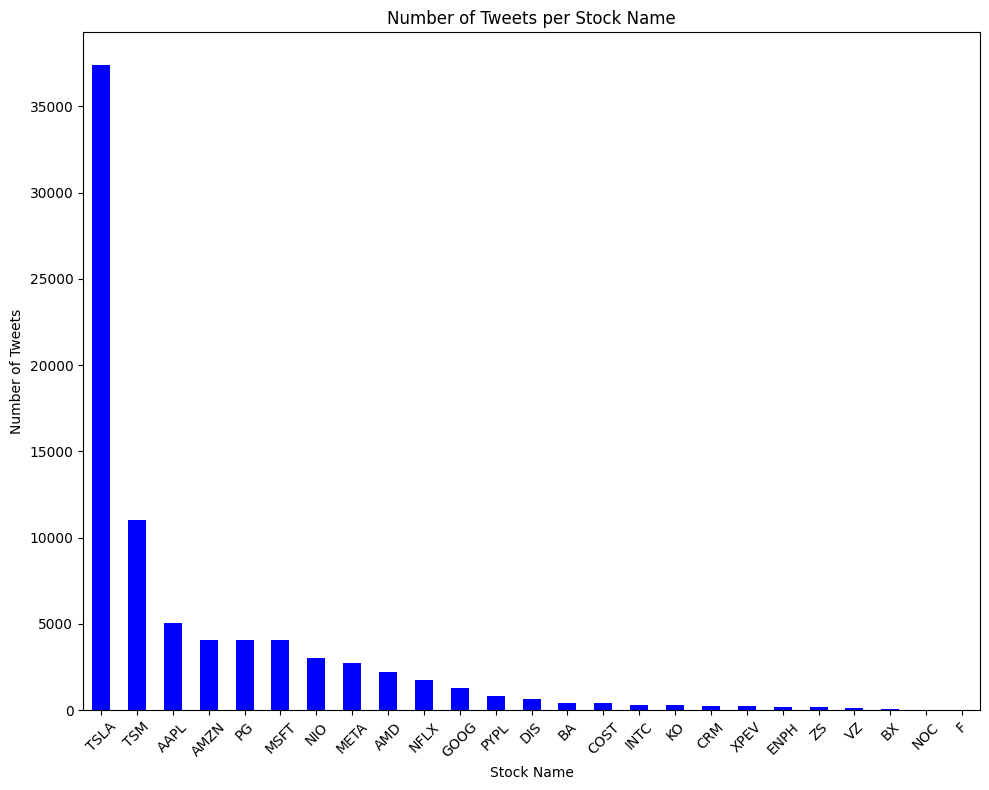

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



# Aggregate the count of tweets by 'Stock Name'
tweets_per_stock = df_cleaned.groupby('Stock Name').size()

# Sort the data for better visualization, showing stocks with the most tweets at the top
tweets_per_stock_sorted = tweets_per_stock.sort_values(ascending=False)

# Create a bar plot
plt.figure(figsize=(10, 8))  # You can adjust the figure size to your liking
tweets_per_stock_sorted.plot(kind='bar', color='blue')  # Choose a color that you prefer
plt.title('Number of Tweets per Stock Name')
plt.xlabel('Stock Name')
plt.ylabel('Number of Tweets')
plt.xticks(rotation=45)  # Rotates the stock names for better visibility
plt.tight_layout()  # Adjusts subplot params so that the subplot(s) fits into the figure area.

# Show the plot
plt.show()

In [14]:
import os
import pandas as pd
import re
from nltk.tokenize import TweetTokenizer
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import wordnet
from nltk import pos_tag
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import nltk

# Download necessary NLTK resources
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# Load the data
data_nlp = pd.read_csv('/content/stock_tweets.csv')

# Create a clean DataFrame
df_cleaned = data_nlp.dropna(how='all').copy()
df_cleaned.reset_index(drop=True, inplace=True)

# Function to clean tweet text, includes URL removal
def clean_text(text):
    # Remove URLs: HTTP, HTTPS, and www without explicit HTTP/S
    text = re.sub(r'https?:\/\/\S+|www\.\S+', '', text)
    # Remove user @ mentions
    text = re.sub(r'@\w+', '', text)
    # Remove hashtags (optional, remove if hashtags are needed)
    text = re.sub(r'#\w+', '', text)
    # Remove HTML entities
    text = re.sub(r'&\w+;', '', text)
    # Remove all non-letter characters except for ' and white spaces
    text = re.sub(r'[^a-z\s\']', '', text)
    return text

# Convert tweets to lowercase and apply the cleaning function
df_cleaned['Tweet'] = df_cleaned['Tweet'].str.lower().apply(clean_text)

# Tokenize tweets
tokenizer = TweetTokenizer()
df_cleaned['tokens'] = df_cleaned['Tweet'].apply(tokenizer.tokenize)

# Initialize lemmatizer and stemmer
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

# Function to convert NLTK's POS tags to WordNet tags
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return None

# Lemmatize and stem tokens
def lemmatize_and_stem(tokens):
    pos_tags = pos_tag(tokens)
    lemmatized_tokens = [lemmatizer.lemmatize(token, get_wordnet_pos(tag) or wordnet.NOUN) for token, tag in pos_tags]
    stemmed_tokens = [stemmer.stem(token) for token in lemmatized_tokens]
    return stemmed_tokens

df_cleaned['tokens'] = df_cleaned['tokens'].apply(lemmatize_and_stem)

# Recombine tokens into a single string for VADER analysis
df_cleaned['processed_tweet'] = df_cleaned['tokens'].apply(' '.join)

# Ensure the 'Date' column is correctly converted to datetime
df_cleaned['Date'] = pd.to_datetime(df_cleaned['Date'], errors='coerce', utc=True)

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Calculate sentiment scores using VADER
df_cleaned['score_vader'] = df_cleaned['processed_tweet'].apply(lambda tweet: analyzer.polarity_scores(tweet)['compound'])

# Classify sentiment based on VADER scores
df_cleaned['class_vader'] = df_cleaned['score_vader'].apply(lambda x: 'positive' if x >= 0.05 else 'negative' if x <= -0.05 else 'neutral')

# Map 'class_vader' to numerical values
df_cleaned['class_vader_mapped'] = df_cleaned['class_vader'].map({'positive': 1, 'neutral': 0, 'negative': -1})

# Group by Date and Stock Name, and aggregate data
aggregated_df = df_cleaned.groupby([df_cleaned['Date'].dt.date, 'Stock Name']).agg({
    'Tweet': 'count',
    'score_vader': 'sum',
    'class_vader_mapped': 'sum'  # Aggregate the class_vader_mapped values
}).reset_index()

# Rename columns for clarity
aggregated_df.columns = ['Date', 'Stock Name', 'Tweet_Count', 'Total_Score_Vader', 'Total_Class_Vader_Mapped']

# Add class_vader column based on Total_Score_Vader
aggregated_df['class_vader'] = aggregated_df['Total_Score_Vader'].apply(lambda x: 'positive' if x > 0 else 'negative' if x < 0 else 'neutral')

# Map 'class_vader' to numerical values in the final aggregated DataFrame
aggregated_df['class_vader_mapped'] = aggregated_df['class_vader'].map({'positive': 1, 'neutral': 0, 'negative': -1})

# Save the aggregated DataFrame to a CSV file
aggregated_file_path = 'aggregated_tweets_by_stock_final.csv'
aggregated_df.to_csv(aggregated_file_path, index=False)

print(f"Aggregated file saved successfully at {aggregated_file_path}")
print(aggregated_df.head())

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Aggregated file saved successfully at aggregated_tweets_by_stock_final.csv
         Date Stock Name  Tweet_Count  Total_Score_Vader  \
0  2021-09-30       AAPL            7             0.5054   
1  2021-09-30        AMD            6             2.1210   
2  2021-09-30       AMZN            5             1.2850   
3  2021-09-30        DIS            1             0.3182   
4  2021-09-30       GOOG            1             0.3612   

   Total_Class_Vader_Mapped class_vader  class_vader_mapped  
0                         1    positive                   1  
1                         4    positive                   1  
2                         1    positive                   1  
3                         1    positive                   1  
4                         1    positive                   1  


In [15]:
aggregated_df

,Date,Stock Name,Tweet_Count,Total_Score_Vader,Total_Class_Vader_Mapped,class_vader,class_vader_mapped
0,2021-09-30,AAPL,7,0.5054,1,positive,1
1,2021-09-30,AMD,6,2.1210,4,positive,1
2,2021-09-30,AMZN,5,1.2850,1,positive,1
3,2021-09-30,DIS,1,0.3182,1,positive,1
4,2021-09-30,GOOG,1,0.3612,1,positive,1
...,...,...,...,...,...,...,...
5905,2022-09-29,PG,10,1.0879,2,positive,1
5906,2022-09-29,PYPL,1,0.2926,1,positive,1
5907,2022-09-29,TSLA,112,3.5769,10,positive,1
5908,2022-09-29,TSM,16,2.4414,5,positive,1


In [16]:
aggregate_tweet=pd.read_csv('/content/aggregated_tweets_by_stock_final.csv')
aggregate_tweet

,Date,Stock Name,Tweet_Count,Total_Score_Vader,Total_Class_Vader_Mapped,class_vader,class_vader_mapped
0,2021-09-30,AAPL,7,0.5054,1,positive,1
1,2021-09-30,AMD,6,2.1210,4,positive,1
2,2021-09-30,AMZN,5,1.2850,1,positive,1
3,2021-09-30,DIS,1,0.3182,1,positive,1
4,2021-09-30,GOOG,1,0.3612,1,positive,1
...,...,...,...,...,...,...,...
5905,2022-09-29,PG,10,1.0879,2,positive,1
5906,2022-09-29,PYPL,1,0.2926,1,positive,1
5907,2022-09-29,TSLA,112,3.5769,10,positive,1
5908,2022-09-29,TSM,16,2.4414,5,positive,1


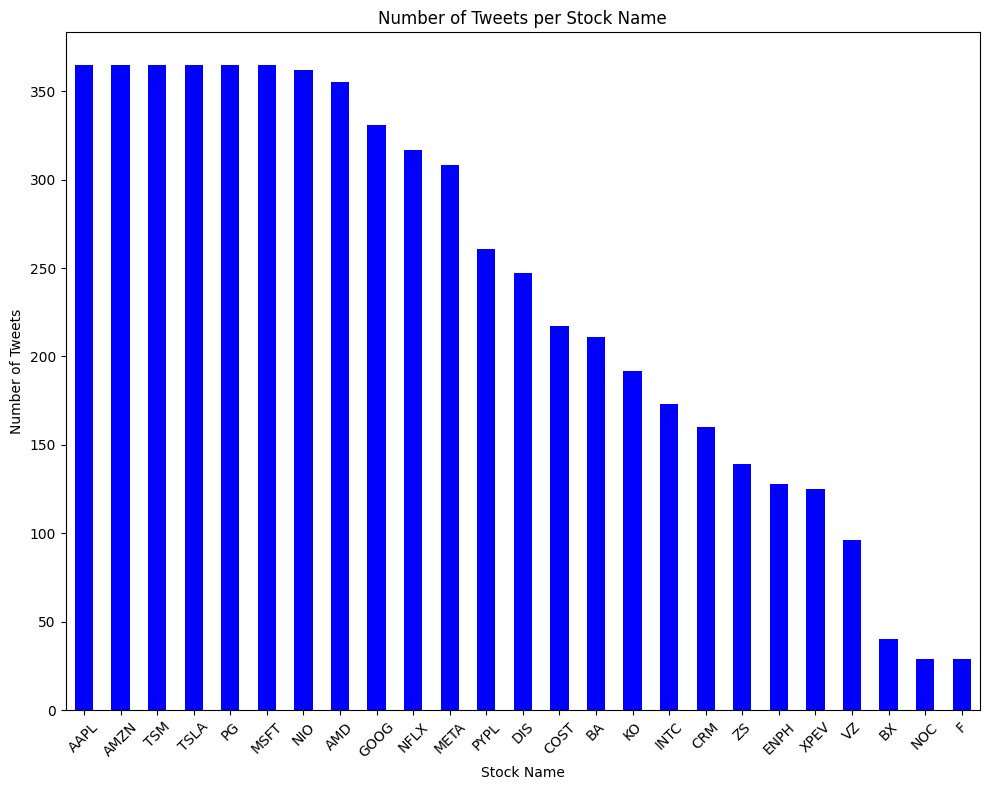

In [17]:
import pandas as pd
import matplotlib.pyplot as plt



# Aggregate the count of tweets by 'Stock Name'
tweets_per_stock = aggregate_tweet.groupby('Stock Name').size()

# Sort the data for better visualization, showing stocks with the most tweets at the top
tweets_per_stock_sorted = tweets_per_stock.sort_values(ascending=False)

# Create a bar plot
plt.figure(figsize=(10, 8))  # You can adjust the figure size to your liking
tweets_per_stock_sorted.plot(kind='bar', color='blue')  # Choose a color that you prefer
plt.title('Number of Tweets per Stock Name')
plt.xlabel('Stock Name')
plt.ylabel('Number of Tweets')
plt.xticks(rotation=45)  # Rotates the stock names for better visibility
plt.tight_layout()  # Adjusts subplot params so that the subplot(s) fits into the figure area.

# Show the plot
plt.show()

In [ ]:
import pandas as pd
stock_fini=pd.read_csv('/content/stock_yfinance_data.csv')
stock_fini

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA
...,...,...,...,...,...,...,...,...
6295,2022-09-23,13.090000,13.892000,12.860000,13.710000,13.710000,28279600,XPEV
6296,2022-09-26,14.280000,14.830000,14.070000,14.370000,14.370000,27891300,XPEV
6297,2022-09-27,14.580000,14.800000,13.580000,13.710000,13.710000,21160800,XPEV
6298,2022-09-28,13.050000,13.421000,12.690000,13.330000,13.330000,31799400,XPEV


In [ ]:
# Count the number of tweets for each company
stock_fin_data= stock_fini.groupby('Stock Name').size()

# Display the counts
print(stock_fin_data)

Stock Name
AAPL    252
AMD     252
AMZN    252
BA      252
BX      252
COST    252
CRM     252
DIS     252
ENPH    252
F       252
GOOG    252
INTC    252
KO      252
META    252
MSFT    252
NFLX    252
NIO     252
NOC     252
PG      252
PYPL    252
TSLA    252
TSM     252
VZ      252
XPEV    252
ZS      252
dtype: int64


In [18]:
import pandas as pd

# Load the uploaded stock finance data
stock_finance = pd.read_csv('/content/stock_yfinance_data.csv')
aggregate_tweet = pd.read_csv('/content/aggregated_tweets_by_stock_final.csv')

# Ensure the Date column is in datetime format in both DataFrames
aggregate_tweet['Date'] = pd.to_datetime(aggregate_tweet['Date'])
stock_finance['Date'] = pd.to_datetime(stock_finance['Date'])

# Print the columns of both DataFrames to ensure they match correctly
print("aggregate_tweet columns:", aggregate_tweet.columns)
print("stock_finance columns:", stock_finance.columns)

# Ensure the 'Stock_Name' column matches in both DataFrames, if necessary rename the column in stock_finance
# Example: stock_finance.rename(columns={'<actual_stock_name_column>': 'Stock_Name'}, inplace=True)
# Uncomment and replace '<actual_stock_name_column>' with the actual column name in stock_finance if different

# Merge the aggregated DataFrame with the stock_finance DataFrame
# Use a left join to keep all stock_finance data, even if there's no matching tweet data
merged_df = pd.merge(stock_finance, aggregate_tweet, on=['Date', 'Stock Name'], how='left')

# Replace NaN values with 0 in the relevant columns
merged_df['Tweet_Count'] = merged_df['Tweet_Count'].fillna(0)
merged_df['Total_Score_Vader'] = merged_df['Total_Score_Vader'].fillna(0)
merged_df['Total_Class_Vader_Mapped'] = merged_df['Total_Class_Vader_Mapped'].fillna(0)
merged_df['class_vader'] = merged_df['class_vader'].fillna('neutral')  # Assuming 'class_vader' is a categorical variable
merged_df['class_vader_mapped'] = merged_df['class_vader_mapped'].fillna(0)

# Save the merged DataFrame with filled values to a CSV file
merged_file_path = '/content/merged_dataset_with_fill.csv'
merged_df.to_csv(merged_file_path, index=False)

print(f"Merged file saved successfully at {merged_file_path}")

# Optionally, display the first few rows of the merged DataFrame
print(merged_df.head())

aggregate_tweet columns: Index(['Date', 'Stock Name', 'Tweet_Count', 'Total_Score_Vader',
       'Total_Class_Vader_Mapped', 'class_vader', 'class_vader_mapped'],
      dtype='object')
stock_finance columns: Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Stock Name'],
      dtype='object')
Merged file saved successfully at /content/merged_dataset_with_fill.csv
        Date        Open        High         Low       Close   Adj Close  \
0 2021-09-30  260.333344  263.043335  258.333344  258.493347  258.493347   
1 2021-10-01  259.466675  260.260010  254.529999  258.406677  258.406677   
2 2021-10-04  265.500000  268.989990  258.706665  260.510010  260.510010   
3 2021-10-05  261.600006  265.769989  258.066681  260.196655  260.196655   
4 2021-10-06  258.733337  262.220001  257.739990  260.916656  260.916656   

     Volume Stock Name  Tweet_Count  Total_Score_Vader  \
0  53868000       TSLA         90.0            15.4504   
1  51094200       TSLA         94

In [19]:
merged_df

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Tweet_Count,Total_Score_Vader,Total_Class_Vader_Mapped,class_vader,class_vader_mapped
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,90.0,15.4504,29.0,positive,1.0
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA,94.0,20.5005,36.0,positive,1.0
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA,119.0,13.5758,30.0,positive,1.0
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA,88.0,10.8819,18.0,positive,1.0
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA,78.0,14.5005,32.0,positive,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6295,2022-09-23,13.090000,13.892000,12.860000,13.710000,13.710000,28279600,XPEV,0.0,0.0000,0.0,neutral,0.0
6296,2022-09-26,14.280000,14.830000,14.070000,14.370000,14.370000,27891300,XPEV,1.0,0.2500,1.0,positive,1.0
6297,2022-09-27,14.580000,14.800000,13.580000,13.710000,13.710000,21160800,XPEV,0.0,0.0000,0.0,neutral,0.0
6298,2022-09-28,13.050000,13.421000,12.690000,13.330000,13.330000,31799400,XPEV,0.0,0.0000,0.0,neutral,0.0


In [ ]:
import pandas as pd

# Forward fill NaN values
merged_df['Tweet_Count'] = merged_df['Tweet_Count'].ffill()
merged_df['Total_Score_Vader'] = merged_df['Total_Score_Vader'].ffill()
merged_df['Total_Class_Vader_Mapped'] = merged_df['Total_Class_Vader_Mapped'].ffill()
merged_df['class_vader'] = merged_df['class_vader'].ffill()
merged_df['class_vader_mapped'] = merged_df['class_vader_mapped'].ffill()

# If you prefer backward fill, use this:
# merged_df.fillna(method='bfill', inplace=True)

print(merged_df.head())

        Date        Open        High         Low       Close   Adj Close  \
0 2021-09-30  260.333344  263.043335  258.333344  258.493347  258.493347   
1 2021-10-01  259.466675  260.260010  254.529999  258.406677  258.406677   
2 2021-10-04  265.500000  268.989990  258.706665  260.510010  260.510010   
3 2021-10-05  261.600006  265.769989  258.066681  260.196655  260.196655   
4 2021-10-06  258.733337  262.220001  257.739990  260.916656  260.916656   

     Volume Stock Name  Tweet_Count  Total_Score_Vader  \
0  53868000       TSLA         90.0            15.4504   
1  51094200       TSLA         94.0            20.5005   
2  91449900       TSLA        119.0            13.5758   
3  55297800       TSLA         88.0            10.8819   
4  43898400       TSLA         78.0            14.5005   

   Total_Class_Vader_Mapped class_vader  class_vader_mapped  
0                      29.0    positive                 1.0  
1                      36.0    positive                 1.0  
2       

In [ ]:
merged_df

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Tweet_Count,Total_Score_Vader,Total_Class_Vader_Mapped,class_vader,class_vader_mapped
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,90.0,15.4504,29.0,positive,1.0
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA,94.0,20.5005,36.0,positive,1.0
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA,119.0,13.5758,30.0,positive,1.0
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA,88.0,10.8819,18.0,positive,1.0
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA,78.0,14.5005,32.0,positive,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6295,2022-09-23,13.090000,13.892000,12.860000,13.710000,13.710000,28279600,XPEV,1.0,0.3818,1.0,positive,1.0
6296,2022-09-26,14.280000,14.830000,14.070000,14.370000,14.370000,27891300,XPEV,1.0,0.2500,1.0,positive,1.0
6297,2022-09-27,14.580000,14.800000,13.580000,13.710000,13.710000,21160800,XPEV,1.0,0.2500,1.0,positive,1.0
6298,2022-09-28,13.050000,13.421000,12.690000,13.330000,13.330000,31799400,XPEV,1.0,0.2500,1.0,positive,1.0


<ipython-input-21-e5469be4f78c>:7: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)


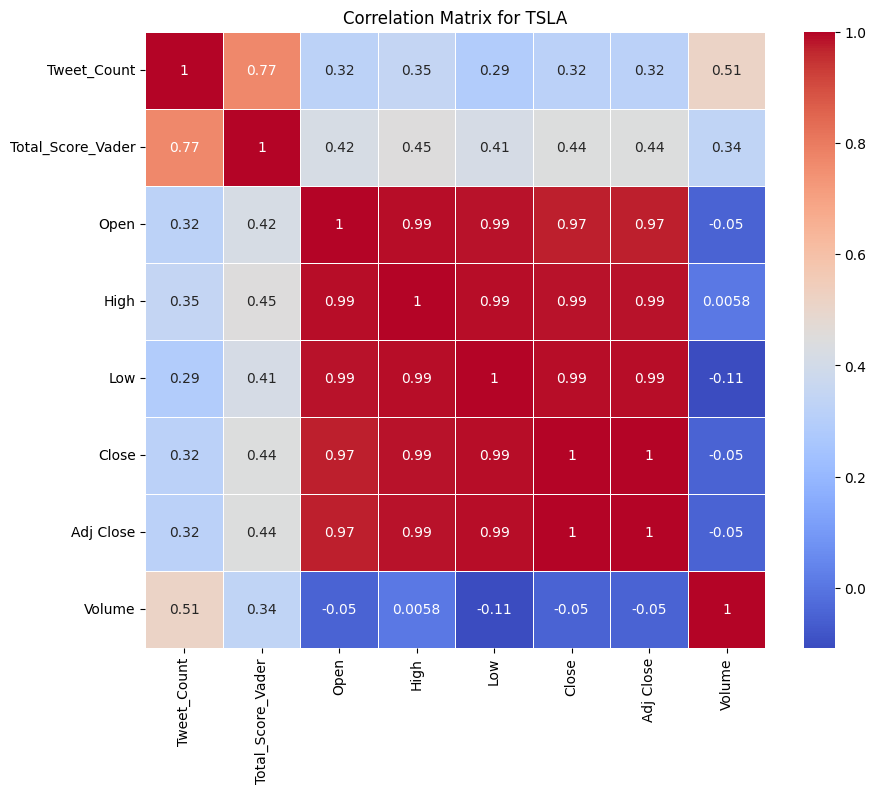

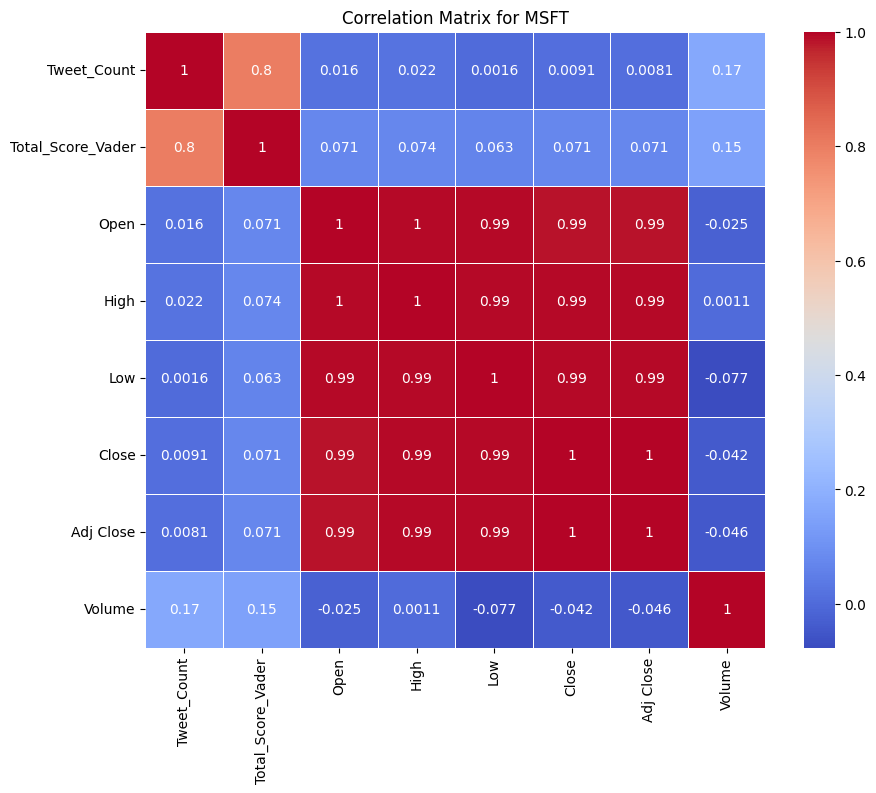

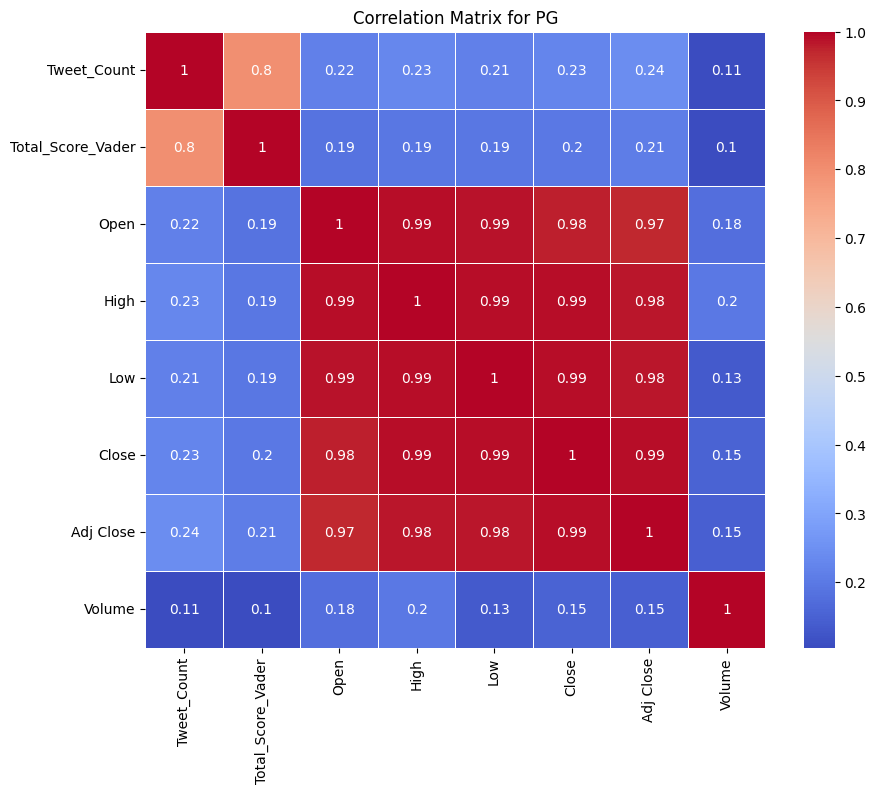

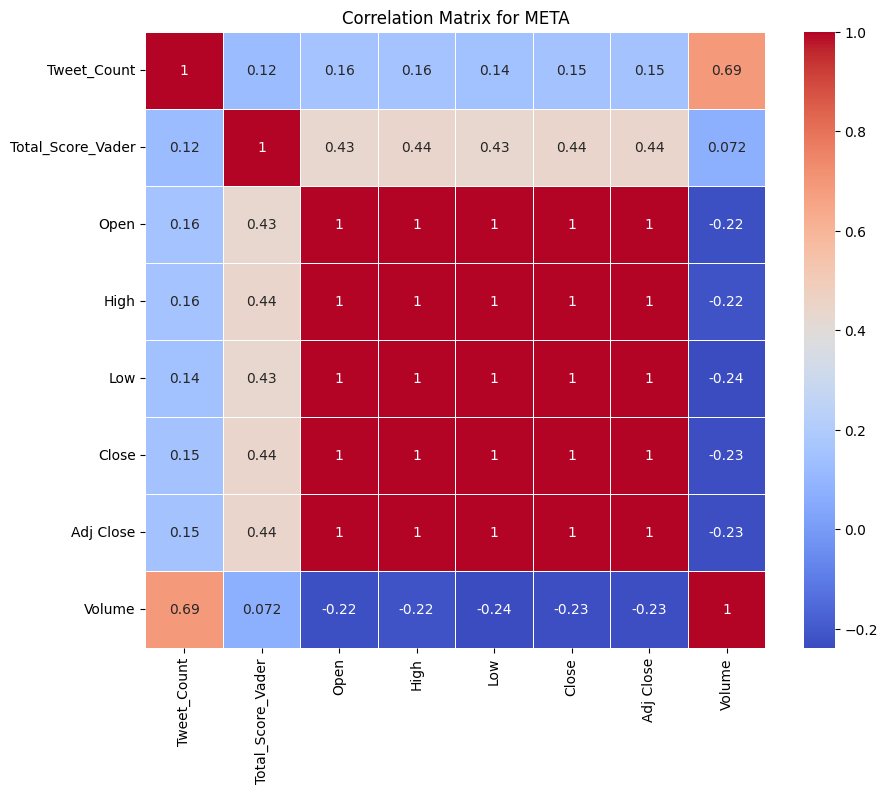

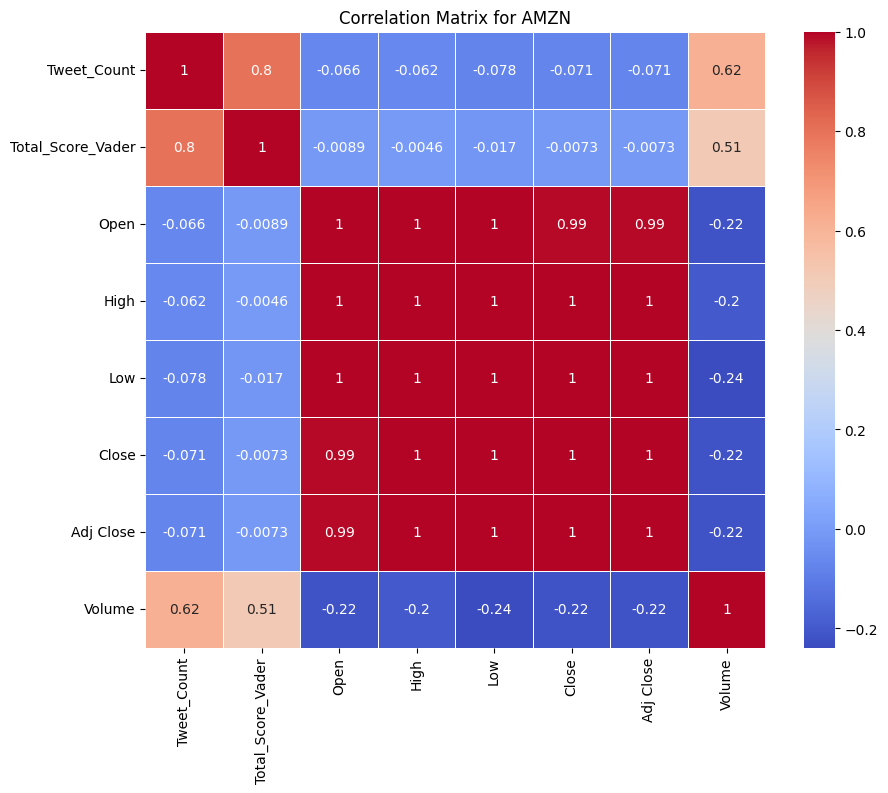

...

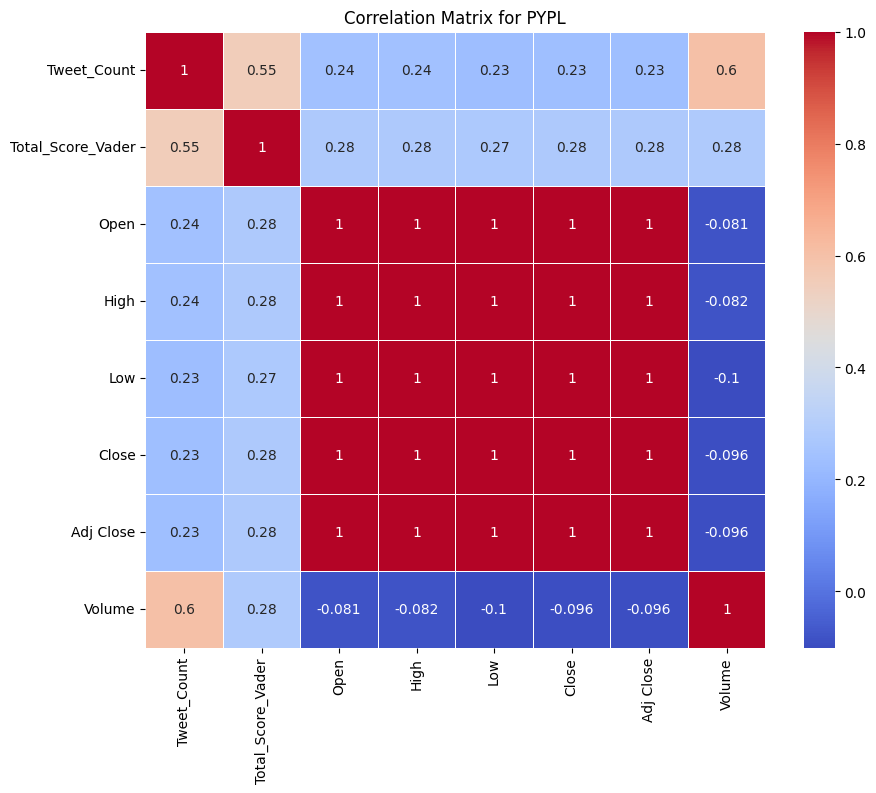

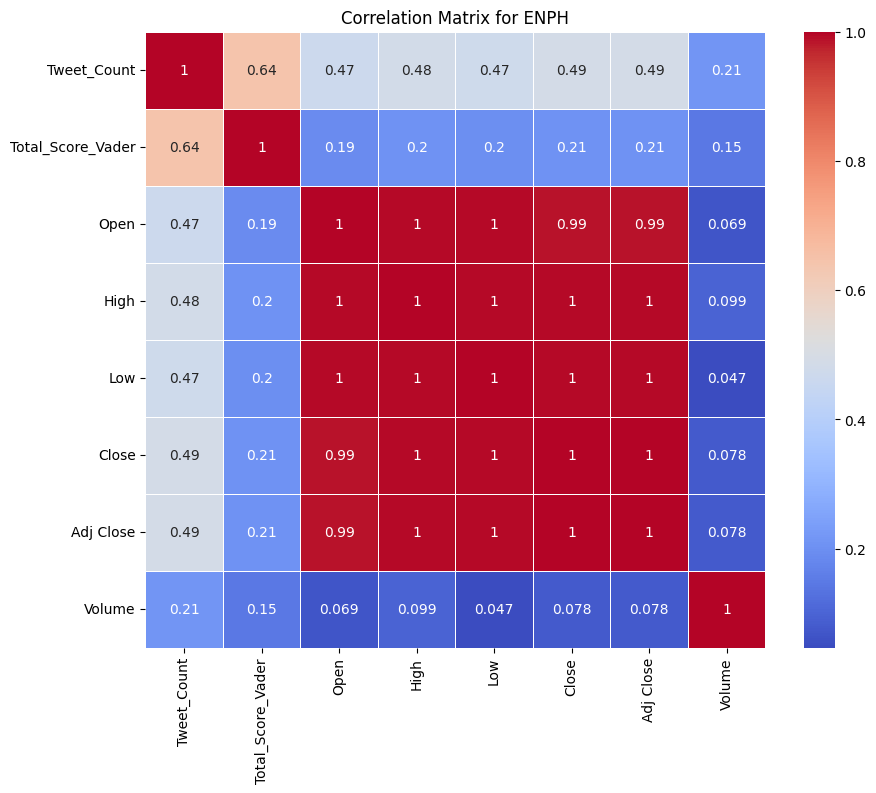

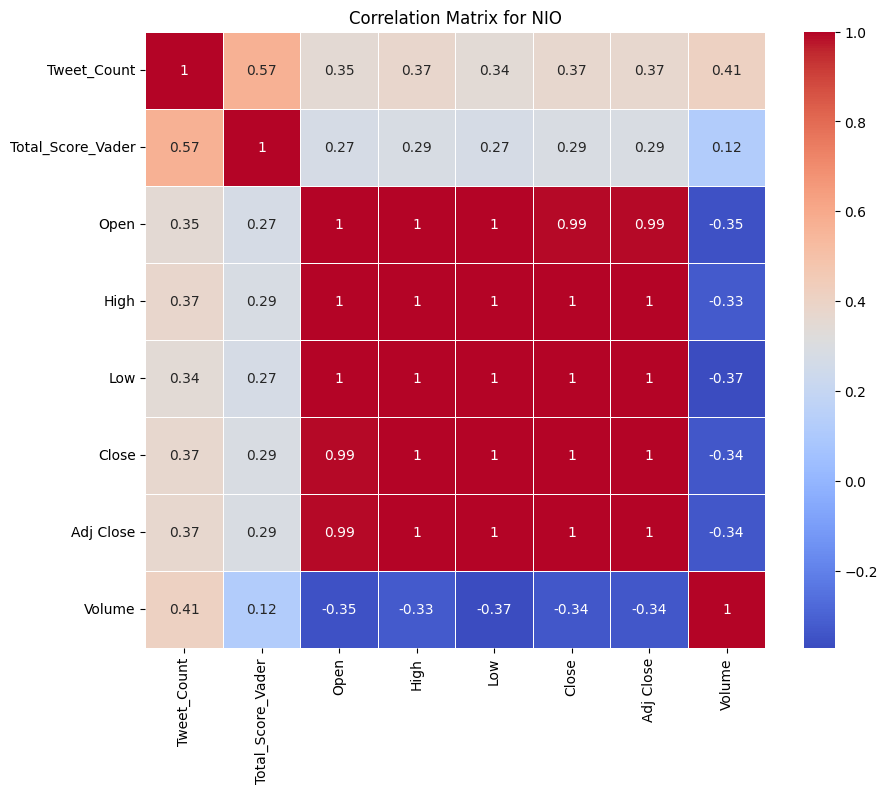

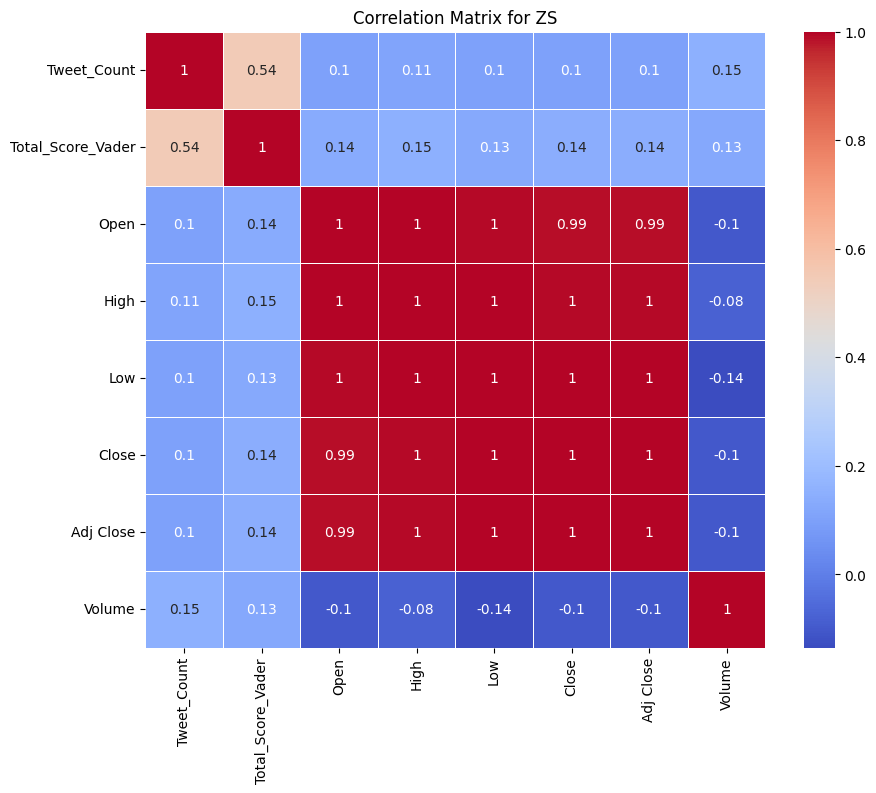

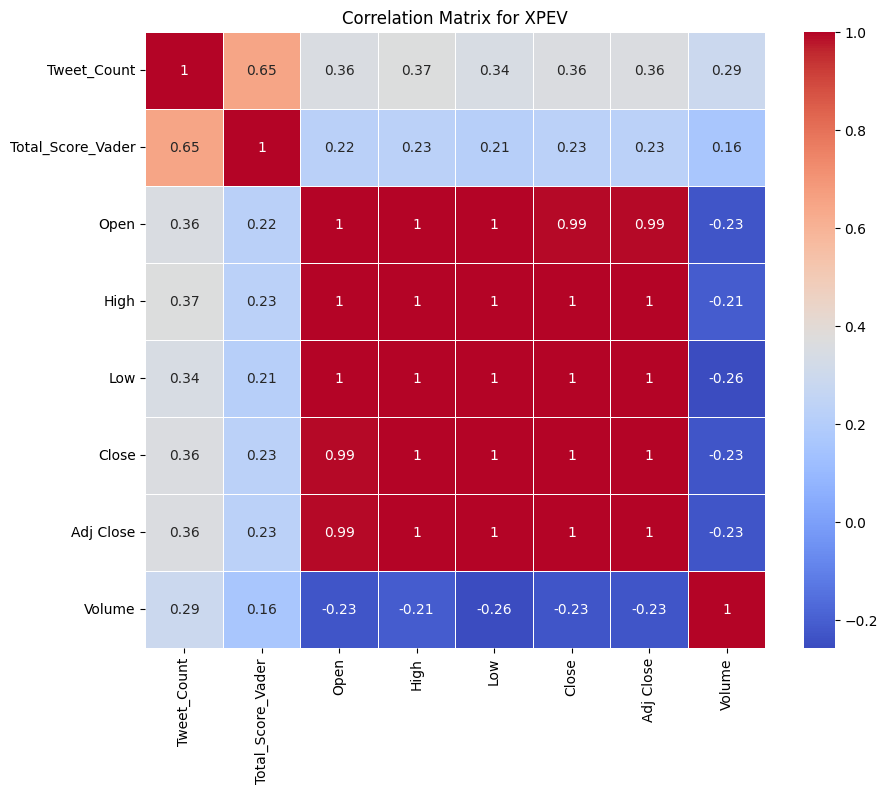

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Iterate through each unique stock name and plot a heatmap
for stock in df['Stock Name'].unique():
    df_stock = df[df['Stock Name'] == stock]

    # Select relevant columns
    numerical_cols = ['Tweet_Count', 'Total_Score_Vader', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

    # Compute the correlation matrix
    correlation_matrix = df_stock[numerical_cols].corr()

    # Plot the correlation matrix as a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title(f'Correlation Matrix for {stock}')
    plt.show()

<ipython-input-37-7fb2041d86cf>:8: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)


   Stock Name  Pearson Correlation       p-value
0        TSLA             0.444535  1.247336e-13
1        MSFT             0.070798  2.628430e-01
2          PG             0.209594  8.142026e-04
3        META             0.440038  2.337274e-13
4        AMZN            -0.007272  9.085547e-01
5        GOOG             0.023581  7.094999e-01
6         AMD             0.298247  1.427231e-06
7        AAPL             0.149985  1.719096e-02
8        NFLX             0.142953  2.322640e-02
9         TSM             0.110922  7.883285e-02
10         KO             0.149067  1.789226e-02
11          F            -0.020419  7.470296e-01
12       COST             0.011701  8.533665e-01
13        DIS             0.161860  1.006265e-02
14         VZ            -0.255450  4.073477e-05
15        CRM             0.053412  3.985168e-01
16       INTC            -0.079105  2.107620e-01
17         BA             0.333918  5.600256e-08
18         BX             0.010041  8.739720e-01
19        NOC       

<ipython-input-37-7fb2041d86cf>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Stock Name', y='Pearson Correlation', data=correlation_results_df, palette='coolwarm')


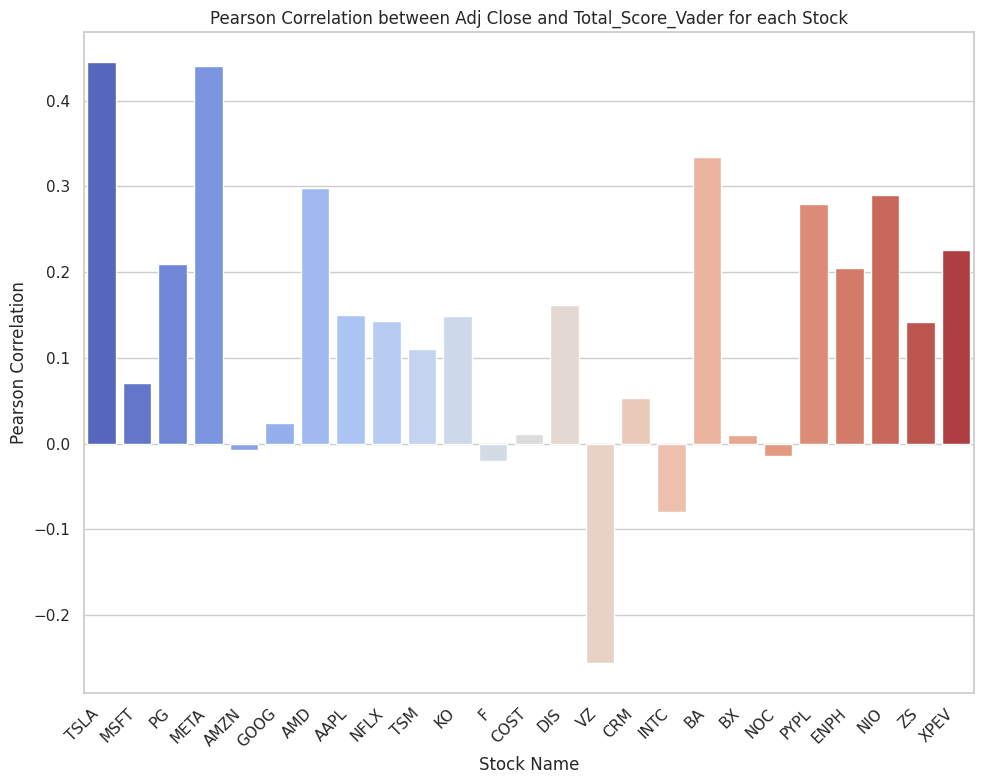

P-values for each stock:
   Stock Name       p-value
0        TSLA  1.247336e-13
1        MSFT  2.628430e-01
2          PG  8.142026e-04
3        META  2.337274e-13
4        AMZN  9.085547e-01
5        GOOG  7.094999e-01
6         AMD  1.427231e-06
7        AAPL  1.719096e-02
8        NFLX  2.322640e-02
9         TSM  7.883285e-02
10         KO  1.789226e-02
11          F  7.470296e-01
12       COST  8.533665e-01
13        DIS  1.006265e-02
14         VZ  4.073477e-05
15        CRM  3.985168e-01
16       INTC  2.107620e-01
17         BA  5.600256e-08
18         BX  8.739720e-01
19        NOC  8.158752e-01
20       PYPL  6.696027e-06
21       ENPH  1.061031e-03
22        NIO  2.930666e-06
23         ZS  2.423092e-02
24       XPEV  3.016402e-04


In [ ]:
import pandas as pd
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Select relevant columns
cols = ['Stock Name', 'Adj Close', 'Total_Score_Vader']
df = df[cols]

# Ensure there are no missing values
df.dropna(inplace=True)

# Initialize an empty list to store correlation results
correlation_results = []

# Calculate Pearson correlation coefficient and p-value for each stock
for stock in df['Stock Name'].unique():
    df_stock = df[df['Stock Name'] == stock]
    corr, p_value = pearsonr(df_stock['Total_Score_Vader'], df_stock['Adj Close'])
    correlation_results.append({'Stock Name': stock, 'Pearson Correlation': corr, 'p-value': p_value})

# Convert the list to a DataFrame
correlation_results_df = pd.DataFrame(correlation_results)

# Print the results
print(correlation_results_df)

# Optionally, plot the Pearson correlation as a bar chart
plt.figure(figsize=(10, 8))
sns.barplot(x='Stock Name', y='Pearson Correlation', data=correlation_results_df, palette='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.title('Pearson Correlation between Adj Close and Total_Score_Vader for each Stock')
plt.ylabel('Pearson Correlation')
plt.xlabel('Stock Name')
plt.tight_layout()
plt.show()

# Display p-values if needed
print("P-values for each stock:")
print(correlation_results_df[['Stock Name', 'p-value']])

<ipython-input-22-ead2889c5e3e>:7: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)


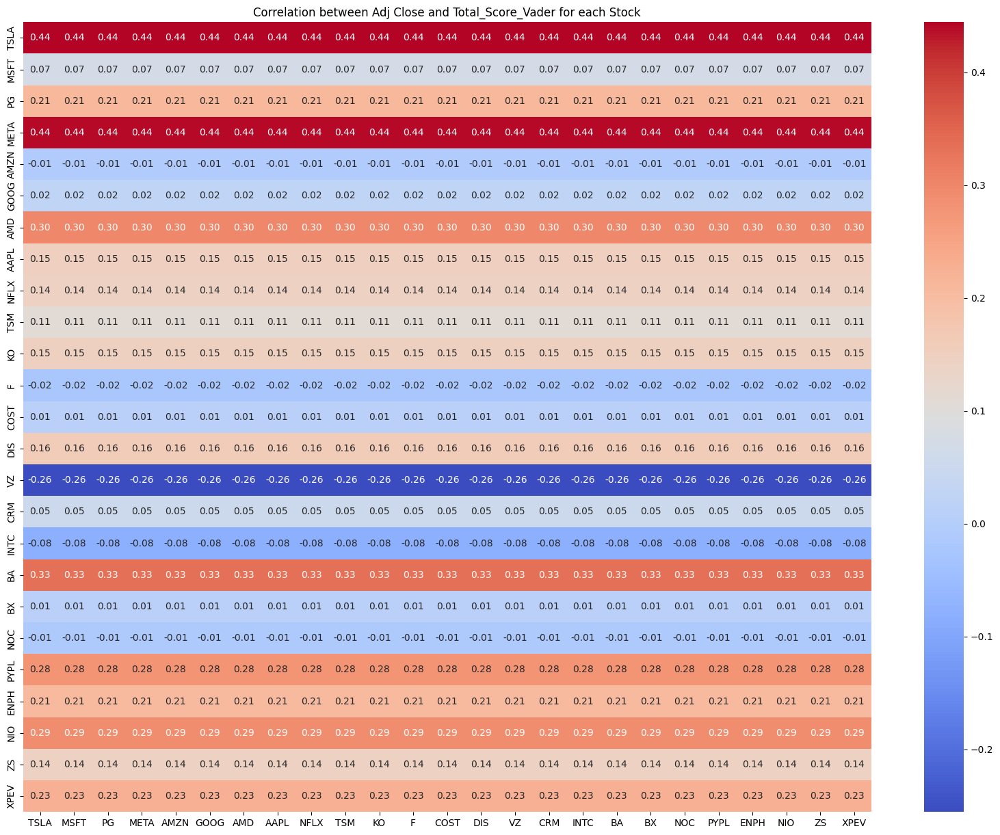

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Select relevant columns
cols = ['Stock Name', 'Adj Close', 'Total_Score_Vader']
df = df[cols]

# Ensure there are no missing values
df.dropna(inplace=True)

# Initialize a DataFrame to store correlation results
correlation_matrix = pd.DataFrame(index=df['Stock Name'].unique(), columns=['Correlation'])

# Calculate correlation for each stock
for stock in df['Stock Name'].unique():
    df_stock = df[df['Stock Name'] == stock]
    correlation = df_stock['Adj Close'].corr(df_stock['Total_Score_Vader'])
    correlation_matrix.loc[stock] = correlation

# Pivot the DataFrame to create a square matrix (though it'll only have one column)
correlation_matrix = correlation_matrix.astype(float)

# Since we want a heatmap, we create a redundant matrix with the same values on both axes
redundant_matrix = pd.DataFrame(index=correlation_matrix.index, columns=correlation_matrix.index)

# Fill the redundant matrix with the correlation values
for stock in correlation_matrix.index:
    redundant_matrix[stock] = correlation_matrix['Correlation']

# Plotting the correlation heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(redundant_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Adj Close and Total_Score_Vader for each Stock')
plt.show()

<ipython-input-1-36a812aae07f>:9: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  data['Date'] = pd.to_datetime(data['Date'])


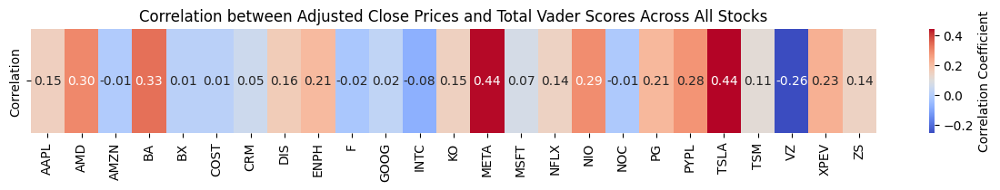

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the merged dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')

# Convert the Date column to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Ensure all data is numeric for processing
data['Adj Close'] = pd.to_numeric(data['Adj Close'], errors='coerce')
data['Total_Score_Vader'] = pd.to_numeric(data['Total_Score_Vader'], errors='coerce')

# Initialize an empty DataFrame to store correlations
correlation_data = pd.DataFrame()

# Group data by Stock_Name
grouped = data.groupby('Stock Name')

# Calculate correlations for each stock and append to the DataFrame
for name, group in grouped:
    # Compute the correlation between Adj_Close and Total_Score_Vader
    correlation = group[['Adj Close', 'Total_Score_Vader']].corr().iloc[0, 1]  # Get the correlation value
    correlation_data.at[name, 'Correlation'] = correlation

# Reshape the DataFrame for heatmap
correlation_data = correlation_data.T  # Transpose to fit heatmap format

# Plotting the correlation heatmap
plt.figure(figsize=(15, 1.5))  # Size might need adjusting based on the number of stocks
sns.heatmap(correlation_data, annot=True, cmap='coolwarm', fmt=".2f", cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation between Adjusted Close Prices and Total Vader Scores Across All Stocks')
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the merged dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')

# Convert 'Date' column to datetime and sort by Date
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data.sort_values(by='Date')

# Define the tech stocks and date range
tech_list = ['TSLA', 'AMD', 'BA', 'META','MSFT','GOOG','AMZN','AAPL']
start_date = '2021-09-30'
end_date = '2022-09-30'

# Filter data for the selected tech stocks and date range
filtered_data = data[(data['Stock Name'].isin(tech_list)) &
                     (data['Date'] >= start_date) & (data['Date'] <= end_date)]

# Map company names for easy reference
company_names = {
    'TSLA': 'Tesla',
    'AMD': 'Advanced Micro Devices',
    'BA': 'Boeing',
    'META': 'Meta Platforms',
    'MSFT': 'Microsoft',
    'GOOG': 'Google',
    'AMZN': 'Amazon',
    'AAPL': 'Apple'
}
filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)

# Display the first few entries and a summary of the dataset
print(filtered_data.head())
print(filtered_data.describe(include='all'))

# Set up the figure and axes for plotting adjusted close prices
plt.figure(figsize=(15, 15))
plt.subplots_adjust(top=1.25, bottom=1.2)

# Loop through each company DataFrame and plot the 'Adj Close' on a separate subplot
for i, (stock, company_name) in enumerate(company_names.items(), 1):
    ax = plt.subplot(3, 3, i)  # Adjusted for 3x3 grid
    filtered_data[filtered_data['Stock Name'] == stock]['Adj Close'].plot(ax=ax)
    plt.ylabel('Adjusted Close')
    plt.title(f"Adj Closing Price of {company_name}")

plt.tight_layout()
plt.show()

# Now let's plot the total volume of stock being traded each day
plt.figure(figsize=(15, 15))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, (stock, company_name) in enumerate(company_names.items(), 1):
    ax = plt.subplot(3, 3, i)  # Adjusted for 3x3 grid
    filtered_data[filtered_data['Stock Name'] == stock]['Volume'].plot(ax=ax)
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Trading Volume for {company_name}")

plt.tight_layout()
plt.show()

# Calculate daily returns
company_list = {name: filtered_data[filtered_data['Stock Name'] == name].copy() for name in tech_list}

for name, company in company_list.items():
    company['Daily Return'] = company['Adj Close'].pct_change()
    company_list[name] = company  # Update the dictionary with modified DataFrame

# Then we'll plot the daily return percentage
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.subplots_adjust(top=1.25, bottom=1.2)

# Plotting each company's daily returns
for i, (name, company) in enumerate(company_list.items()):
    row, col = divmod(i, 3)
    ax = axes[row, col]
    company['Daily Return'].plot(ax=ax, legend=True, linestyle='--', marker='o')
    ax.set_title(company_names[name])

# Remove empty subplots
for j in range(i + 1, 9):
    fig.delaxes(axes.flatten()[j])

fig.tight_layout()
plt.show()

# Pivot data for adjusted close prices and sentiment scores
closing_scores_df = filtered_data.pivot_table(index='Date', columns='Stock Name', values=['Adj Close'])

# Flatten the DataFrame columns
closing_scores_df.columns = ['_'.join(col).strip() for col in closing_scores_df.columns.values]

# Calculate the correlation matrix for adjusted close and sentiment
corr_matrix = closing_scores_df.corr().filter(like='Adj Close').filter(like='Total_Score_Vader', axis=0)

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", center=0)
plt.title('Correlation Between Adjusted Close Prices and Vader Scores')
plt.show()

# Calculate the daily returns for risk analysis
tech_rets = closing_scores_df.filter(like='Adj Close').pct_change().dropna()

# Debug: Print mean and standard deviation of daily returns
print("Mean daily returns:")
print(tech_rets.mean())
print("\nStandard deviation of daily returns:")
print(tech_rets.std())

# Risk-return scatter plot
area = np.pi * 20  # Size of the scatter points
plt.figure(figsize=(10, 7))
plt.scatter(tech_rets.mean(), tech_rets.std(), s=area)
plt.xlabel('Expected Return')
plt.ylabel('Risk')
for label, x, y in zip(tech_rets.columns, tech_rets.mean(), tech_rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(10, 10), textcoords='offset points', ha='right', va='bottom',
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))
plt.title('Risk vs Return')
plt.grid(True)
plt.show()

<ipython-input-38-249073b488e2>:10: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
<ipython-input-38-249073b488e2>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)


           Date        Open        High         Low       Close   Adj Close  \
0    2021-09-30  260.333344  263.043335  258.333344  258.493347  258.493347   
252  2021-09-30  285.709991  287.829987  281.619995  281.920013  278.792847   
1008 2021-09-30  165.800003  166.392502  163.699493  164.251999  164.251999   
4284 2021-09-30  226.080002  226.149994  219.460007  219.940002  219.940002   
1764 2021-09-30  143.660004  144.380005  141.279999  141.500000  140.478485   

        Volume Stock Name  Tweet_Count  Total_Score_Vader  \
0     53868000       TSLA         90.0            15.4504   
252   32343600       MSFT          5.0             1.2850   
1008  56848000       AMZN          5.0             1.2850   
4284  10366900         BA          0.0             0.0000   
1764  89056700       AAPL          7.0             0.5054   

      Total_Class_Vader_Mapped class_vader  class_vader_mapped Company_Name  
0                         29.0    positive                 1.0        Tesla  
25

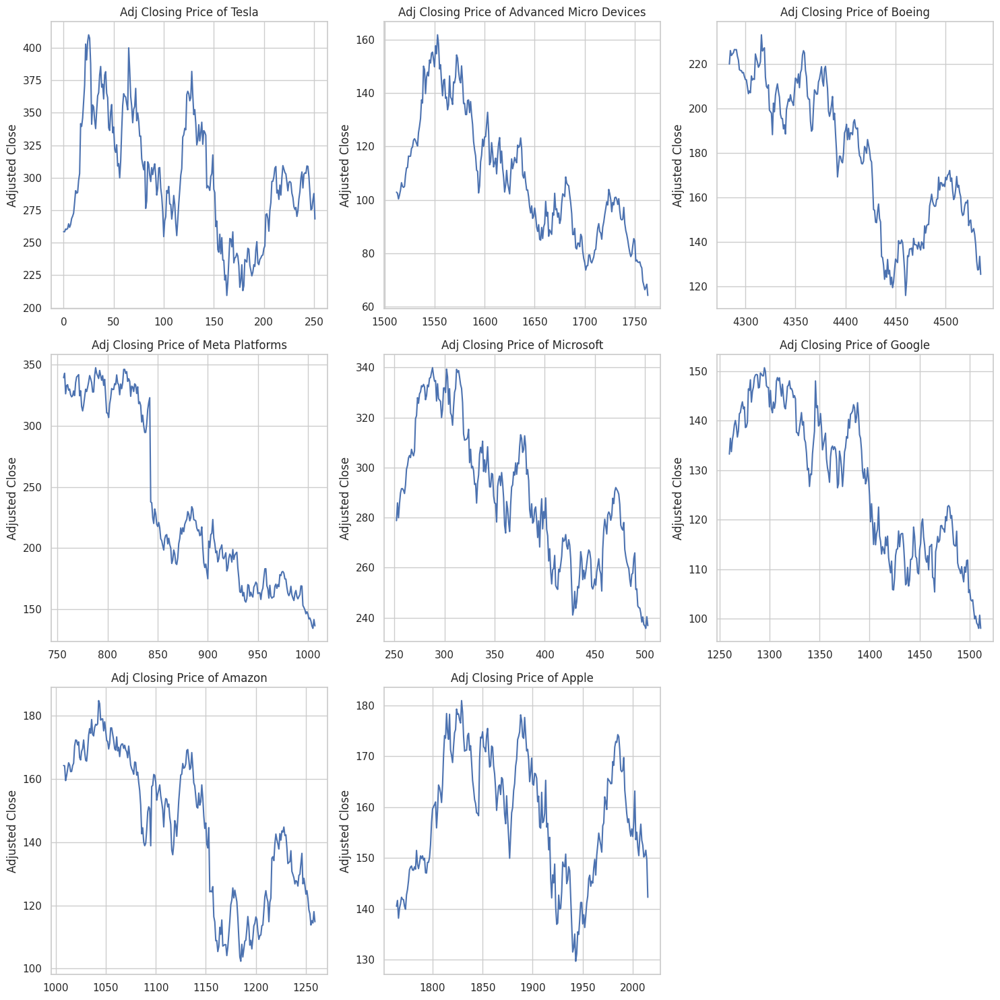

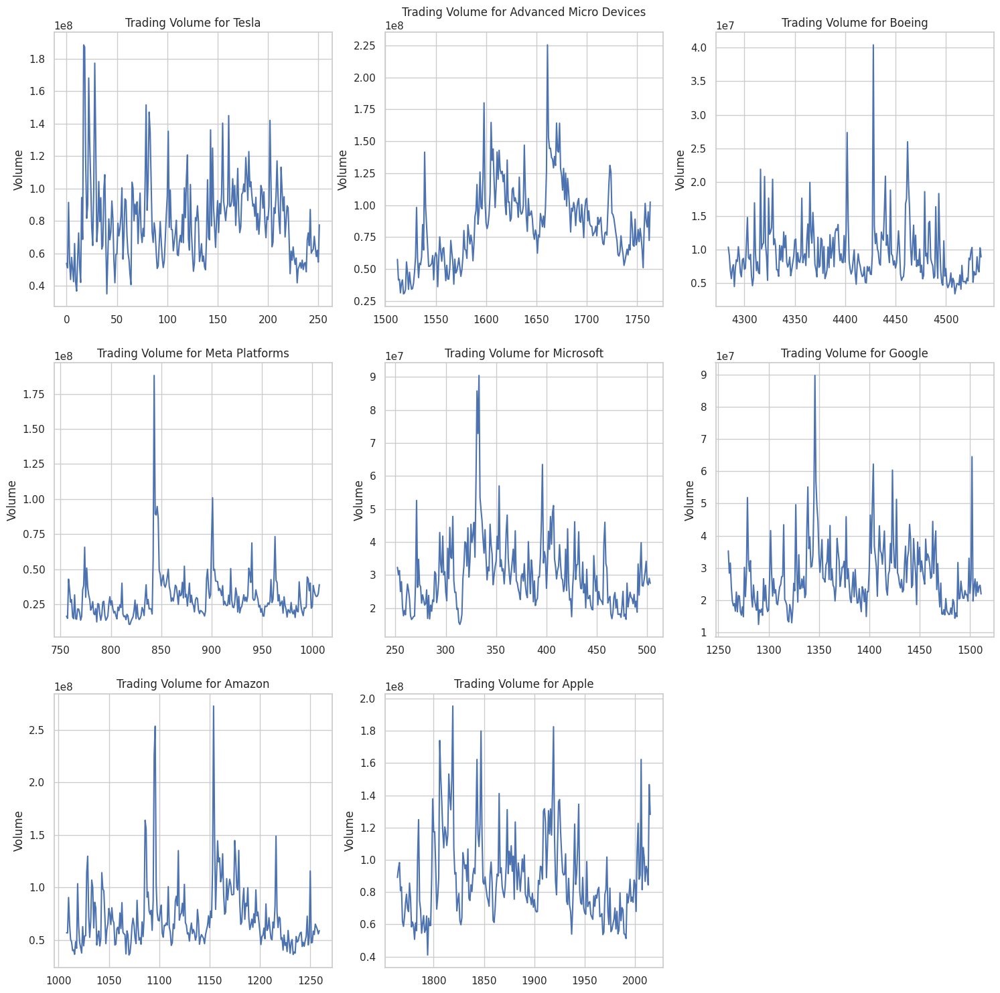

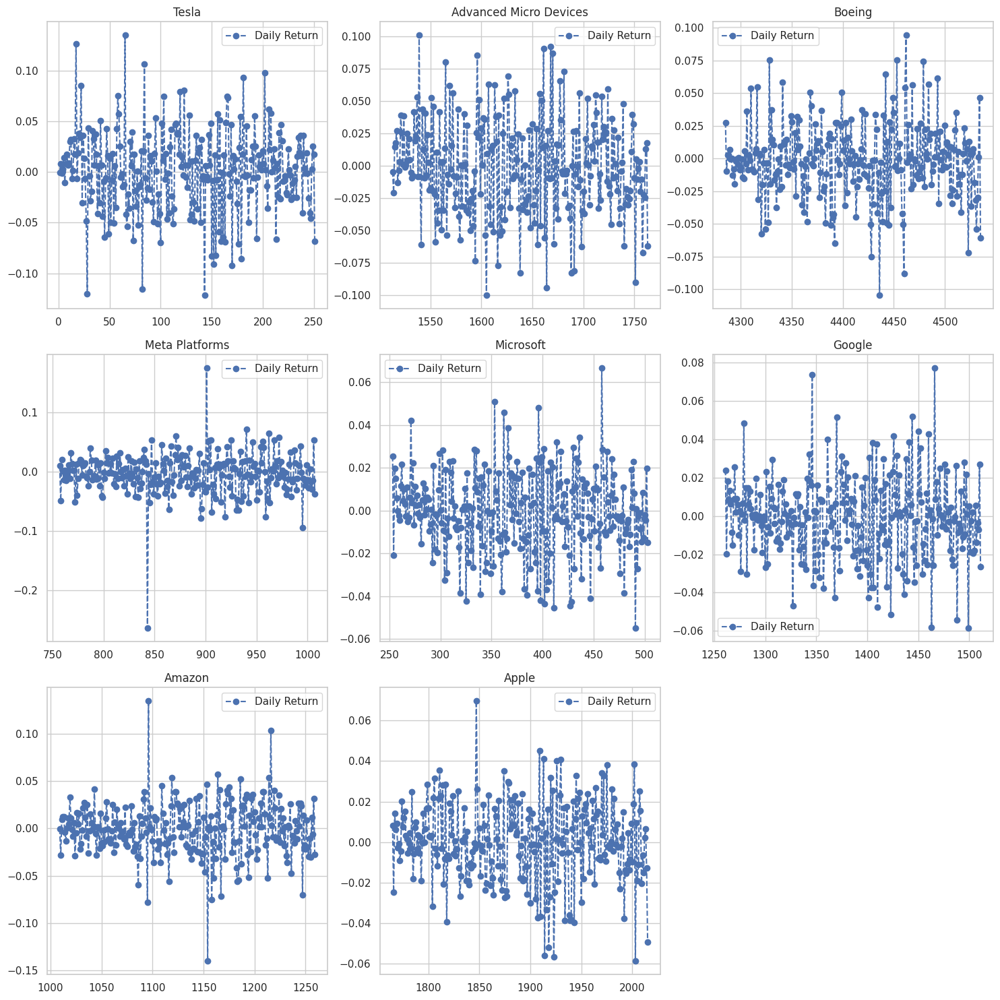

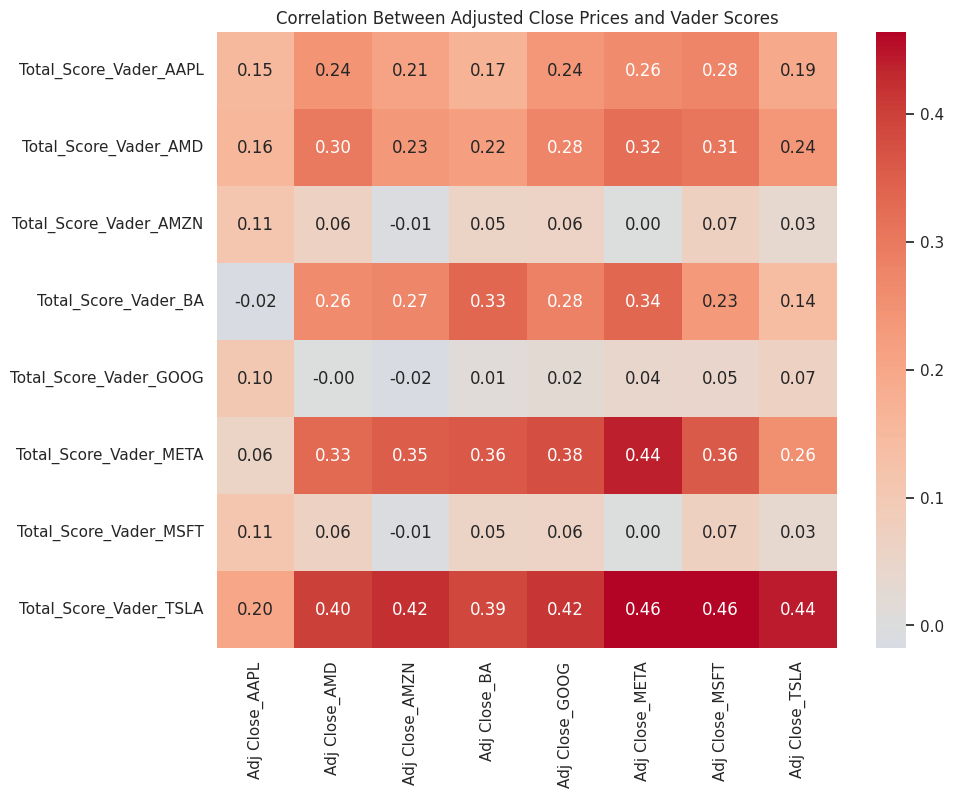

Mean daily returns:
Adj Close_AAPL    0.000251
Adj Close_AMD    -0.001185
Adj Close_AMZN   -0.001017
Adj Close_BA     -0.001822
Adj Close_GOOG   -0.000985
Adj Close_META   -0.002984
Adj Close_MSFT   -0.000458
Adj Close_TSLA    0.000971
dtype: float64

Standard deviation of daily returns:
Adj Close_AAPL    0.020062
Adj Close_AMD     0.037373
Adj Close_AMZN    0.028581
Adj Close_BA      0.028862
Adj Close_GOOG    0.021730
Adj Close_META    0.035138
Adj Close_MSFT    0.019586
Adj Close_TSLA    0.040606
dtype: float64


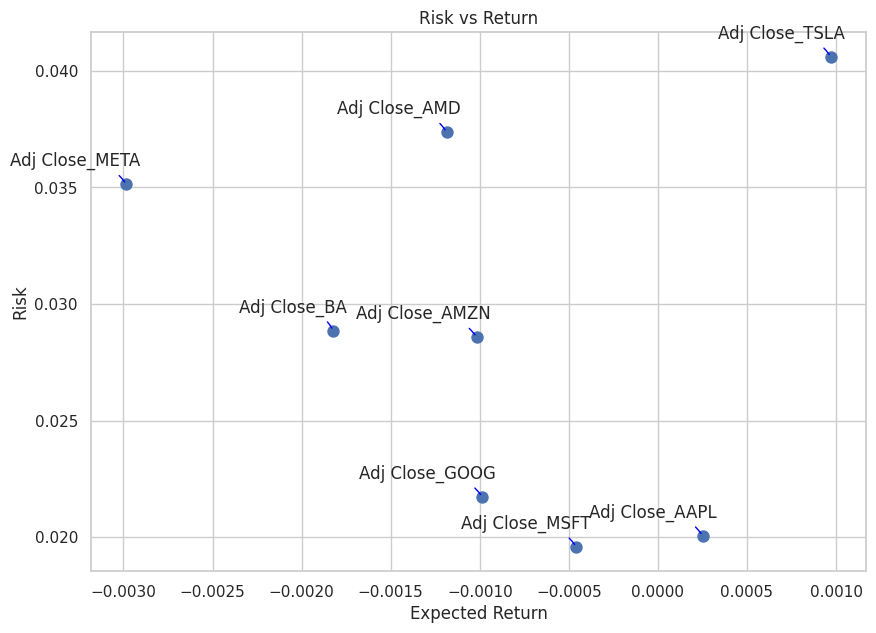

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the merged dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')

# Convert 'Date' column to datetime and sort by Date
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data.sort_values(by='Date')

# Define the tech stocks and date range
tech_list = ['TSLA', 'AMD', 'BA', 'META','MSFT','GOOG','AMZN','AAPL']
start_date = '2021-09-30'
end_date = '2022-09-30'

# Filter data for the selected tech stocks and date range
filtered_data = data[(data['Stock Name'].isin(tech_list)) &
                     (data['Date'] >= start_date) & (data['Date'] <= end_date)]

# Map company names for easy reference
company_names = {
    'TSLA': 'Tesla',
    'AMD': 'Advanced Micro Devices',
    'BA': 'Boeing',
    'META': 'Meta Platforms',
    'MSFT': 'Microsoft',
    'GOOG': 'Google',
    'AMZN': 'Amazon',
    'AAPL': 'Apple'
}
filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)

# Display the first few entries and a summary of the dataset
print(filtered_data.head())
print(filtered_data.describe(include='all'))

# Set up the figure and axes for plotting adjusted close prices
plt.figure(figsize=(15, 15))
plt.subplots_adjust(top=1.25, bottom=1.2)

# Loop through each company DataFrame and plot the 'Adj Close' on a separate subplot
for i, (stock, company_name) in enumerate(company_names.items(), 1):
    ax = plt.subplot(3, 3, i)  # Adjusted for 3x3 grid
    filtered_data[filtered_data['Stock Name'] == stock]['Adj Close'].plot(ax=ax)
    plt.ylabel('Adjusted Close')
    plt.title(f"Adj Closing Price of {company_name}")

plt.tight_layout()
plt.show()

# Now let's plot the total volume of stock being traded each day
plt.figure(figsize=(15, 15))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, (stock, company_name) in enumerate(company_names.items(), 1):
    ax = plt.subplot(3, 3, i)  # Adjusted for 3x3 grid
    filtered_data[filtered_data['Stock Name'] == stock]['Volume'].plot(ax=ax)
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Trading Volume for {company_name}")

plt.tight_layout()
plt.show()

# Calculate daily returns
company_list = {name: filtered_data[filtered_data['Stock Name'] == name].copy() for name in tech_list}

for name, company in company_list.items():
    company['Daily Return'] = company['Adj Close'].pct_change()
    company_list[name] = company  # Update the dictionary with modified DataFrame

# Then we'll plot the daily return percentage
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.subplots_adjust(top=1.25, bottom=1.2)

# Plotting each company's daily returns
for i, (name, company) in enumerate(company_list.items()):
    row, col = divmod(i, 3)
    ax = axes[row, col]
    company['Daily Return'].plot(ax=ax, legend=True, linestyle='--', marker='o')
    ax.set_title(company_names[name])

# Remove empty subplots
for j in range(i + 1, 9):
    fig.delaxes(axes.flatten()[j])

fig.tight_layout()
plt.show()

# Pivot data for adjusted close prices and sentiment scores
closing_scores_df = filtered_data.pivot_table(index='Date', columns='Stock Name', values=['Adj Close', 'Total_Score_Vader'])

# Flatten the DataFrame columns
closing_scores_df.columns = ['_'.join(col).strip() for col in closing_scores_df.columns.values]

# Calculate the correlation matrix for adjusted close and sentiment
corr_matrix = closing_scores_df.corr().filter(like='Adj Close').filter(like='Total_Score_Vader', axis=0)

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", center=0)
plt.title('Correlation Between Adjusted Close Prices and Vader Scores')
plt.show()

# Calculate the daily returns for risk analysis
tech_rets = closing_scores_df.filter(like='Adj Close').pct_change().dropna()

# Debug: Print mean and standard deviation of daily returns
print("Mean daily returns:")
print(tech_rets.mean())
print("\nStandard deviation of daily returns:")
print(tech_rets.std())

# Risk-return scatter plot
area = np.pi * 20  # Size of the scatter points
plt.figure(figsize=(10, 7))
plt.scatter(tech_rets.mean(), tech_rets.std(), s=area)
plt.xlabel('Expected Return')
plt.ylabel('Risk')
for label, x, y in zip(tech_rets.columns, tech_rets.mean(), tech_rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(10, 10), textcoords='offset points', ha='right', va='bottom',
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))
plt.title('Risk vs Return')
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
data_fill=pd.read_csv('/content/merged_dataset_with_fill.csv')
data_fill


,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Tweet_Count,Total_Score_Vader,Total_Class_Vader_Mapped,class_vader,class_vader_mapped
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,90.0,15.4504,29.0,positive,1.0
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA,94.0,20.5005,36.0,positive,1.0
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA,119.0,13.5758,30.0,positive,1.0
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA,88.0,10.8819,18.0,positive,1.0
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA,78.0,14.5005,32.0,positive,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6295,2022-09-23,13.090000,13.892000,12.860000,13.710000,13.710000,28279600,XPEV,0.0,0.0000,0.0,neutral,0.0
6296,2022-09-26,14.280000,14.830000,14.070000,14.370000,14.370000,27891300,XPEV,1.0,0.2500,1.0,positive,1.0
6297,2022-09-27,14.580000,14.800000,13.580000,13.710000,13.710000,21160800,XPEV,0.0,0.0000,0.0,neutral,0.0
6298,2022-09-28,13.050000,13.421000,12.690000,13.330000,13.330000,31799400,XPEV,0.0,0.0000,0.0,neutral,0.0


In [ ]:
import pandas as pd

# Assuming 'merged_df' is your DataFrame after merging stock and tweet data
# Let's load the DataFrame (this is just to simulate the environment, you already have your DataFrame)
# merged_df = pd.read_csv('path_to_your_merged_dataset.csv')

# Group by 'Stock Name' and count the number of entries for each stock
data_availability = data_fill.groupby('Stock Name').size().reset_index(name='Number_of_Records')

# Sort by the number of records in descending order for easier analysis
data_availability = data_availability.sort_values(by='Number_of_Records', ascending=False)

# Display the result
print(data_availability)

   Stock Name  Number_of_Records
0        AAPL                252
13       META                252
23       XPEV                252
22         VZ                252
21        TSM                252
20       TSLA                252
19       PYPL                252
18         PG                252
17        NOC                252
16        NIO                252
15       NFLX                252
14       MSFT                252
12         KO                252
1         AMD                252
11       INTC                252
10       GOOG                252
9           F                252
8        ENPH                252
7         DIS                252
6         CRM                252
5        COST                252
4          BX                252
3          BA                252
2        AMZN                252
24         ZS                252


<ipython-input-25-878c6fa5defc>:10: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
<ipython-input-25-878c6fa5defc>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)


           Date        Open        High         Low       Close   Adj Close  \
0    2021-09-30  260.333344  263.043335  258.333344  258.493347  258.493347   
4284 2021-09-30  226.080002  226.149994  219.460007  219.940002  219.940002   
1512 2021-09-30  102.080002  104.440002  101.989998  102.900002  102.900002   
756  2021-09-30  340.450012  342.799988  338.149994  339.390015  339.390015   
757  2021-10-01  341.609985  345.019989  338.640015  343.010010  343.010010   

        Volume Stock Name  Tweet_Count  Total_Score_Vader  \
0     53868000       TSLA         90.0            15.4504   
4284  10366900         BA          0.0             0.0000   
1512  57636700        AMD          6.0             2.1210   
756   16547100       META          3.0             1.6674   
757   14905300       META         11.0             2.5355   

      Total_Class_Vader_Mapped class_vader  class_vader_mapped  \
0                         29.0    positive                 1.0   
4284                      

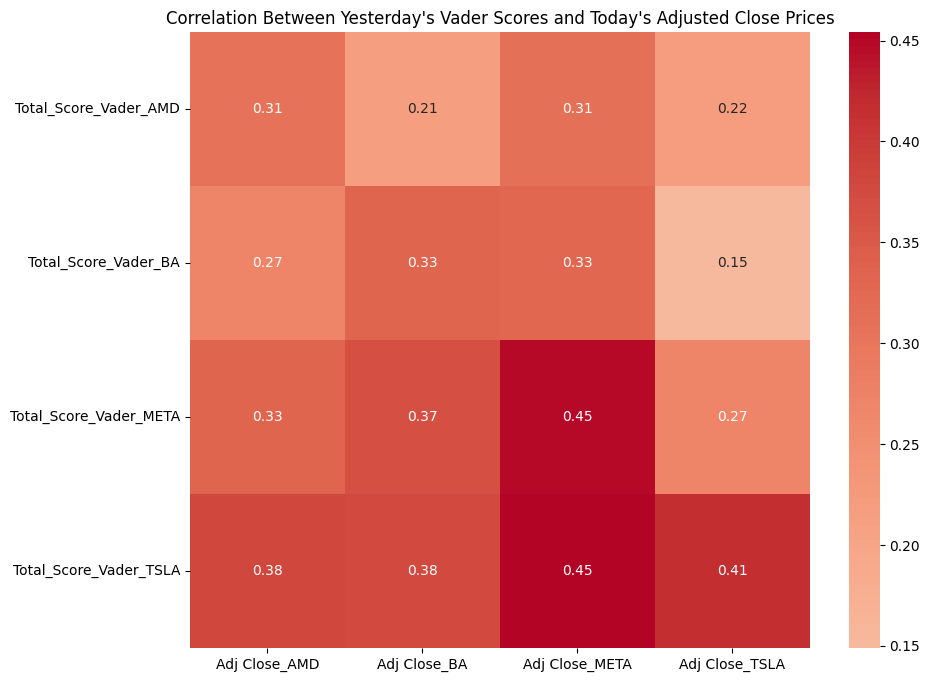

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the merged dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')

# Convert 'Date' column to datetime and sort by Date
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data.sort_values(by='Date')

# Define the tech stocks and date range
tech_list = ['TSLA', 'AMD', 'BA', 'META']
start_date = '2021-09-30'
end_date = '2022-09-30'

# Filter data for the selected tech stocks and date range
filtered_data = data[(data['Stock Name'].isin(tech_list)) &
                     (data['Date'] >= start_date) & (data['Date'] <= end_date)]

# Map company names for easy reference
company_names = {
    'TSLA': 'Tesla',
    'AMD': 'Advanced Micro Devices',
    'BA': 'Boeing',
    'META': 'Meta Platforms'
}
filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)

# Display the first few entries and a summary of the dataset
print(filtered_data.head())
print(filtered_data.describe(include='all'))

# Pivot data for adjusted close prices and sentiment scores
pivot_df = filtered_data.pivot_table(index='Date', columns='Stock Name', values=['Adj Close', 'Total_Score_Vader'])

# Flatten the DataFrame columns
pivot_df.columns = ['_'.join(col).strip() for col in pivot_df.columns.values]

# Shift sentiment scores by one day to match yesterday's sentiment with today's close prices
shifted_scores_df = pivot_df.filter(like='Total_Score_Vader').shift(1)

# Combine the shifted sentiment scores with the adjusted close prices
combined_df = pd.concat([pivot_df.filter(like='Adj Close'), shifted_scores_df], axis=1).dropna()

# Calculate the correlation matrix
corr_matrix_shifted = combined_df.corr().filter(like='Adj Close').filter(like='Total_Score_Vader', axis=0)

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_shifted, annot=True, cmap='coolwarm', fmt=".2f", center=0)
plt.title("Correlation Between Yesterday's Vader Scores and Today's Adjusted Close Prices")
plt.show()

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3156
Epoch 1: val_loss improved from inf to 0.09857, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2942 - val_loss: 0.0986 - learning_rate: 0.0010
Epoch 2/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 3s 632ms/step - loss: 0.2121
Epoch 2: val_loss improved from 0.09857 to 0.03595, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.1629 - val_loss: 0.0360 - learning_rate: 0.0010
Epoch 3/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 1s 179ms/step - loss: 0.1041
Epoch 3: val_loss improved from 0.03595 to 0.00538, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0687 - val_loss: 0.0054 - learning_rate: 0.0010
Epoch 4/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0424
Epoch 4: val_loss did not improve from 0.00538
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0286 - val_loss: 0.0094 - learning_rate: 0.0010
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0249  
Epoch

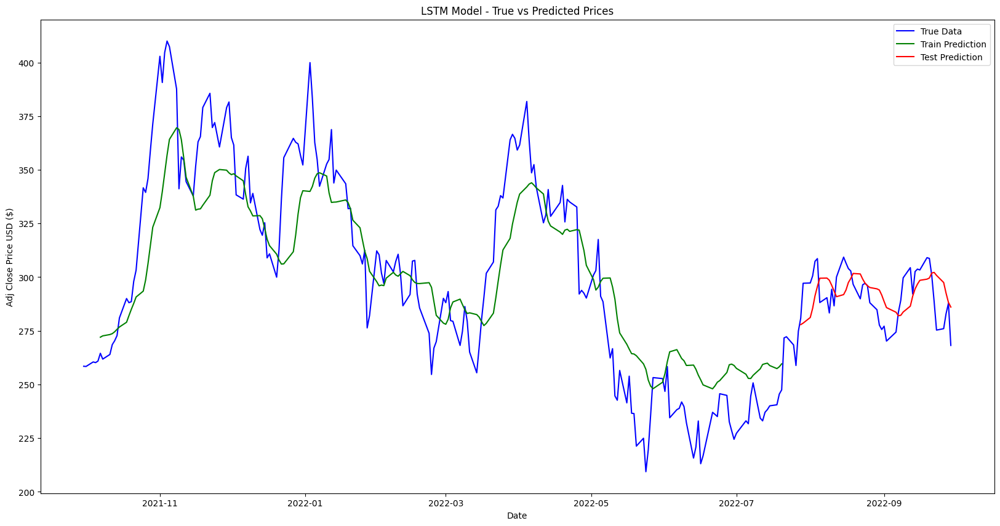

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━

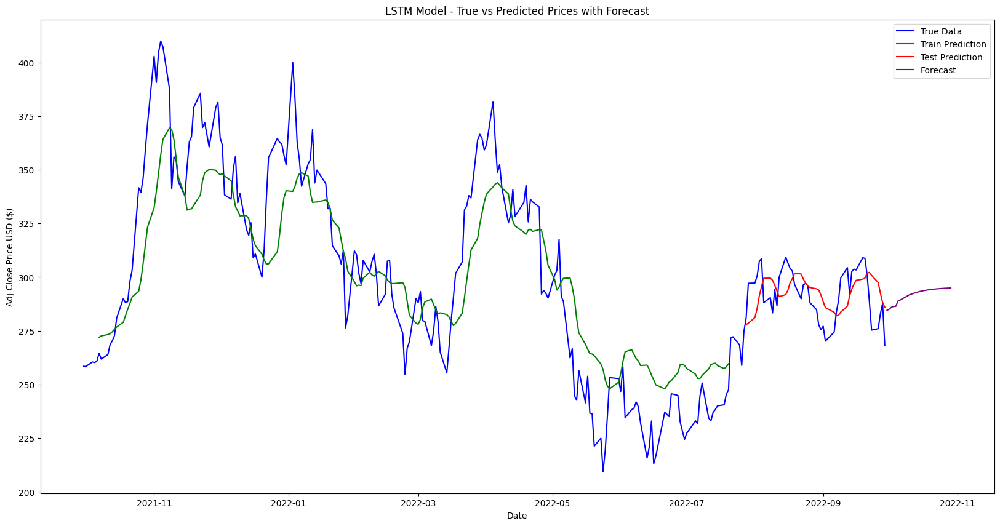

<Figure size 1400x700 with 0 Axes>

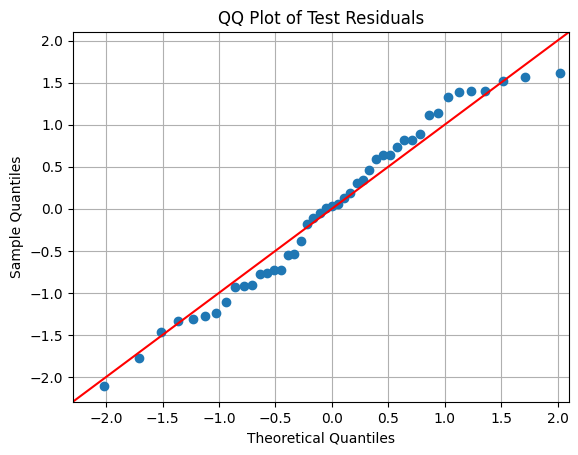

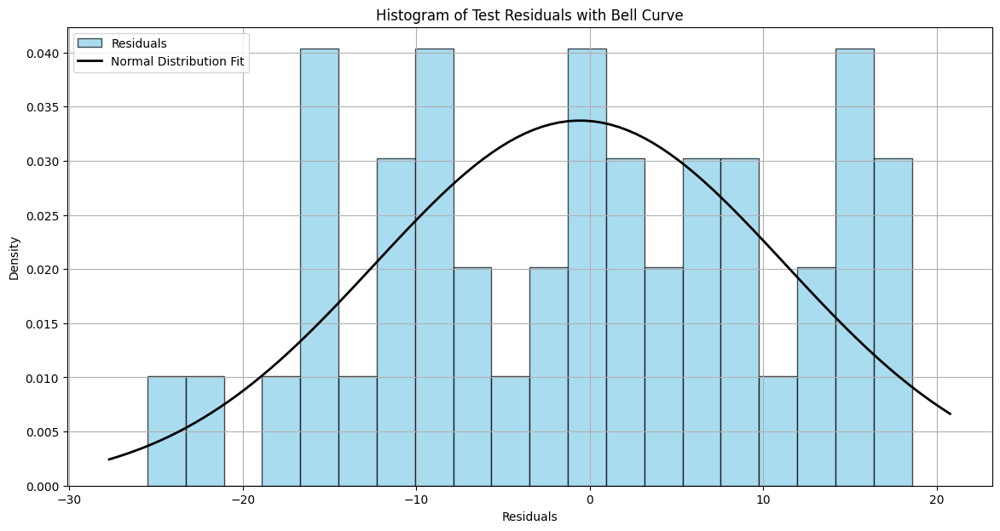

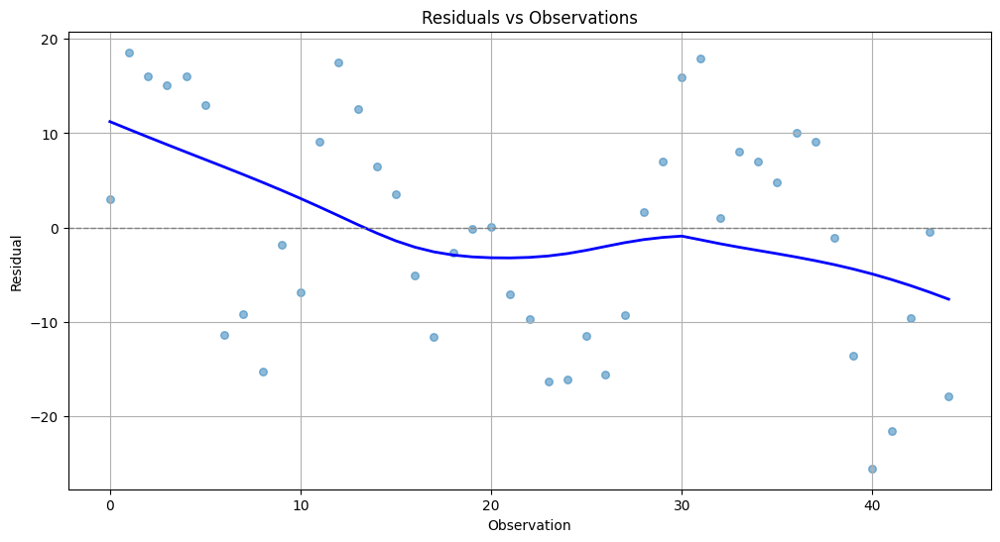

In [74]:
# univarient with considering only adj close as target lstm_1 layer
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import random
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step):
        a = dataset[i:(i + time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Build the LSTM model with one layer
model = Sequential([
    LSTM(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Fit the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict) + look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (look_back * 2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

# Calculate residuals
train_residuals = y_train - train_predict
test_residuals = y_test - test_predict

# Plot QQ Plot for residuals of the test set
plt.figure(figsize=(14, 7))
sm.qqplot(test_residuals, line='45', fit=True)
plt.title('QQ Plot of Test Residuals')
plt.grid(True)
plt.show()


# Fit a normal distribution to the test residuals
mu, std = norm.fit(test_residuals)

# Plot Histogram of the residuals for the test set with Bell Curve
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, density=True, alpha=0.7, edgecolor='k', color='skyblue', label='Residuals')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Normal Distribution Fit')
plt.title('Histogram of Test Residuals with Bell Curve')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

# Plot residuals vs observations with a Loess smoother
plt.figure(figsize=(12, 6))
sns.regplot(x=np.arange(len(test_residuals)), y=test_residuals, lowess=True, scatter_kws={'s': 30, 'alpha': 0.5}, line_kws={'color': 'blue', 'lw': 2})
plt.axhline(0, color='gray', linestyle='--', lw=1)
plt.title('Residuals vs Observations')
plt.xlabel('Observation')
plt.ylabel('Residual')
plt.grid(True)
plt.show()

In [58]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(y_test):],  # Corresponding dates from the test set
    'Actual': y_test,  # Actual values
    'Predicted': test_predict  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows of the comparison

First Forecasted Value: 284.56

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-28  280.899994  277.894496
1  2022-07-29  297.149994  278.577741
2  2022-08-01  297.276672  281.205747
3  2022-08-02  300.586670  285.486209
4  2022-08-03  307.396667  291.355136
5  2022-08-04  308.633331  295.684258
6  2022-08-05  288.170013  299.496608
7  2022-08-08  290.423340  299.562962
8  2022-08-09  283.333344  298.564792
9  2022-08-10  294.356659  296.198431
10 2022-08-11  286.630005  293.527349
11 2022-08-12  300.029999  290.897017
12 2022-08-15  309.320007  291.868035
13 2022-08-16  306.563324  294.000268
14 2022-08-17  303.996674  297.499815
15 2022-08-18  302.869995  299.355859
16 2022-08-19  296.666656  301.718239
17 2022-08-22  289.913330  301.484619
18 2022-08-23  296.453339  299.104030
19 2022-08-24  297.096680  297.201412
20 2022-08-25  296.070007  296.011175
21 2022-08-26  288.089996  295.172883
22 2022-08-29  284.820007  294.551229


Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - loss: 0.2416 - val_loss: 0.0599 - learning_rate: 0.0010
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0972 - val_loss: 0.0038 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0259 - val_loss: 0.0289 - learning_rate: 0.0010
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0338 - val_loss: 0.0063 - learning_rate: 0.0010
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0189 - val_loss: 0.0041 - learning_rate: 0.0010
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0217 - val_loss: 0.0038 - learning_rate: 0.0010
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0187 - val_loss: 0.0059 - learning_rate: 0.0010
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0180 - val_loss: 0.0055 - learning_rate: 5.0000e-04
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0169 - val_loss: 0.0048 - learning_rate: 5.0000e-04
Epoch 10/100
7/7 ━

<Figure size 1400x700 with 0 Axes>

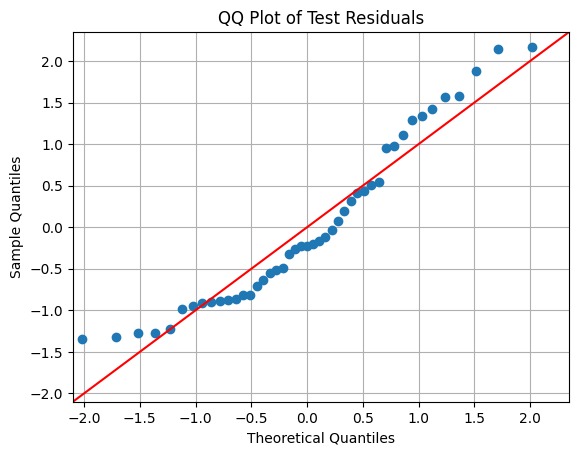

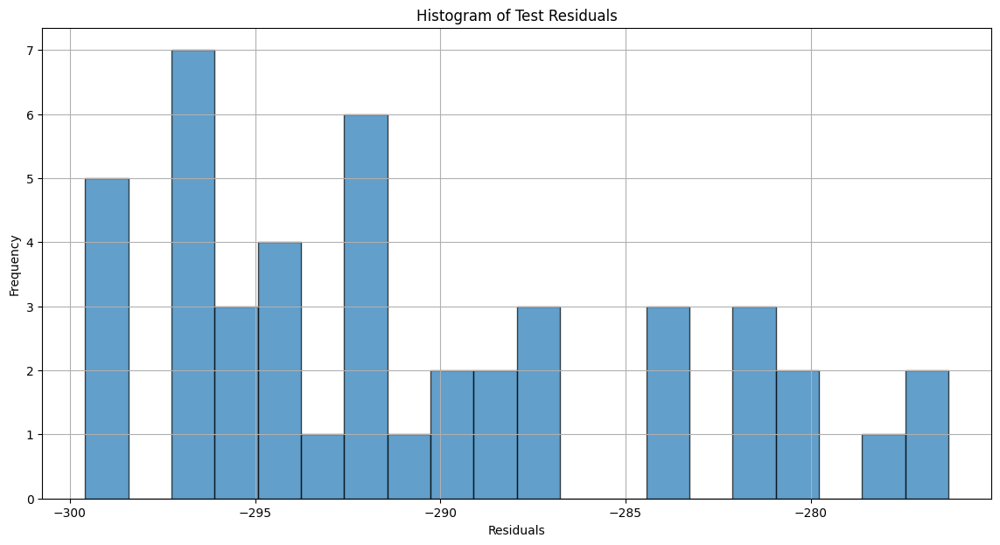

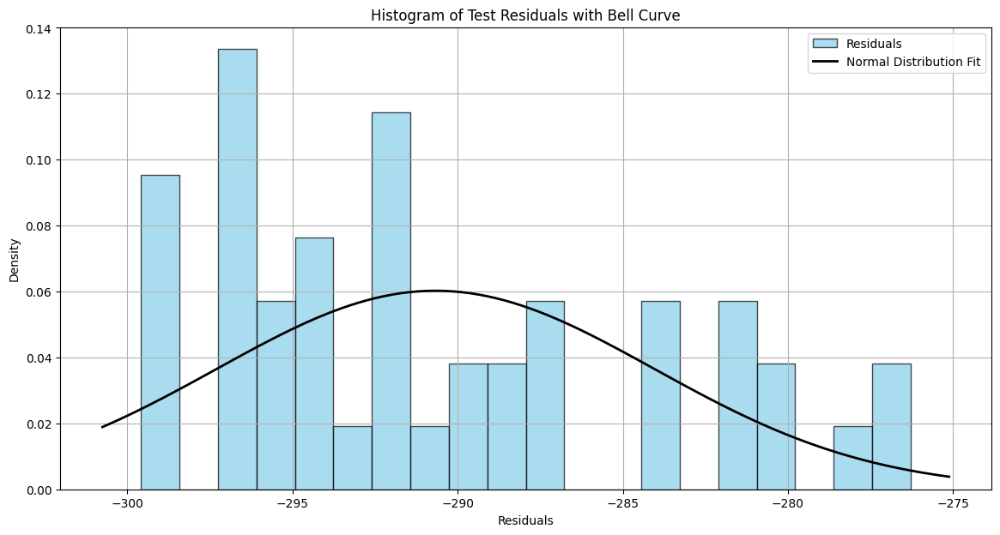

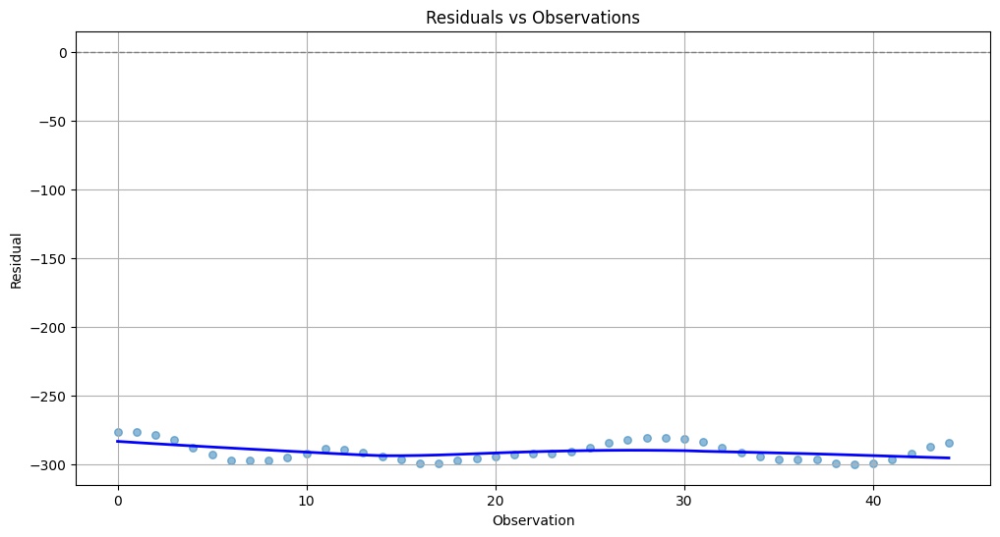

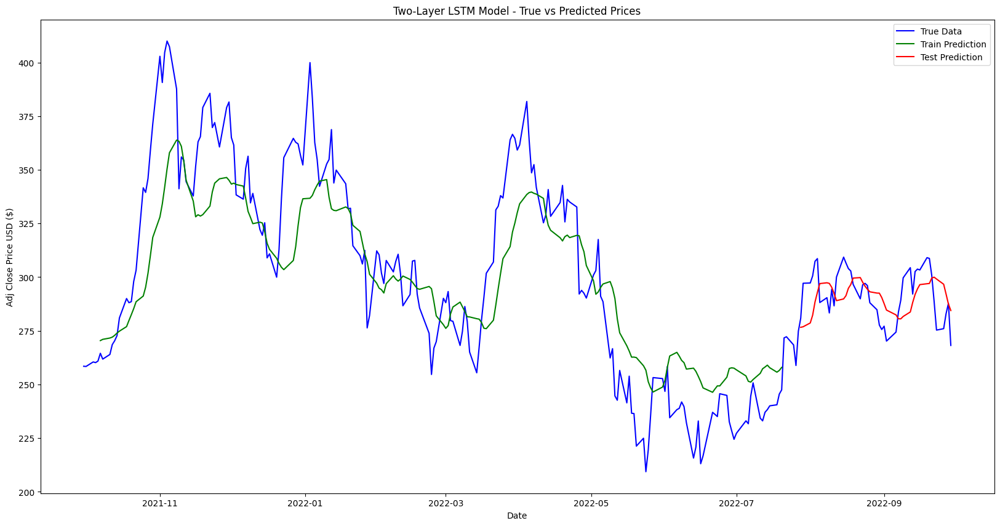

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━

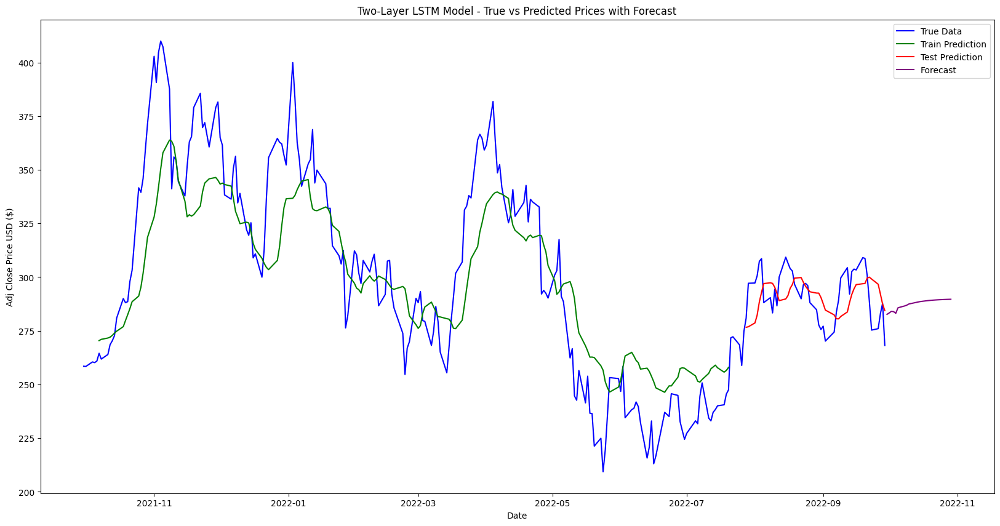

In [82]:
# 2 layer LSTM with only considering adj close univarient analysis
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam

# Seed value for Python, Numpy, TensorFlow, and Random for reproducibility
seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter data for a specific stock
df_filtered = df[df['Stock Name'] == 'TSLA']
columns = ['Adj Close']
df_filtered = df_filtered[columns]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_filtered)

# Split dataset into train and test sets
test_size = 50
train_data = scaled_data[:-test_size]
test_data = scaled_data[-test_size:]

# Function to convert an array of values into a dataset matrix
def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:(i + time_step), :])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Build the LSTM model with two layers
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(50, return_sequences=True),
    Dropout(0.2),
    LSTM(50),
    Dropout(0.2),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Callbacks for early stopping and learning rate adjustment
es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
mcp = ModelCheckpoint('best.weights.h5', save_best_only=True, save_weights_only=True)
tb = TensorBoard(log_dir='./logs')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transformation for original scale
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train_inv = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test_inv = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Evaluate the model
train_rmse = math.sqrt(mean_squared_error(y_train_inv, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test_inv, test_predict))
print("Train RMSE: {:.2f}".format(train_rmse))
print("Test RMSE: {:.2f}".format(test_rmse))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train_inv, train_predict)
mae_train = mean_absolute_error(y_train_inv, train_predict)
r2_train = r2_score(y_train_inv, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test_inv, test_predict)
mae_test = mean_absolute_error(y_test_inv, test_predict)
r2_test = r2_score(y_test_inv, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train_inv - train_predict) / y_train_inv)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test_inv - test_predict) / y_test_inv)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Calculate residuals
train_residuals = y_train - train_predict
test_residuals = y_test - test_predict

# Plot QQ Plot for residuals of the test set
plt.figure(figsize=(14, 7))
sm.qqplot(test_residuals, line='45', fit=True)
plt.title('QQ Plot of Test Residuals')
plt.grid(True)
plt.show()

# Plot Histogram of the residuals for the test set
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, edgecolor='k', alpha=0.7)
plt.title('Histogram of Test Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Fit a normal distribution to the test residuals
mu, std = norm.fit(test_residuals)

# Plot Histogram of the residuals for the test set with Bell Curve
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, density=True, alpha=0.7, edgecolor='k', color='skyblue', label='Residuals')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Normal Distribution Fit')
plt.title('Histogram of Test Residuals with Bell Curve')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

# Plot residuals vs observations with a Loess smoother
plt.figure(figsize=(12, 6))
sns.regplot(x=np.arange(len(test_residuals)), y=test_residuals, lowess=True, scatter_kws={'s': 30, 'alpha': 0.5}, line_kws={'color': 'blue', 'lw': 2})
plt.axhline(0, color='gray', linestyle='--', lw=1)
plt.title('Residuals vs Observations')
plt.xlabel('Observation')
plt.ylabel('Residual')
plt.grid(True)
plt.show()


# Shift train predictions for plotting
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[time_step:len(train_predict) + time_step, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (time_step * 2):len(scaled_data), 0] = test_predict

# Plotting results
plt.figure(figsize=(20, 10))
plt.plot(df_filtered.index, df_filtered['Adj Close'], label='True Data', color='blue')
plt.plot(df_filtered.index[:len(train_predict) + time_step], trainPredictPlot[:len(train_predict) + time_step, 0], label='Train Prediction', color='green')
plt.plot(df_filtered.index[len(train_predict) + (time_step * 2):], testPredictPlot[len(train_predict) + (time_step * 2):, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('Two-Layer LSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-time_step:].reshape(1, time_step, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_filtered.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_filtered.index, df_filtered['Adj Close'], label='True Data', color='blue')
plt.plot(df_filtered.index[:len(train_predict) + time_step], trainPredictPlot[:len(train_predict) + time_step, 0], label='Train Prediction', color='green')
plt.plot(df_filtered.index[len(train_predict) + (time_step * 2):], testPredictPlot[len(train_predict) + (time_step * 2):, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('Two-Layer LSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()




In [60]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_filtered.index[-len(test_predict):],  # Corresponding dates from the test set
    'Actual': y_test_inv,  # Actual values
    'Predicted': test_predict  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows of the comparison

First Forecasted Value: 282.66

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-28  280.899994  276.642550
1  2022-07-29  297.149994  276.890553
2  2022-08-01  297.276672  278.663822
3  2022-08-02  300.586670  282.280301
4  2022-08-03  307.396667  288.460799
5  2022-08-04  308.633331  292.925110
6  2022-08-05  288.170013  296.997640
7  2022-08-08  290.423340  297.379977
8  2022-08-09  283.333344  297.085944
9  2022-08-10  294.356659  295.284233
10 2022-08-11  286.630005  292.402258
11 2022-08-12  300.029999  289.053090
12 2022-08-15  309.320007  289.852663
13 2022-08-16  306.563324  291.409839
14 2022-08-17  303.996674  294.796584
15 2022-08-18  302.869995  296.544208
16 2022-08-19  296.666656  299.566100
17 2022-08-22  289.913330  299.795363
18 2022-08-23  296.453339  297.625445
19 2022-08-24  297.096680  295.774781
20 2022-08-25  296.070007  294.371684
21 2022-08-26  288.089996  293.180096
22 2022-08-29  284.820007  292.579662


In [40]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_filtered.index[-len(test_predict):],  # Dates corresponding to test set
    'Actual': y_test_inv,
    'Predicted': test_predict
})

# Display the first forecasted value and comparison of the first few actual vs. predicted values
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table


First Forecasted Value: 282.65621189175914

First Forecasted Value: 282.65621189175914

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  276.642550
1 2022-07-29  297.149994  276.890553
2 2022-08-01  297.276672  278.663822
3 2022-08-02  300.586670  282.280301
4 2022-08-03  307.396667  288.460799
5 2022-08-04  308.633331  292.925110
6 2022-08-05  288.170013  296.997640
7 2022-08-08  290.423340  297.379977
8 2022-08-09  283.333344  297.085944
9 2022-08-10  294.356659  295.284233


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2726
Epoch 1: val_loss improved from inf to 0.05136, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 209ms/step - loss: 0.2368 - val_loss: 0.0514 - learning_rate: 0.0010
Epoch 2/100
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1034 
Epoch 2: val_loss improved from 0.05136 to 0.00522, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0869 - val_loss: 0.0052 - learning_rate: 0.0010
Epoch 3/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0216
Epoch 3: val_loss did not improve from 0.00522
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0205 - val_loss: 0.0114 - learning_rate: 0.0010
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0184  
Epoch 4: val_loss did not improve from 0.00522
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0188 - val_loss: 0.0142 - learning_rate: 0.0010
Epoch 5/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0184 
Epoch 5: val_loss improved from 0.00522 

<Figure size 1400x700 with 0 Axes>

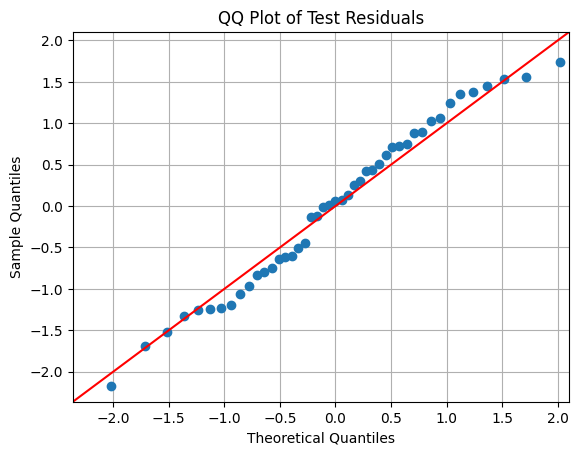

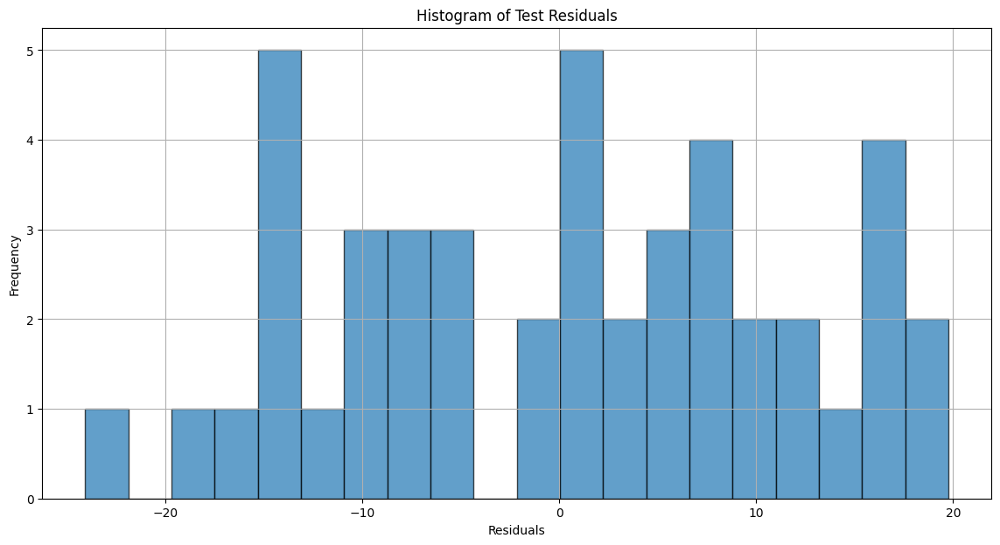

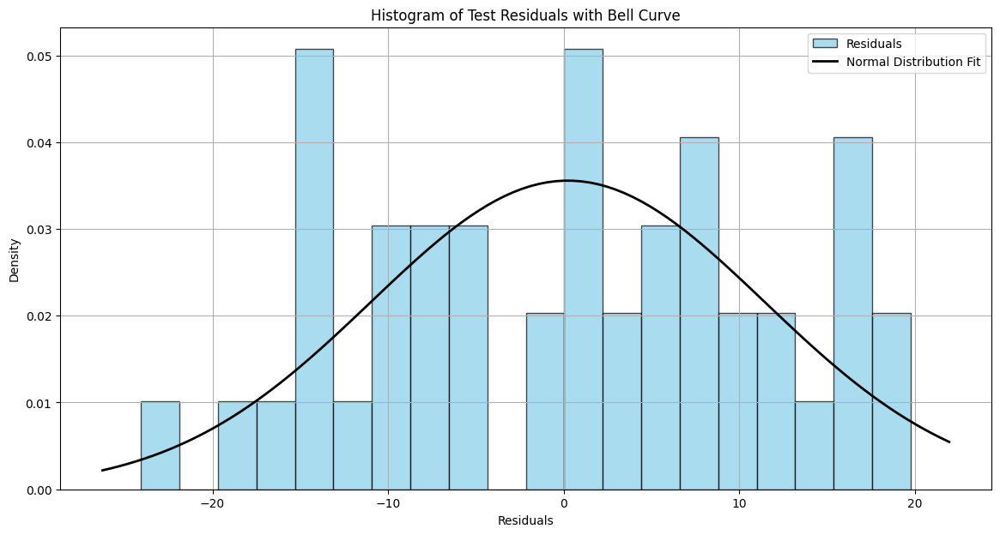

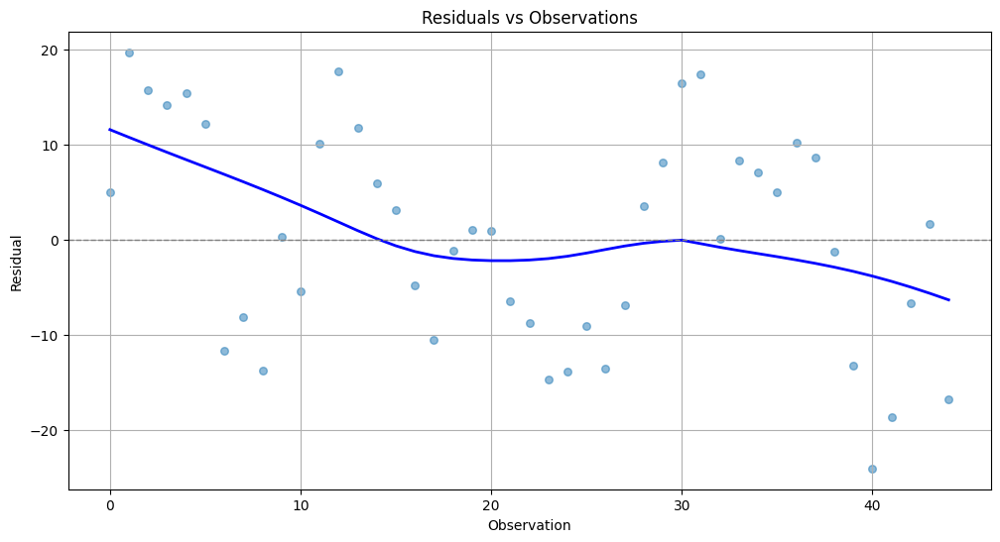

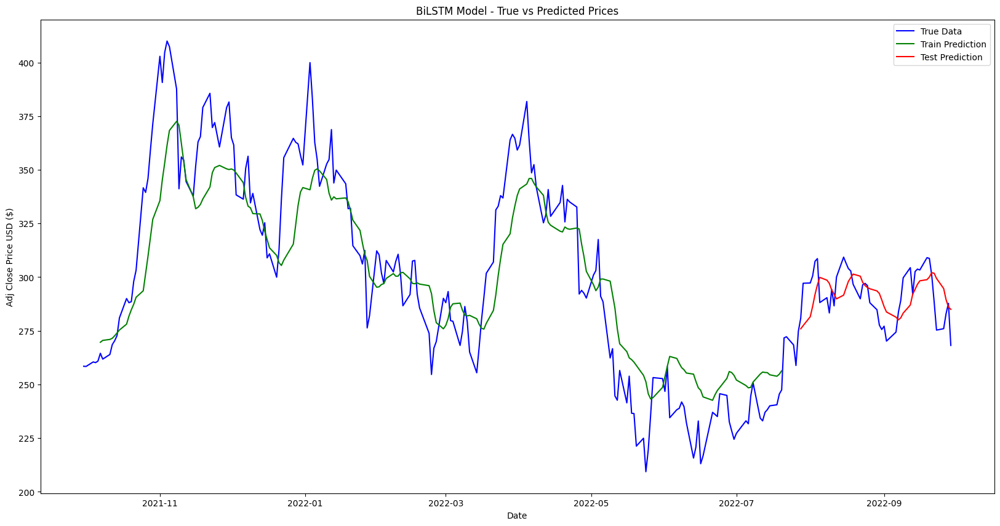

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

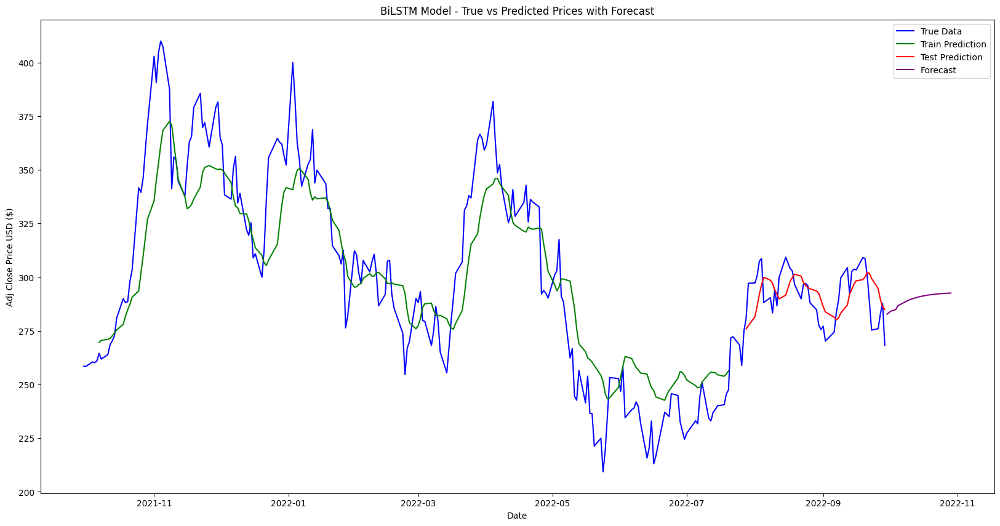

In [83]:
# BiLSTM with 1 layer by considering only adjclose, only inivarient anlysis
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import random
from keras.models import Sequential
from keras.layers import Dense, Bidirectional, LSTM, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

seed_value = 27
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step):
        a = dataset[i:(i + time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Build the BiLSTM model with one layer
model = Sequential([
    Bidirectional(LSTM(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Fit the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Calculate residuals
train_residuals = y_train - train_predict
test_residuals = y_test - test_predict

# Plot QQ Plot for residuals of the test set
plt.figure(figsize=(14, 7))
sm.qqplot(test_residuals, line='45', fit=True)
plt.title('QQ Plot of Test Residuals')
plt.grid(True)
plt.show()

# Plot Histogram of the residuals for the test set
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, edgecolor='k', alpha=0.7)
plt.title('Histogram of Test Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Fit a normal distribution to the test residuals
mu, std = norm.fit(test_residuals)

# Plot Histogram of the residuals for the test set with Bell Curve
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, density=True, alpha=0.7, edgecolor='k', color='skyblue', label='Residuals')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Normal Distribution Fit')
plt.title('Histogram of Test Residuals with Bell Curve')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

# Plot residuals vs observations with a Loess smoother
plt.figure(figsize=(12, 6))
sns.regplot(x=np.arange(len(test_residuals)), y=test_residuals, lowess=True, scatter_kws={'s': 30, 'alpha': 0.5}, line_kws={'color': 'blue', 'lw': 2})
plt.axhline(0, color='gray', linestyle='--', lw=1)
plt.title('Residuals vs Observations')
plt.xlabel('Observation')
plt.ylabel('Residual')
plt.grid(True)
plt.show()


# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict) + look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (look_back * 2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiLSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiLSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()


In [62]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Corresponding dates from the test set
    'Actual': y_test,  # Actual values
    'Predicted': test_predict  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows of the comparison

First Forecasted Value: 282.74

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-28  280.899994  275.928956
1  2022-07-29  297.149994  277.399166
2  2022-08-01  297.276672  281.568494
3  2022-08-02  300.586670  286.419644
4  2022-08-03  307.396667  291.950745
5  2022-08-04  308.633331  296.414267
6  2022-08-05  288.170013  299.891743
7  2022-08-08  290.423340  298.594508
8  2022-08-09  283.333344  297.095342
9  2022-08-10  294.356659  294.002797
10 2022-08-11  286.630005  292.106665
11 2022-08-12  300.029999  289.884890
12 2022-08-15  309.320007  291.609553
13 2022-08-16  306.563324  294.769456
14 2022-08-17  303.996674  298.021812
15 2022-08-18  302.869995  299.779169
16 2022-08-19  296.666656  301.419813
17 2022-08-22  289.913330  300.447199
18 2022-08-23  296.453339  297.607589
19 2022-08-24  297.096680  296.081875
20 2022-08-25  296.070007  295.178604
21 2022-08-26  288.089996  294.598573
22 2022-08-29  284.820007  293.583690


In [42]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table


First Forecasted Value: 282.7431597056476

First Forecasted Value: 282.7431597056476

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  275.928956
1 2022-07-29  297.149994  277.399166
2 2022-08-01  297.276672  281.568494
3 2022-08-02  300.586670  286.419644
4 2022-08-03  307.396667  291.950745
5 2022-08-04  308.633331  296.414267
6 2022-08-05  288.170013  299.891743
7 2022-08-08  290.423340  298.594508
8 2022-08-09  283.333344  297.095342
9 2022-08-10  294.356659  294.002797


Reloading Tuner from my_dir/lstm_tuning/tuner0.json


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2368
Epoch 1: val_loss improved from inf to 0.00586, saving model to weights.best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 183ms/step - loss: 0.2302 - val_loss: 0.0059 - learning_rate: 0.0100
Epoch 2/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0467
Epoch 2: val_loss did not improve from 0.00586
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0463 - val_loss: 0.0516 - learning_rate: 0.0100
Epoch 3/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0393
Epoch 3: val_loss improved from 0.00586 to 0.00333, saving model to weights.best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0381 - val_loss: 0.0033 - learning_rate: 0.0100
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0229
Epoch 4: val_loss did not improve from 0.00333
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0230 - val_loss: 0.0054 - learning_rate: 0.0100
Epoch 5/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0207
Epoch 5: val_lo

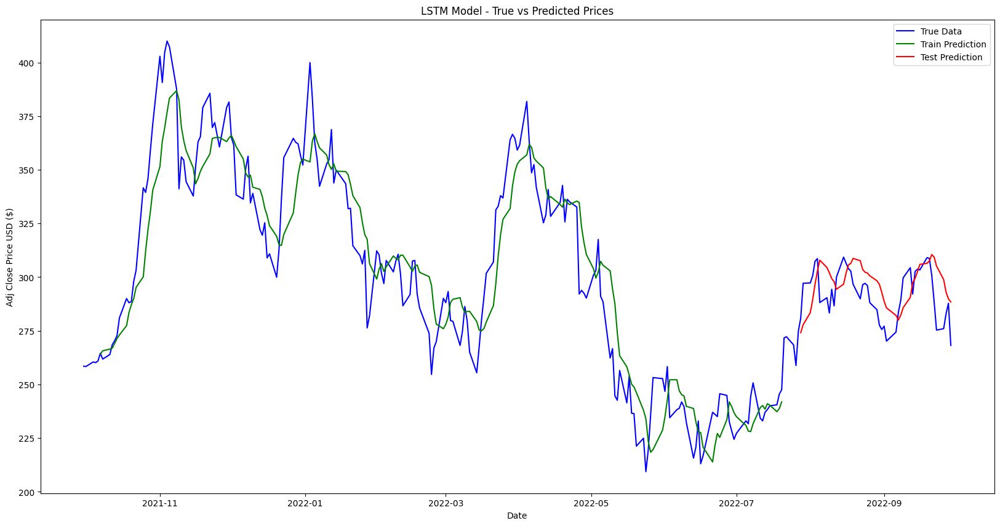

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

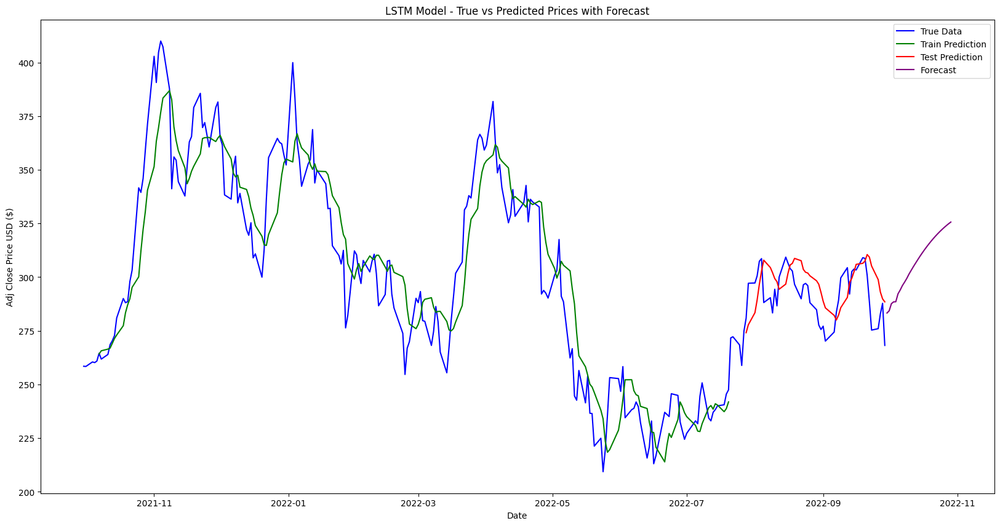

In [86]:
# hyper parameter tunning with 1 layer LSTM consider only adjclose, univarient analysis
!pip install keras-tuner
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import keras_tuner as kt
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf


seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Define the model
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=512, step=32),
                   return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='mean_squared_error')
    return model

# Set up the tuner
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='lstm_tuning'
)

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('weights.best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Perform hyperparameter tuning
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build and train the model with the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [44]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(11))  # Display the first 10 rows of the comparison table

First Forecasted Value: 283.3005164140366

First Forecasted Value: 283.3005164140366

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  274.126031
1 2022-07-29  297.149994  277.821872
2 2022-08-01  297.276672  283.444672
3 2022-08-02  300.586670  289.376510
4 2022-08-03  307.396667  296.643171
5 2022-08-04  308.633331  302.838614
6 2022-08-05  288.170013  307.909324
7 2022-08-08  290.423340  304.478164
8 2022-08-09  283.333344  302.083061
9 2022-08-10  294.356659  299.346061


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3194
Epoch 1: val_loss improved from inf to 0.06974, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 332ms/step - loss: 0.3041 - val_loss: 0.0697 - learning_rate: 0.0010
Epoch 2/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1734
Epoch 2: val_loss improved from 0.06974 to 0.00833, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1257 - val_loss: 0.0083 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0376  
Epoch 3: val_loss did not improve from 0.00833
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0366 - val_loss: 0.0101 - learning_rate: 0.0010
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0316 
Epoch 4: val_loss did not improve from 0.00833
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0319 - val_loss: 0.0230 - learning_rate: 0.0010
Epoch 5/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0333
Epoch 5: val_loss did not impro

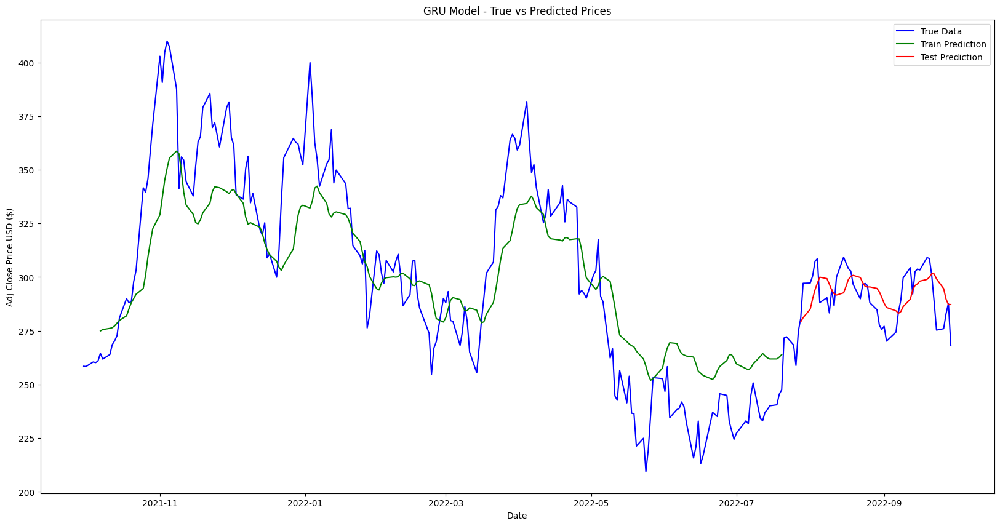

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━

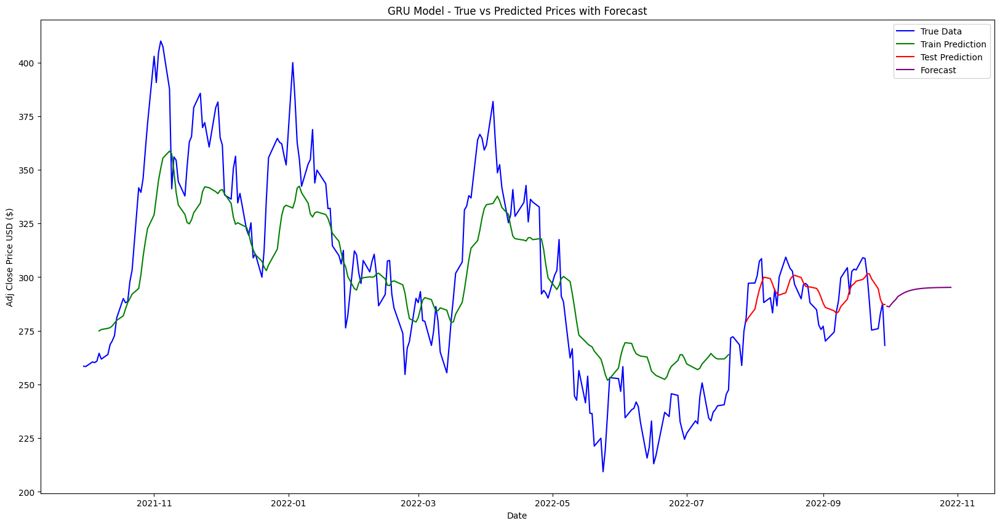

In [12]:
# gru 1 layer by considering only adjclose as target, univarient analysis
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import random
import math
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

# Set random seed for reproducibility
seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'],dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step):
        a = dataset[i:(i + time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the GRU model with one layer
model = Sequential([
    GRU(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),

    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)
print ("Training RMSE:",train_rmse)
print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print ("Test RMSE:",test_rmse)
print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict) + look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (look_back * 2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [13]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table


First Forecasted Value: 286.4678558019737

First Forecasted Value: 286.4678558019737

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  279.235005
1 2022-07-29  297.149994  281.093776
2 2022-08-01  297.276672  285.142047
3 2022-08-02  300.586670  289.999276
4 2022-08-03  307.396667  294.110506
5 2022-08-04  308.633331  297.264479
6 2022-08-05  288.170013  299.986618
7 2022-08-08  290.423340  299.323190
8 2022-08-09  283.333344  296.749929
9 2022-08-10  294.356659  293.922054


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.2933
Epoch 1: val_loss improved from inf to 0.05060, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.2731 - val_loss: 0.0506 - learning_rate: 0.0010
Epoch 2/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0999 
Epoch 2: val_loss improved from 0.05060 to 0.00359, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0893 - val_loss: 0.0036 - learning_rate: 0.0010
Epoch 3/100
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0303
Epoch 3: val_loss did not improve from 0.00359
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0313 - val_loss: 0.0265 - learning_rate: 0.0010
Epoch 4/100
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0466
Epoch 4: val_loss did not improve from 0.00359
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0438 - val_loss: 0.0104 - learning_rate: 0.0010
Epoch 5/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0276 
Epoch 5: val_loss improved fr

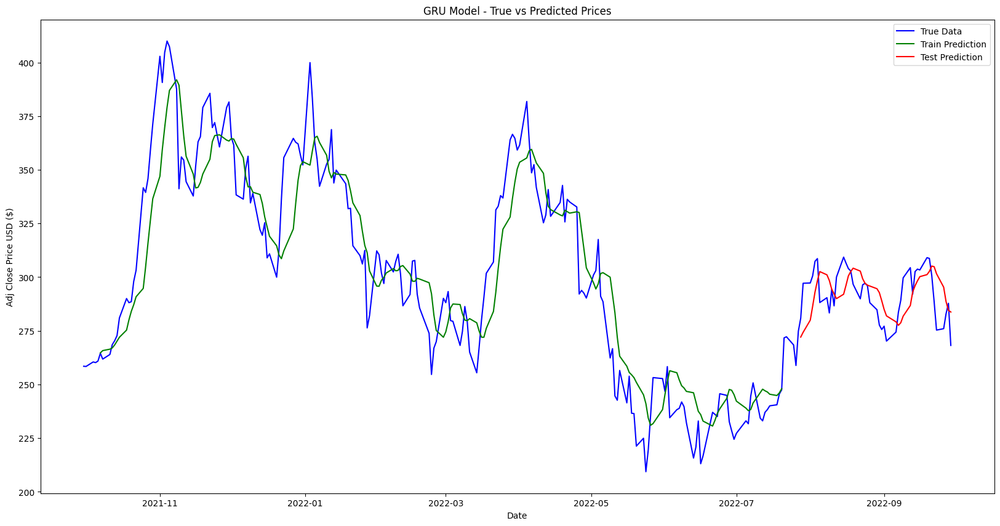

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/

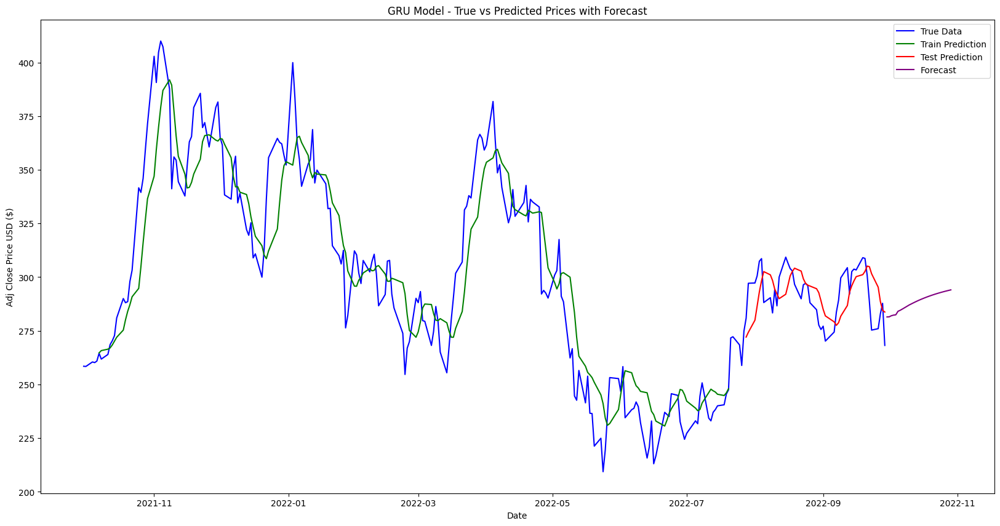

In [14]:
# 2 layer gru,by considering only adj close as target  univarient analysis
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout, Bidirectional
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf
# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the GRU model with two layers
model = Sequential([
    GRU(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    GRU(25, return_sequences=False),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [15]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table


First Forecasted Value: 281.46498798546867

First Forecasted Value: 281.46498798546867

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  272.095379
1 2022-07-29  297.149994  274.298946
2 2022-08-01  297.276672  279.954690
3 2022-08-02  300.586670  286.426979
4 2022-08-03  307.396667  293.095073
5 2022-08-04  308.633331  298.331818
6 2022-08-05  288.170013  302.587012
7 2022-08-08  290.423340  301.079787
8 2022-08-09  283.333344  298.447322
9 2022-08-10  294.356659  294.400934


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.4121
Epoch 1: val_loss improved from inf to 0.07592, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.3833 - val_loss: 0.0759 - learning_rate: 0.0010
Epoch 2/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1393
Epoch 2: val_loss improved from 0.07592 to 0.00360, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1309 - val_loss: 0.0036 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0371 
Epoch 3: val_loss did not improve from 0.00360
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0364 - val_loss: 0.0233 - learning_rate: 0.0010
Epoch 4/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0364
Epoch 4: val_loss did not improve from 0.00360
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0371 - val_loss: 0.0295 - learning_rate: 0.0010
Epoch 5/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0361
Epoch 5: val_loss did not improv

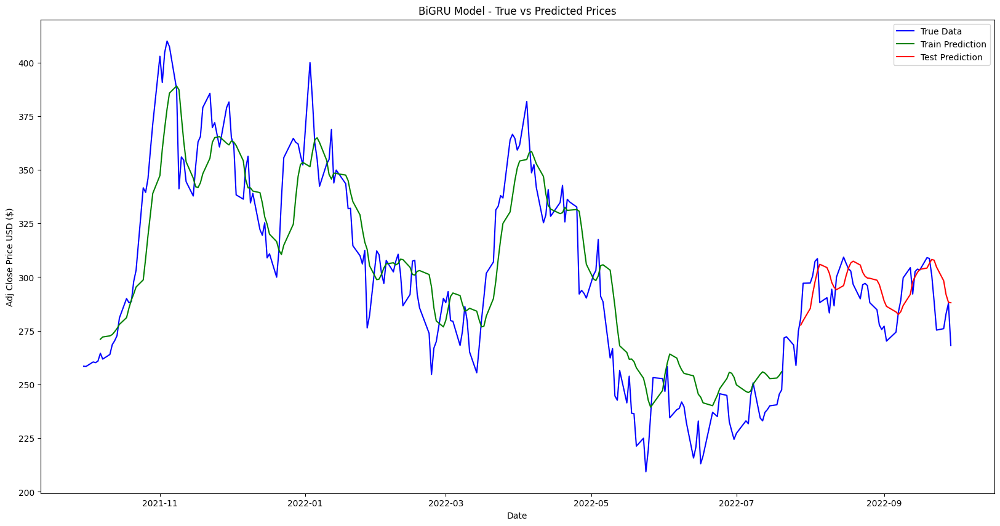

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

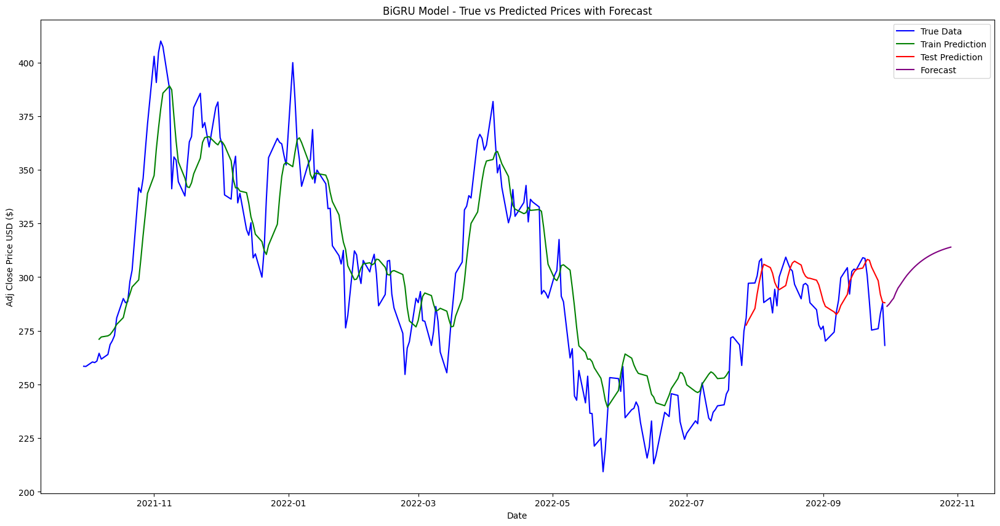

In [16]:
# BiGRU WITH 1 LAYER,by considering only adjclise as target, univarient analysis
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout, Bidirectional
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf
# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the BiGRU model with one layer
model = Sequential([
    Bidirectional(GRU(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiGRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiGRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [17]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 286.4334532809061

First Forecasted Value: 286.4334532809061

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  277.641478
1 2022-07-29  297.149994  279.729965
2 2022-08-01  297.276672  285.400696
3 2022-08-02  300.586670  292.167035
4 2022-08-03  307.396667  297.848258
5 2022-08-04  308.633331  302.701285
6 2022-08-05  288.170013  306.001942
7 2022-08-08  290.423340  304.456794
8 2022-08-09  283.333344  301.848981
9 2022-08-10  294.356659  297.566127


Reloading Tuner from my_dir/gru_tuning/tuner0.json


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1797
Epoch 1: val_loss improved from inf to 0.02664, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.1597 - val_loss: 0.0266 - learning_rate: 0.0010
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0220
Epoch 2: val_loss improved from 0.02664 to 0.01084, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0217 - val_loss: 0.0108 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0216
Epoch 3: val_loss improved from 0.01084 to 0.00489, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0209 - val_loss: 0.0049 - learning_rate: 0.0010
Epoch 4/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0126
Epoch 4: val_loss improved from 0.00489 to 0.00410, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0125 - val_loss: 0.0041 - learning_rate: 0.0010
Epoch 5/100
7/7 ━━━━━━━

<Figure size 1400x700 with 0 Axes>

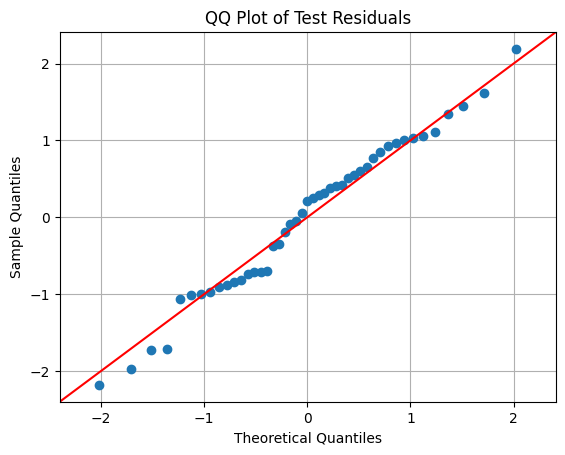

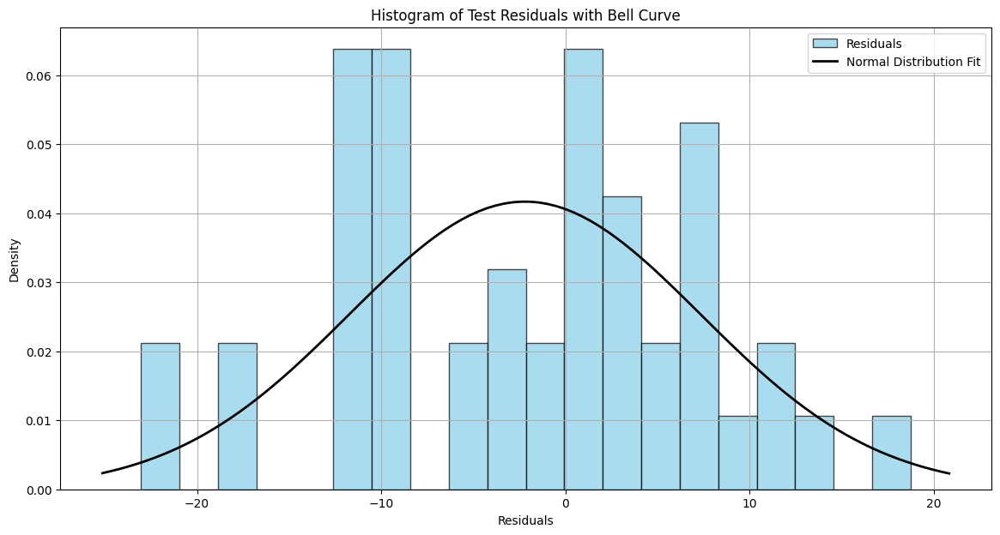

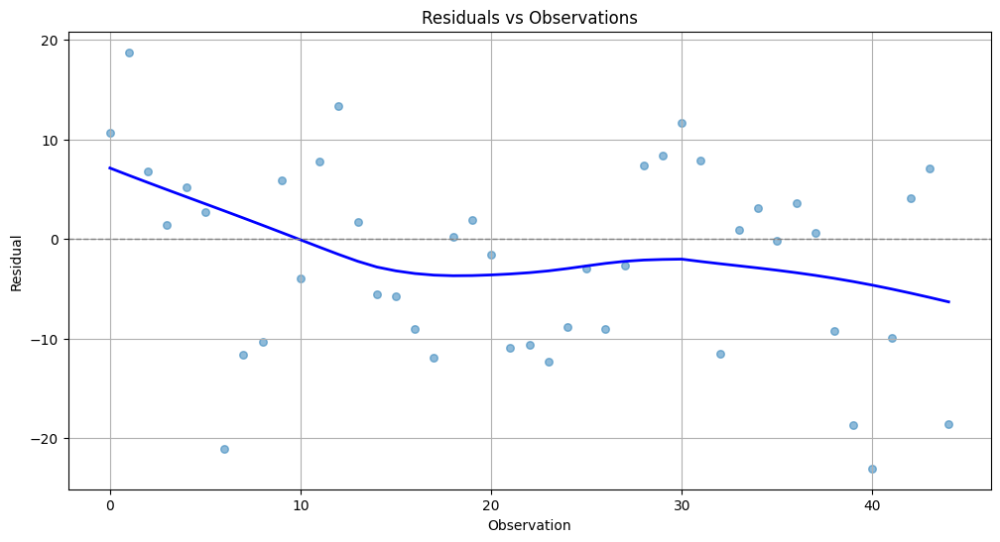

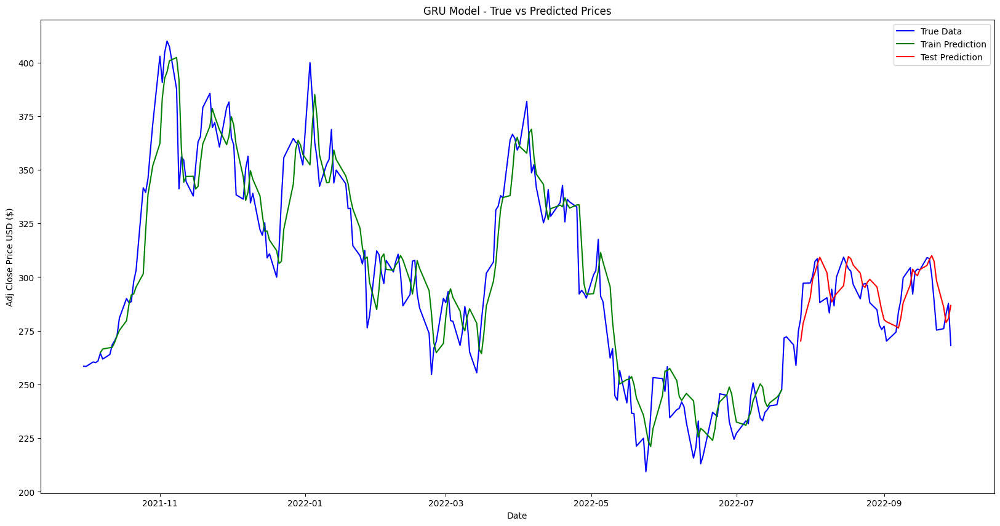

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

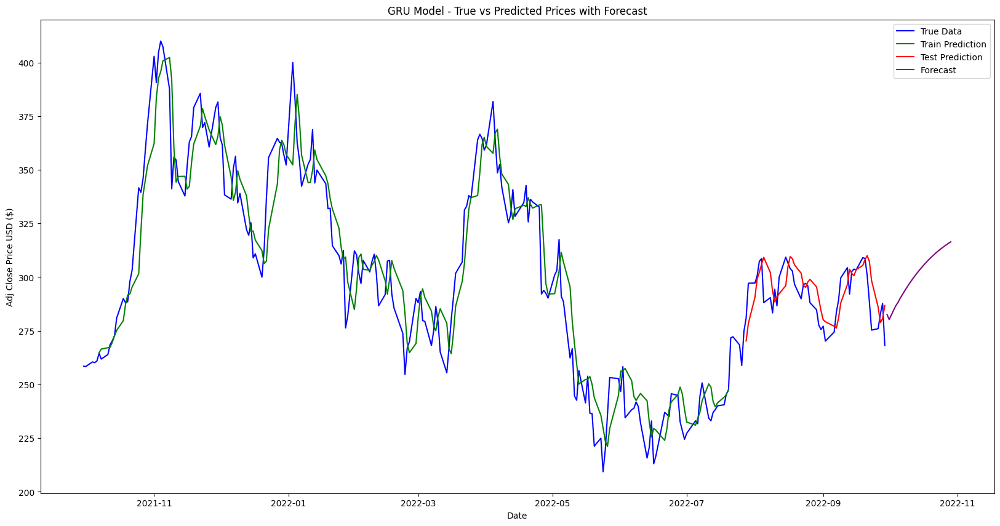

In [84]:
# HYPER PARAMETER FRO GRU(1 LAYER),by consideting only adjclose as univarient analysis
!pip install keras-tuner
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import keras_tuner as kt
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf


# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Define the model
def build_gru_model(hp):
    model = Sequential()
    model.add(GRU(units=hp.Int('units', min_value=32, max_value=512, step=32),
                   return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='mean_squared_error')
    return model

# Set up the tuner
tuner = kt.RandomSearch(
    build_gru_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='gru_tuning'
)

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Perform hyperparameter tuning
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build and train the model with the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")


# Calculate residuals
train_residuals = y_train - train_predict
test_residuals = y_test - test_predict

# Plot QQ Plot for residuals of the test set
plt.figure(figsize=(14, 7))
sm.qqplot(test_residuals, line='45', fit=True)
plt.title('QQ Plot of Test Residuals')
plt.grid(True)
plt.show()


# Fit a normal distribution to the test residuals
mu, std = norm.fit(test_residuals)

# Plot Histogram of the residuals for the test set with Bell Curve
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, density=True, alpha=0.7, edgecolor='k', color='skyblue', label='Residuals')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Normal Distribution Fit')
plt.title('Histogram of Test Residuals with Bell Curve')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

# Plot residuals vs observations with a Loess smoother
plt.figure(figsize=(12, 6))
sns.regplot(x=np.arange(len(test_residuals)), y=test_residuals, lowess=True, scatter_kws={'s': 30, 'alpha': 0.5}, line_kws={'color': 'blue', 'lw': 2})
plt.axhline(0, color='gray', linestyle='--', lw=1)
plt.title('Residuals vs Observations')
plt.xlabel('Observation')
plt.ylabel('Residual')
plt.grid(True)
plt.show()


# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()







In [19]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 282.1701529885436

First Forecasted Value: 282.1701529885436

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  270.568063
1 2022-07-29  297.149994  278.676519
2 2022-08-01  297.276672  290.727007
3 2022-08-02  300.586670  298.869477
4 2022-08-03  307.396667  301.936090
5 2022-08-04  308.633331  305.787678
6 2022-08-05  288.170013  309.100990
7 2022-08-08  290.423340  301.507269
8 2022-08-09  283.333344  293.472962
9 2022-08-10  294.356659  288.473508


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2999
Epoch 1: val_loss improved from inf to 0.08415, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.2776 - val_loss: 0.0841 - learning_rate: 0.0010
Epoch 2/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1836
Epoch 2: val_loss improved from 0.08415 to 0.02364, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1382 - val_loss: 0.0236 - learning_rate: 0.0010
Epoch 3/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.0791
Epoch 3: val_loss improved from 0.02364 to 0.00291, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0501 - val_loss: 0.0029 - learning_rate: 0.0010
Epoch 4/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0320
Epoch 4: val_loss did not improve from 0.00291
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0256 - val_loss: 0.0125 - learning_rate: 0.0010
Epoch 5/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0

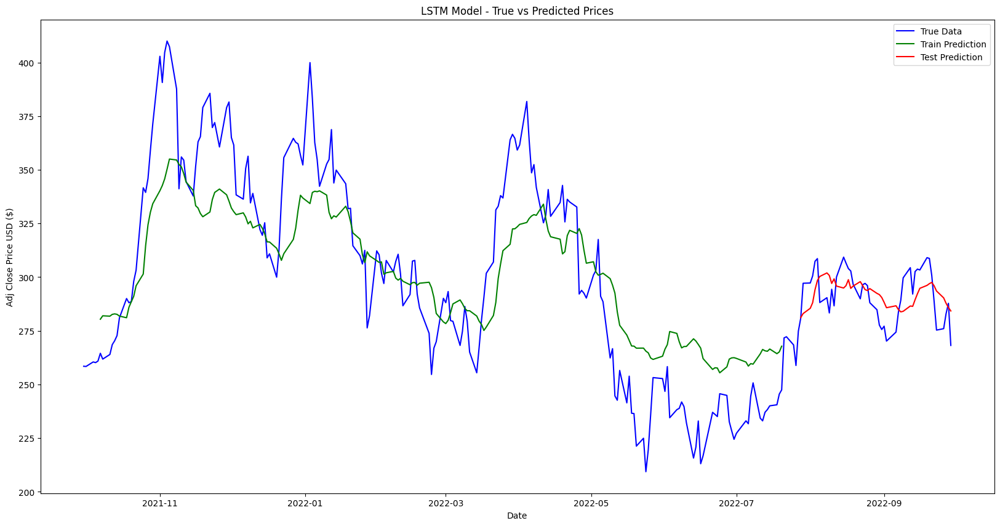

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━

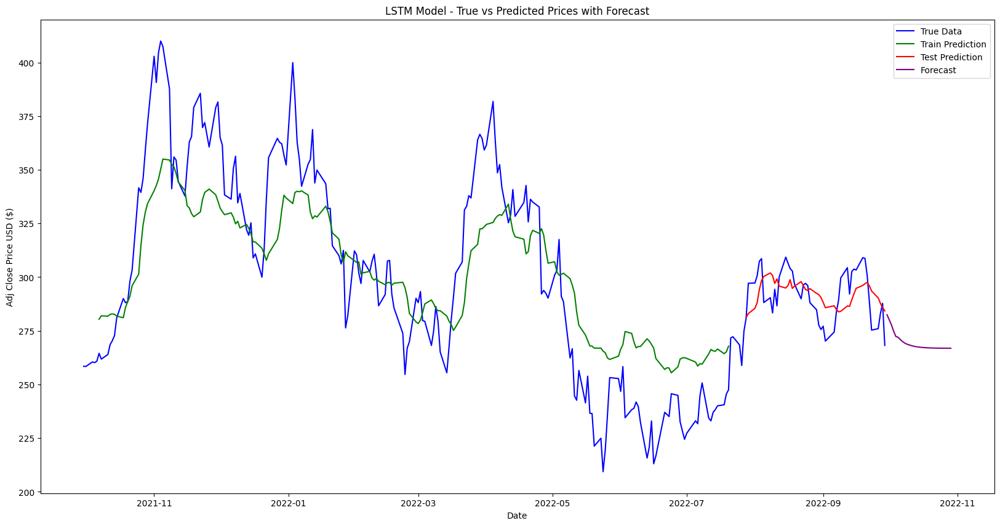

In [20]:
# 1 layer LSTM
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import random
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close','Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step):
        a = dataset[i:(i + time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Build the LSTM model with one layer
model = Sequential([
    LSTM(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Fit the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict) + look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (look_back * 2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [21]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 282.4982771208459

First Forecasted Value: 282.4982771208459

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  281.171356
1 2022-07-29  297.149994  283.037617
2 2022-08-01  297.276672  285.494309
3 2022-08-02  300.586670  288.087949
4 2022-08-03  307.396667  294.177547
5 2022-08-04  308.633331  298.463928
6 2022-08-05  288.170013  300.324486
7 2022-08-08  290.423340  301.963785
8 2022-08-09  283.333344  300.785629
9 2022-08-10  294.356659  297.065895


Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - loss: 0.2464 - val_loss: 0.0579 - learning_rate: 0.0010
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0941 - val_loss: 0.0034 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0264 - val_loss: 0.0270 - learning_rate: 0.0010
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0322 - val_loss: 0.0046 - learning_rate: 0.0010
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0202 - val_loss: 0.0040 - learning_rate: 0.0010
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0218 - val_loss: 0.0035 - learning_rate: 0.0010
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0184 - val_loss: 0.0059 - learning_rate: 0.0010
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0186 - val_loss: 0.0048 - learning_rate: 5.0000e-04
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0165 - val_loss: 0.0042 - learning_rate: 5.0000e-04
Epoch 10/100
7/7 ━

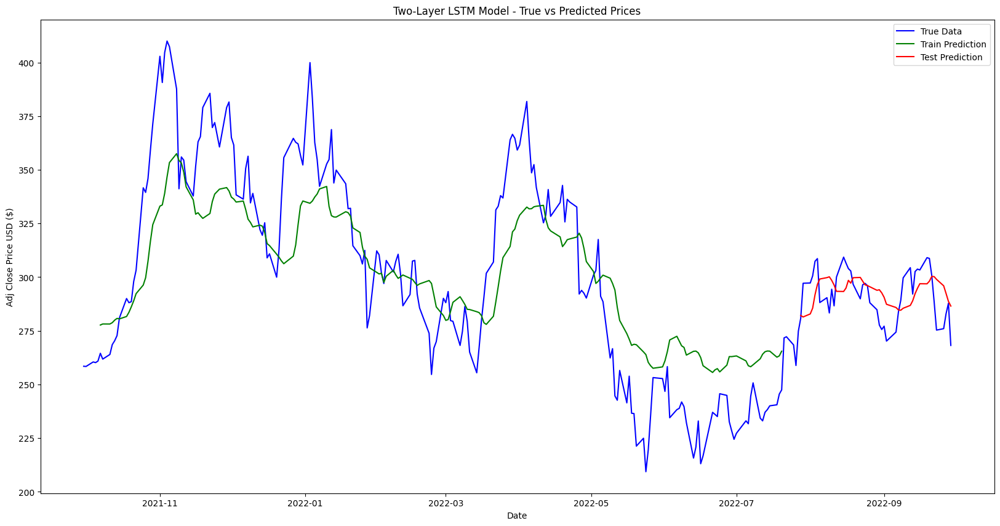

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━

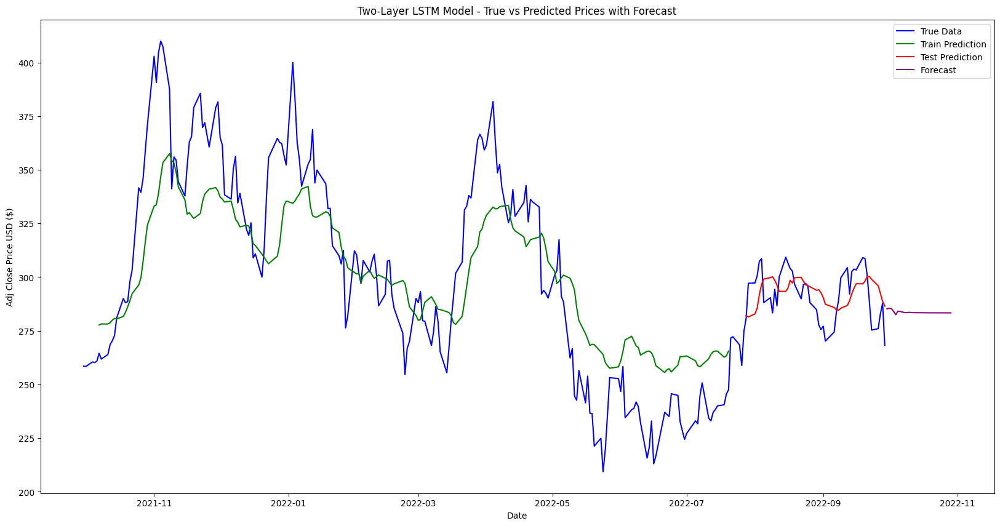

In [22]:
# 2 layer LSTM
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam

# Seed value for Python, Numpy, TensorFlow, and Random for reproducibility
seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter data for a specific stock
df_filtered = df[df['Stock Name'] == 'TSLA']
columns = ['Adj Close', 'Total_Score_Vader']
df_filtered = df_filtered[columns]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_filtered)

# Split dataset into train and test sets
test_size = 50
train_data = scaled_data[:-test_size]
test_data = scaled_data[-test_size:]

# Function to convert an array of values into a dataset matrix
def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:(i + time_step), :])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Build the LSTM model with two layers
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(50, return_sequences=True),
    Dropout(0.2),
    LSTM(50),
    Dropout(0.2),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Callbacks for early stopping and learning rate adjustment
es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
mcp = ModelCheckpoint('best.weights.h5', save_best_only=True, save_weights_only=True)
tb = TensorBoard(log_dir='./logs')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transformation for original scale
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train_inv = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test_inv = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Evaluate the model
train_rmse = math.sqrt(mean_squared_error(y_train_inv, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test_inv, test_predict))
print("Train RMSE: {:.2f}".format(train_rmse))
print("Test RMSE: {:.2f}".format(test_rmse))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train_inv, train_predict)
mae_train = mean_absolute_error(y_train_inv, train_predict)
r2_train = r2_score(y_train_inv, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test_inv, test_predict)
mae_test = mean_absolute_error(y_test_inv, test_predict)
r2_test = r2_score(y_test_inv, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train_inv - train_predict) / y_train_inv)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test_inv - test_predict) / y_test_inv)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[time_step:len(train_predict) + time_step, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (time_step * 2):len(scaled_data), 0] = test_predict

# Plotting results
plt.figure(figsize=(20, 10))
plt.plot(df_filtered.index, df_filtered['Adj Close'], label='True Data', color='blue')
plt.plot(df_filtered.index[:len(train_predict) + time_step], trainPredictPlot[:len(train_predict) + time_step, 0], label='Train Prediction', color='green')
plt.plot(df_filtered.index[len(train_predict) + (time_step * 2):], testPredictPlot[len(train_predict) + (time_step * 2):, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('Two-Layer LSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-time_step:].reshape(1, time_step, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_filtered.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_filtered.index, df_filtered['Adj Close'], label='True Data', color='blue')
plt.plot(df_filtered.index[:len(train_predict) + time_step], trainPredictPlot[:len(train_predict) + time_step, 0], label='Train Prediction', color='green')
plt.plot(df_filtered.index[len(train_predict) + (time_step * 2):], testPredictPlot[len(train_predict) + (time_step * 2):, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('Two-Layer LSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [23]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_filtered.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test_inv,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 285.2601569438045

First Forecasted Value: 285.2601569438045

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  282.136480
1 2022-07-29  297.149994  281.459435
2 2022-08-01  297.276672  282.870303
3 2022-08-02  300.586670  285.555289
4 2022-08-03  307.396667  291.828020
5 2022-08-04  308.633331  296.598439
6 2022-08-05  288.170013  299.129209
7 2022-08-08  290.423340  299.783144
8 2022-08-09  283.333344  300.162450
9 2022-08-10  294.356659  298.507626


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2817 
Epoch 1: val_loss improved from inf to 0.04648, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 226ms/step - loss: 0.2439 - val_loss: 0.0465 - learning_rate: 0.0010
Epoch 2/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0876 
Epoch 2: val_loss improved from 0.04648 to 0.00316, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0774 - val_loss: 0.0032 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0185
Epoch 3: val_loss did not improve from 0.00316
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0185 - val_loss: 0.0139 - learning_rate: 0.0010
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0216
Epoch 4: val_loss did not improve from 0.00316
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0219 - val_loss: 0.0109 - learning_rate: 0.0010
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0177
Epoch 5: val_loss improved fr

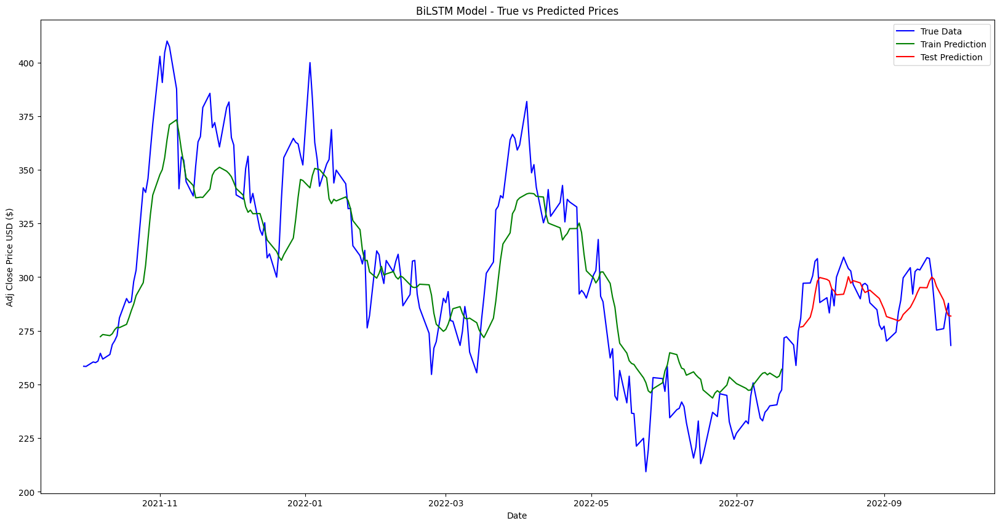

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━

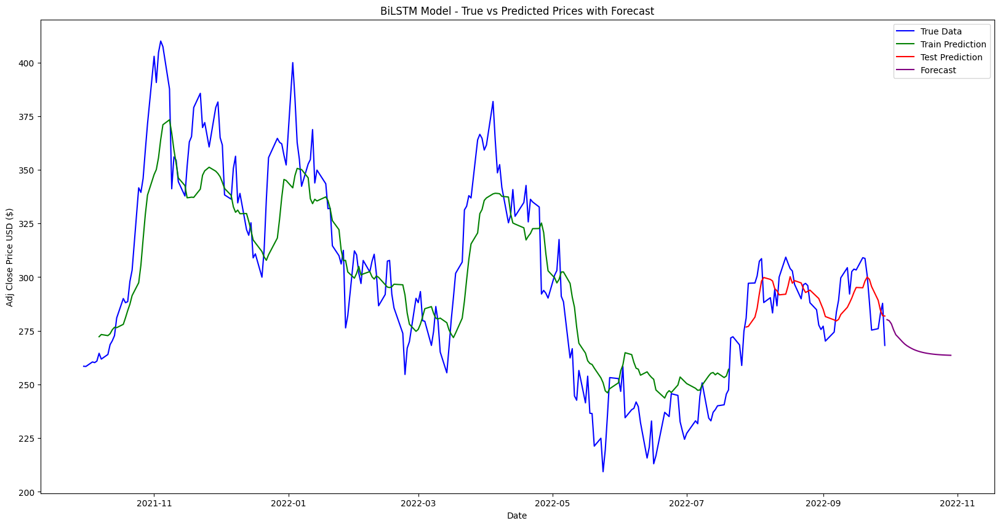

In [24]:
# BiLSTM with 1 layer
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from keras.models import Sequential
from keras.layers import Dense, Bidirectional, LSTM, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

seed_value = 27
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close',  'Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step):
        a = dataset[i:(i + time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Build the BiLSTM model with one layer
model = Sequential([
    Bidirectional(LSTM(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Fit the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict) + look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (look_back * 2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiLSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiLSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [25]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print("First Forecasted Value:", first_forecasted_value)

# Create a DataFrame for the actual vs. predicted values from the test set
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and the first few rows of the comparison table
print("\nFirst Forecasted Value:", first_forecasted_value)
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 280.2044389641789

First Forecasted Value: 280.2044389641789

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  276.765137
1 2022-07-29  297.149994  277.055960
2 2022-08-01  297.276672  281.379588
3 2022-08-02  300.586670  285.510491
4 2022-08-03  307.396667  292.256518
5 2022-08-04  308.633331  298.194949
6 2022-08-05  288.170013  299.831295
7 2022-08-08  290.423340  298.955833
8 2022-08-09  283.333344  298.214957
9 2022-08-10  294.356659  294.644896


Reloading Tuner from my_dir/lstm_tuning/tuner0.json


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2432
Epoch 1: val_loss improved from inf to 0.00295, saving model to weights.best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - loss: 0.2365 - val_loss: 0.0029 - learning_rate: 0.0100
Epoch 2/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0487
Epoch 2: val_loss did not improve from 0.00295
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0479 - val_loss: 0.0285 - learning_rate: 0.0100
Epoch 3/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0227
Epoch 3: val_loss did not improve from 0.00295
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0223 - val_loss: 0.0103 - learning_rate: 0.0100
Epoch 4/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0170
Epoch 4: val_loss did not improve from 0.00295
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0168 - val_loss: 0.0031 - learning_rate: 0.0100
Epoch 5/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0143
Epoch 5: val_loss did not improve from 0.00295
7/7 ━━━━━━━━━━

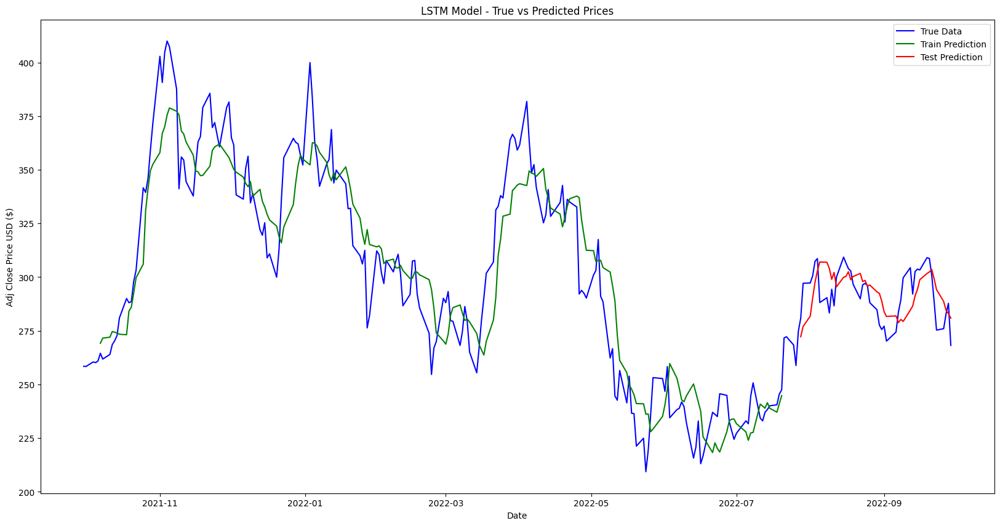

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

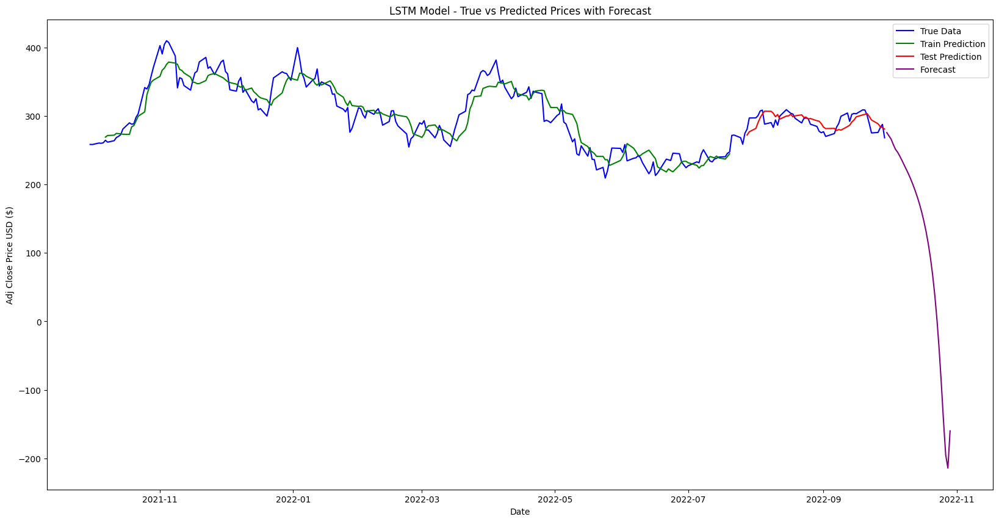

In [26]:
# hyper parameter tunning with 1 layer LSTM
!pip install keras-tuner
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import keras_tuner as kt
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close', 'Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Define the model
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=512, step=32),
                   return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='mean_squared_error')
    return model

# Set up the tuner
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='lstm_tuning'
)

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('weights.best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Perform hyperparameter tuning
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build and train the model with the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('LSTM Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [27]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a comparison DataFrame for the test set (actual vs. predicted values)
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and a comparison table for the test set
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 275.81

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  272.244807
1 2022-07-29  297.149994  277.060969
2 2022-08-01  297.276672  281.852574
3 2022-08-02  300.586670  290.245438
4 2022-08-03  307.396667  297.666949
5 2022-08-04  308.633331  302.921455
6 2022-08-05  288.170013  307.072641
7 2022-08-08  290.423340  306.928742
8 2022-08-09  283.333344  304.093293
9 2022-08-10  294.356659  298.972559


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 44s 7s/step - loss: 0.3015
Epoch 1: val_loss improved from inf to 0.03162, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.2171 - val_loss: 0.0316 - learning_rate: 0.0010
Epoch 2/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0752 
Epoch 2: val_loss improved from 0.03162 to 0.00364, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0704 - val_loss: 0.0036 - learning_rate: 0.0010
Epoch 3/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0291 
Epoch 3: val_loss did not improve from 0.00364
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0295 - val_loss: 0.0166 - learning_rate: 0.0010
Epoch 4/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0380 
Epoch 4: val_loss did not improve from 0.00364
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0379 - val_loss: 0.0084 - learning_rate: 0.0010
Epoch 5/100
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0316
Epoch 5: val_loss improved fr

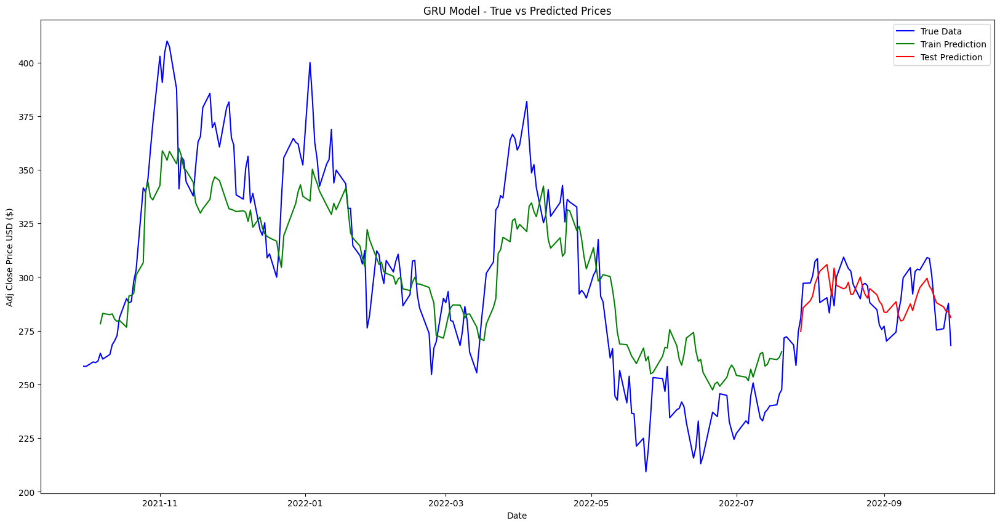

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━

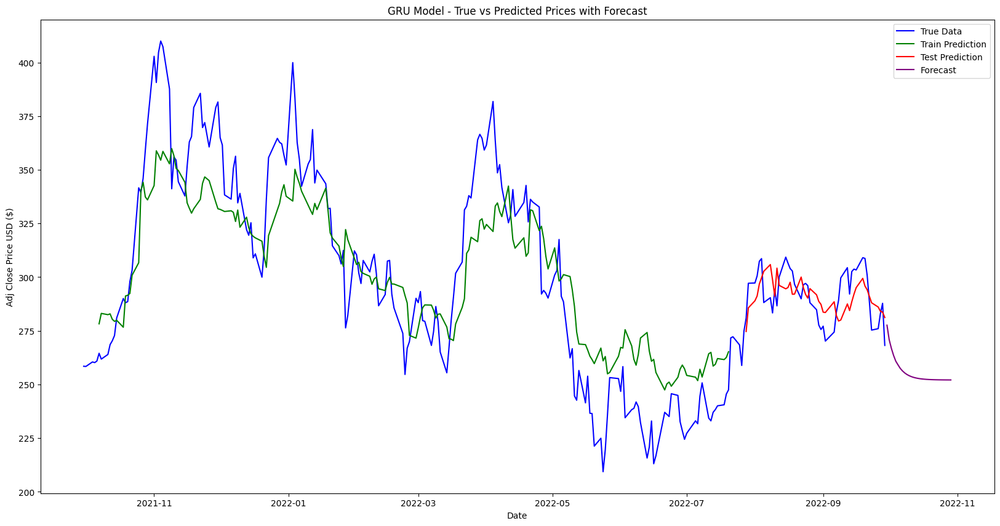

In [28]:
# gru 1 layer
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import random
import math
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

# Set random seed for reproducibility
seed_value = 18
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'],dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close', 'Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step):
        a = dataset[i:(i + time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the GRU model with one layer
model = Sequential([
    GRU(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),

    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)
print ("Training RMSE:",train_rmse)
print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print ("Test RMSE:",test_rmse)
print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict) + look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict) + (look_back * 2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:, 0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20, 10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:, 0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:, 0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:, 0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [29]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a comparison DataFrame for the test set (actual vs. predicted values)
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and a comparison table for the test set
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 277.63

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  274.680099
1 2022-07-29  297.149994  285.695577
2 2022-08-01  297.276672  288.992630
3 2022-08-02  300.586670  291.243183
4 2022-08-03  307.396667  296.832884
5 2022-08-04  308.633331  299.693548
6 2022-08-05  288.170013  302.719918
7 2022-08-08  290.423340  305.861696
8 2022-08-09  283.333344  298.732794
9 2022-08-10  294.356659  291.168998


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2416 
Epoch 1: val_loss improved from inf to 0.02897, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 198ms/step - loss: 0.2226 - val_loss: 0.0290 - learning_rate: 0.0010
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0609
Epoch 2: val_loss improved from 0.02897 to 0.01068, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0592 - val_loss: 0.0107 - learning_rate: 0.0010
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0399
Epoch 3: val_loss did not improve from 0.01068
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0400 - val_loss: 0.0176 - learning_rate: 0.0010
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0371
Epoch 4: val_loss improved from 0.01068 to 0.00322, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0367 - val_loss: 0.0032 - learning_rate: 0.0010
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 

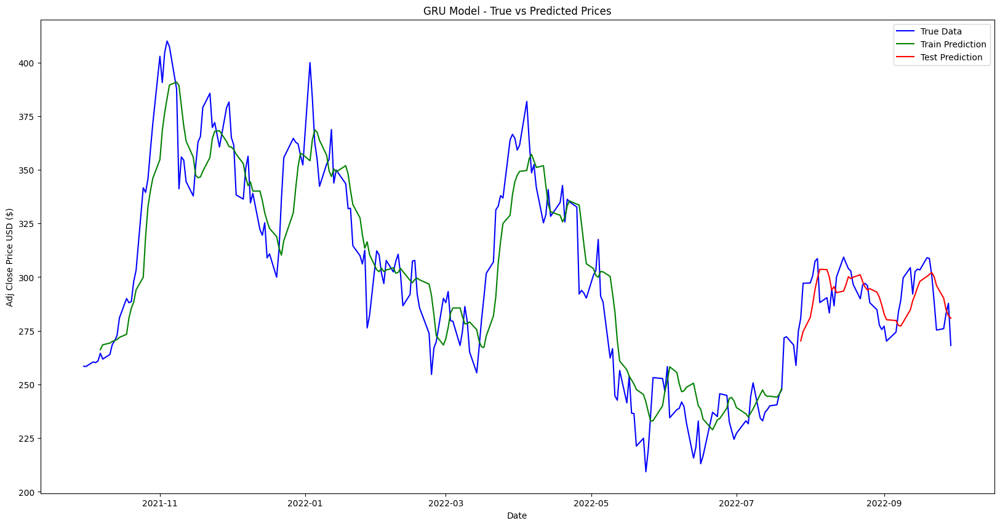

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━

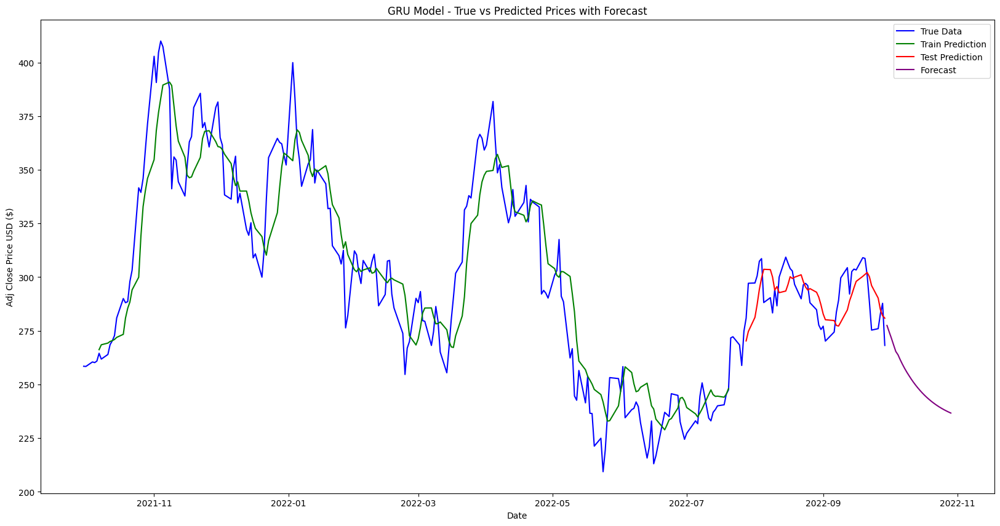

In [30]:
# 2 layer gru
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import random
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout, Bidirectional
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf
# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close', 'Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the GRU model with two layers
model = Sequential([
    GRU(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    GRU(25, return_sequences=False),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [32]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a comparison DataFrame for the test set (actual vs. predicted values)
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and a comparison table for the test set
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 277.49

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  270.291145
1 2022-07-29  297.149994  274.680291
2 2022-08-01  297.276672  281.266350
3 2022-08-02  300.586670  287.244289
4 2022-08-03  307.396667  294.275351
5 2022-08-04  308.633331  299.558795
6 2022-08-05  288.170013  303.652875
7 2022-08-08  290.423340  303.516717
8 2022-08-09  283.333344  300.042696
9 2022-08-10  294.356659  293.994033


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4668
Epoch 1: val_loss improved from inf to 0.07505, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 221ms/step - loss: 0.4164 - val_loss: 0.0751 - learning_rate: 0.0010
Epoch 2/100
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1435 
Epoch 2: val_loss improved from 0.07505 to 0.00272, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1278 - val_loss: 0.0027 - learning_rate: 0.0010
Epoch 3/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0368
Epoch 3: val_loss did not improve from 0.00272
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0358 - val_loss: 0.0248 - learning_rate: 0.0010
Epoch 4/100
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0391 
Epoch 4: val_loss did not improve from 0.00272
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0412 - val_loss: 0.0252 - learning_rate: 0.0010
Epoch 5/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0365
Epoch 5: val_loss did not imp

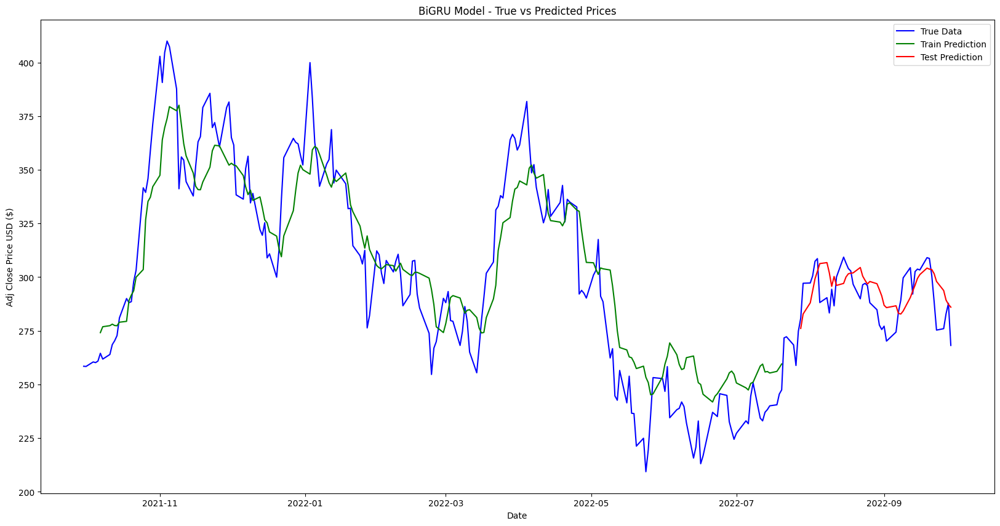

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━

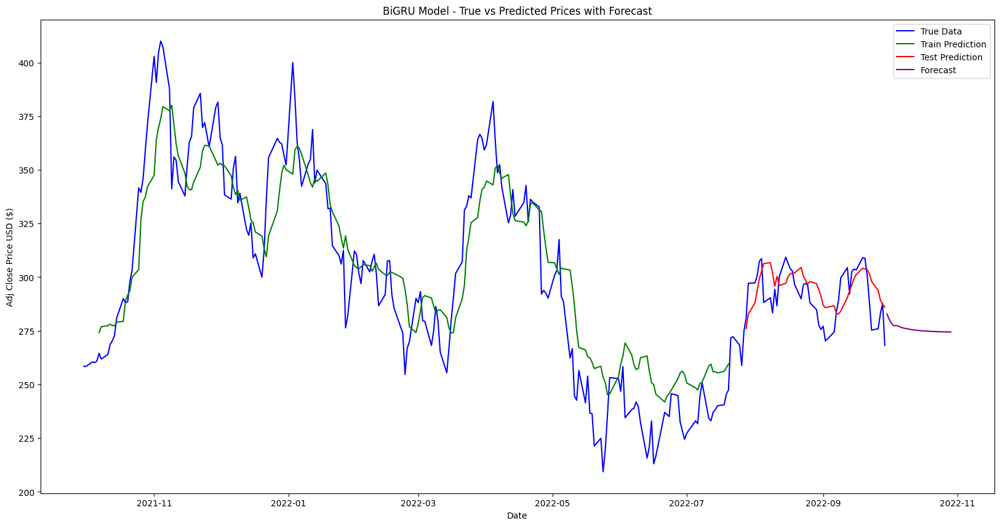

In [33]:
# BiGRU WITH 1 LAYER
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout, Bidirectional
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf
# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close', 'Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the BiGRU model with one layer
model = Sequential([
    Bidirectional(GRU(50, return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiGRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiGRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [34]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a comparison DataFrame for the test set (actual vs. predicted values)
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and a comparison table for the test set
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 282.86

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  276.121873
1 2022-07-29  297.149994  282.839851
2 2022-08-01  297.276672  288.039492
3 2022-08-02  300.586670  293.654826
4 2022-08-03  307.396667  299.277974
5 2022-08-04  308.633331  302.718579
6 2022-08-05  288.170013  306.318834
7 2022-08-08  290.423340  306.772816
8 2022-08-09  283.333344  302.024120
9 2022-08-10  294.356659  295.701971


In [ ]:
# Not mentioned in the project report
#BiGRU WITH 2 LAYER
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout, Bidirectional
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf

# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close', 'avg_score_vader_compound']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Building and compiling the BiGRU model with two layers
model = Sequential([
    Bidirectional(GRU(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]))),
    Dropout(0.2),
    Bidirectional(GRU(25, return_sequences=False)),
    Dropout(0.2),
    Dense(1, activation='linear')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Define callbacks and fit the model
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiGRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('BiGRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

Reloading Tuner from my_dir/gru_tuning/tuner0.json


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1633
Epoch 1: val_loss improved from inf to 0.01871, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.1455 - val_loss: 0.0187 - learning_rate: 0.0010
Epoch 2/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0197
Epoch 2: val_loss improved from 0.01871 to 0.01035, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0196 - val_loss: 0.0104 - learning_rate: 0.0010
Epoch 3/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0216
Epoch 3: val_loss improved from 0.01035 to 0.00621, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - loss: 0.0200 - val_loss: 0.0062 - learning_rate: 0.0010
Epoch 4/100
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0133
Epoch 4: val_loss improved from 0.00621 to 0.00277, saving model to best.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0131 - val_loss: 0.0028 - learning_rate: 0.0010
Epoch 5/100
6/7 ━━━━━━

<Figure size 1400x700 with 0 Axes>

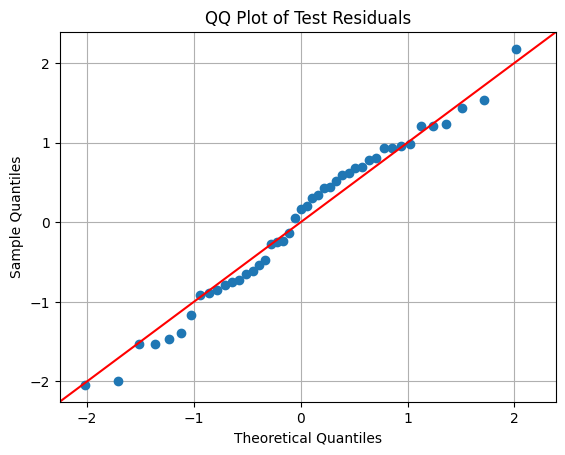

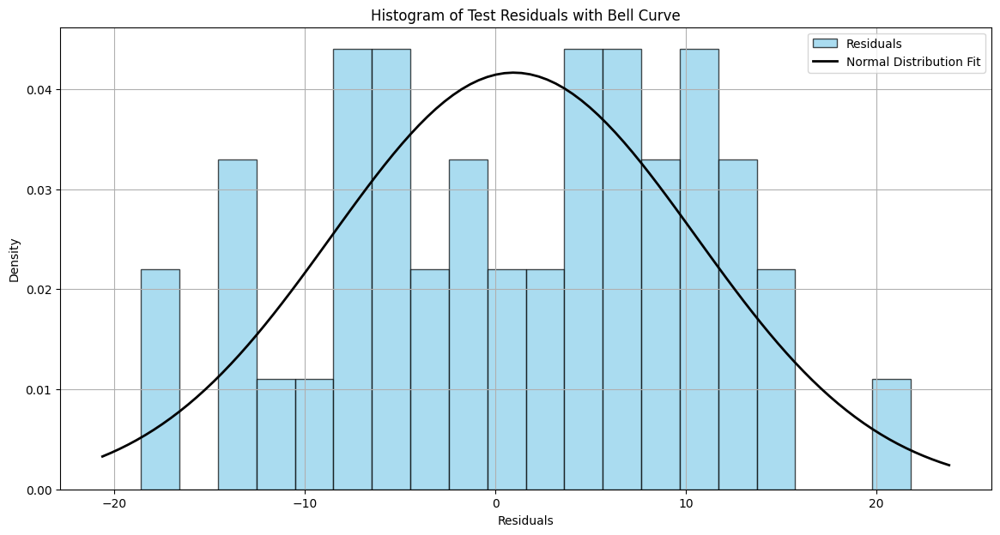

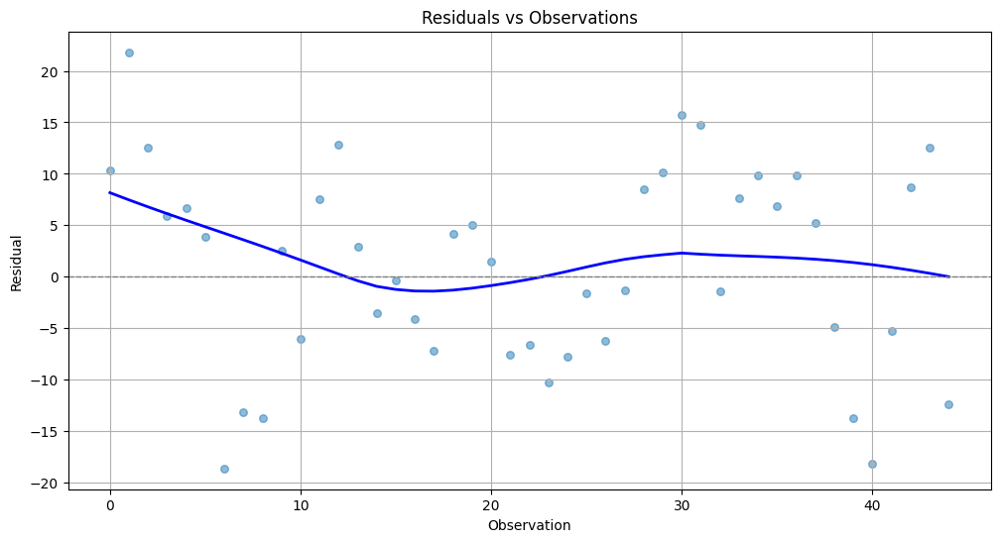

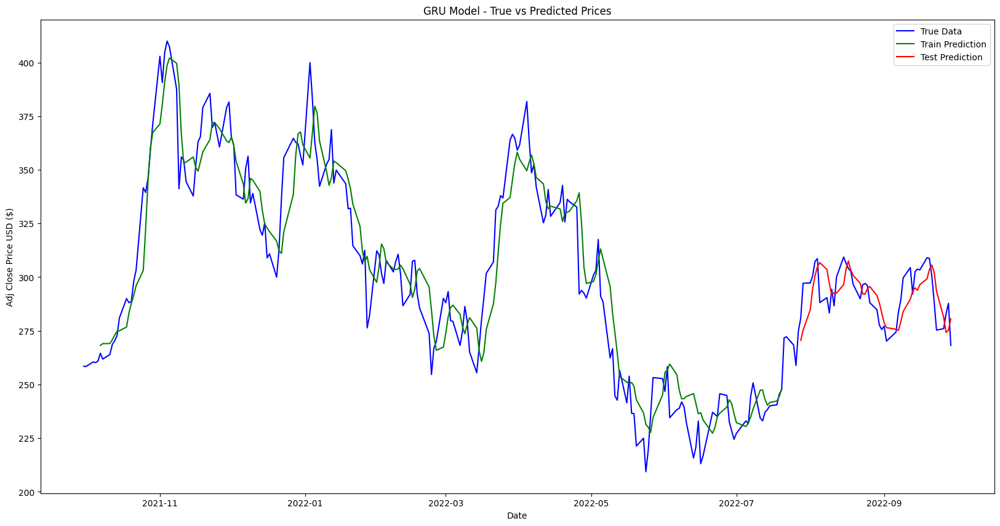

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━

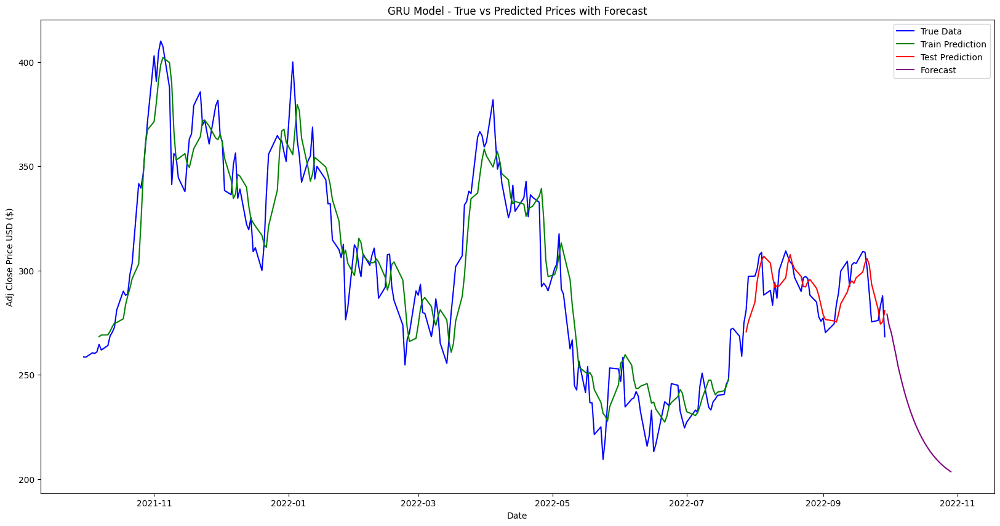

In [85]:
# HYPER PARAMETER FRO GRU(1 LAYER)
!pip install keras-tuner
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import keras_tuner as kt
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam
import tensorflow as tf


# Set random seed for reproducibility
def set_seed(seed=9):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv')
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index('Date', inplace=True)

# Filter for Tesla stock data
df_tesla = df[df['Stock Name'] == 'TSLA']

# Select relevant columns
cols = ['Adj Close', 'Total_Score_Vader']
df_tesla = df_tesla[cols]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(df_tesla)

# Split dataset into train and test sets
test_size = 50
training_size = len(scaled_data) - test_size
train_data, test_data = scaled_data[0:training_size], scaled_data[training_size:len(scaled_data)]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step):
        a = dataset[i:(i+time_step)]
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])  # Predicting 'Adj_Close'
    return np.array(dataX), np.array(dataY)

# Reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 5
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# Reshape input to be [samples, time steps, features] which is required for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

# Define the model
def build_gru_model(hp):
    model = Sequential()
    model.add(GRU(units=hp.Int('units', min_value=32, max_value=512, step=32),
                   return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='mean_squared_error')
    return model

# Set up the tuner
tuner = kt.RandomSearch(
    build_gru_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='gru_tuning'
)

# Define callbacks
es = EarlyStopping(monitor='val_loss', patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
mcp = ModelCheckpoint('best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard(log_dir='./logs')

# Perform hyperparameter tuning
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build and train the model with the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[es, rlr, mcp, tb], shuffle=True, verbose=1)

# Make predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Transform back to original form
train_predict = scaler.inverse_transform(np.concatenate((train_predict, np.zeros((train_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
test_predict = scaler.inverse_transform(np.concatenate((test_predict, np.zeros((test_predict.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_train = scaler.inverse_transform(np.concatenate((y_train.reshape(-1, 1), np.zeros((y_train.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]
y_test = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), np.zeros((y_test.shape[0], scaled_data.shape[1] - 1))), axis=1))[:,0]

# Calculate RMSE
train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))

# Calculate additional metrics for training set
mse_train = mean_squared_error(y_train, train_predict)
mae_train = mean_absolute_error(y_train, train_predict)
r2_train = r2_score(y_train, train_predict)
n_train = len(y_train)
p_train = X_train.shape[2]
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate additional metrics for testing set
mse_test = mean_squared_error(y_test, test_predict)
mae_test = mean_absolute_error(y_test, test_predict)
r2_test = r2_score(y_test, test_predict)
n_test = len(y_test)
p_test = X_test.shape[2]
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_predict) / y_train)) * 100)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_predict) / y_test)) * 100)

print("Training MSE:", mse_train)
print("Training MAE:", mae_train)
print("Training R2 Score:", r2_train)
print("Training Adjusted R2 Score:", adjusted_r2_train)
print("Training Accuracy:", accuracy_train, "%")

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Calculate residuals
train_residuals = y_train - train_predict
test_residuals = y_test - test_predict

# Plot QQ Plot for residuals of the test set
plt.figure(figsize=(14, 7))
sm.qqplot(test_residuals, line='45', fit=True)
plt.title('QQ Plot of Test Residuals')
plt.grid(True)
plt.show()


# Fit a normal distribution to the test residuals
mu, std = norm.fit(test_residuals)

# Plot Histogram of the residuals for the test set with Bell Curve
plt.figure(figsize=(14, 7))
plt.hist(test_residuals, bins=20, density=True, alpha=0.7, edgecolor='k', color='skyblue', label='Residuals')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Normal Distribution Fit')
plt.title('Histogram of Test Residuals with Bell Curve')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

# Plot residuals vs observations with a Loess smoother
plt.figure(figsize=(12, 6))
sns.regplot(x=np.arange(len(test_residuals)), y=test_residuals, lowess=True, scatter_kws={'s': 30, 'alpha': 0.5}, line_kws={'color': 'blue', 'lw': 2})
plt.axhline(0, color='gray', linestyle='--', lw=1)
plt.title('Residuals vs Observations')
plt.xlabel('Observation')
plt.ylabel('Residual')
plt.grid(True)
plt.show()


# Shift train predictions for plotting
look_back = time_step
trainPredictPlot = np.empty_like(scaled_data)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, 0] = train_predict

# Shift test predictions for plotting
testPredictPlot = np.empty_like(scaled_data)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2):len(scaled_data), 0] = test_predict

# Plot baseline and predictions
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices')
plt.legend()
plt.show()

# Forecasting future values
forecast_steps = 30
forecast_input = test_data[-look_back:].reshape(1, look_back, test_data.shape[1])

forecast = []
for _ in range(forecast_steps):
    forecast_step = model.predict(forecast_input)
    forecast.append(forecast_step[0, 0])
    # Create a placeholder for the additional features
    placeholder = np.zeros((1, 1, forecast_input.shape[2] - 1))
    # Concatenate the forecast step with the placeholder
    forecast_step_with_features = np.concatenate((forecast_step.reshape(1, 1, 1), placeholder), axis=2)
    forecast_input = np.append(forecast_input[:, 1:, :], forecast_step_with_features, axis=1)

forecast = scaler.inverse_transform(np.concatenate((np.array(forecast).reshape(-1, 1), np.zeros((forecast_steps, scaled_data.shape[1] - 1))), axis=1))[:,0]

# Generate forecast dates correctly
forecast_dates = pd.date_range(start=df_tesla.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

# Plot baseline, predictions, and forecast
plt.figure(figsize=(20,10))
plt.plot(df_tesla.index, scaler.inverse_transform(scaled_data)[:,0], label='True Data', color='blue')
plt.plot(df_tesla.index, trainPredictPlot[:,0], label='Train Prediction', color='green')
plt.plot(df_tesla.index, testPredictPlot[:,0], label='Test Prediction', color='red')
plt.plot(forecast_dates, forecast, label='Forecast', color='purple')

plt.xlabel('Date')
plt.ylabel('Adj Close Price USD ($)')
plt.title('GRU Model - True vs Predicted Prices with Forecast')
plt.legend()
plt.show()

In [36]:
# Extract the first forecasted value
first_forecasted_value = forecast[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a comparison DataFrame for the test set (actual vs. predicted values)
comparison_df = pd.DataFrame({
    'Date': df_tesla.index[-len(test_predict):],  # Dates corresponding to the test set
    'Actual': y_test,
    'Predicted': test_predict
})

# Display the first forecasted value and a comparison table for the test set
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(10))  # Display the first 10 rows of the comparison table

First Forecasted Value: 278.76

Comparison of Actual vs Predicted Values from Test Set:
        Date      Actual   Predicted
0 2022-07-28  280.899994  270.010270
1 2022-07-29  297.149994  275.254475
2 2022-08-01  297.276672  285.039772
3 2022-08-02  300.586670  294.605759
4 2022-08-03  307.396667  300.343472
5 2022-08-04  308.633331  304.416509
6 2022-08-05  288.170013  306.594269
7 2022-08-08  290.423340  303.607604
8 2022-08-09  283.333344  297.041643
9 2022-08-10  294.356659  291.370684


  5%|▌         | 53/1000 [00:25<01:03, 14.80it/s]

Epoch 50 Discriminator Loss 1.3785468 Generator Loss 0.70196766


 10%|█         | 105/1000 [00:27<00:37, 24.04it/s]

Epoch 100 Discriminator Loss 1.3800251 Generator Loss 0.70123976


 16%|█▌        | 155/1000 [00:29<00:39, 21.50it/s]

Epoch 150 Discriminator Loss 1.3932993 Generator Loss 0.68602747


 20%|██        | 204/1000 [00:31<00:44, 17.96it/s]

Epoch 200 Discriminator Loss 1.3886094 Generator Loss 0.6887487


 26%|██▌       | 255/1000 [00:33<00:30, 24.38it/s]

Epoch 250 Discriminator Loss 1.3868297 Generator Loss 0.6954246


 30%|███       | 303/1000 [00:35<00:43, 16.11it/s]

Epoch 300 Discriminator Loss 1.3880663 Generator Loss 0.68807083


 35%|███▌      | 354/1000 [00:38<00:33, 19.23it/s]

Epoch 350 Discriminator Loss 1.3819972 Generator Loss 0.6951003


 41%|████      | 406/1000 [00:40<00:21, 27.22it/s]

Epoch 400 Discriminator Loss 1.3859317 Generator Loss 0.69571066


 46%|████▌     | 455/1000 [00:41<00:20, 27.10it/s]

Epoch 450 Discriminator Loss 1.3897164 Generator Loss 0.6906884


 50%|█████     | 503/1000 [00:43<00:21, 23.12it/s]

Epoch 500 Discriminator Loss 1.3838066 Generator Loss 0.69223005


 55%|█████▌    | 554/1000 [00:45<00:17, 25.19it/s]

Epoch 550 Discriminator Loss 1.3809985 Generator Loss 0.7018801


 60%|██████    | 604/1000 [00:47<00:13, 28.90it/s]

Epoch 600 Discriminator Loss 1.3829539 Generator Loss 0.6976055


 65%|██████▌   | 654/1000 [00:49<00:14, 23.70it/s]

Epoch 650 Discriminator Loss 1.4005587 Generator Loss 0.6735512


 70%|███████   | 701/1000 [00:51<00:21, 13.95it/s]

Epoch 700 Discriminator Loss 1.3922453 Generator Loss 0.68815076


 75%|███████▌  | 754/1000 [00:54<00:12, 19.83it/s]

Epoch 750 Discriminator Loss 1.3888546 Generator Loss 0.6915155


 80%|████████  | 805/1000 [00:56<00:08, 24.03it/s]

Epoch 800 Discriminator Loss 1.3944974 Generator Loss 0.6892624


 86%|████████▌ | 855/1000 [00:58<00:05, 27.13it/s]

Epoch 850 Discriminator Loss 1.3848245 Generator Loss 0.6933266


 90%|█████████ | 904/1000 [01:00<00:03, 26.89it/s]

Epoch 900 Discriminator Loss 1.3846138 Generator Loss 0.69621104


 96%|█████████▌| 955/1000 [01:02<00:01, 26.81it/s]

Epoch 950 Discriminator Loss 1.3804165 Generator Loss 0.6945402


100%|██████████| 1000/1000 [01:03<00:00, 15.72it/s]


Epoch 1000 Discriminator Loss 1.3824701 Generator Loss 0.69573855


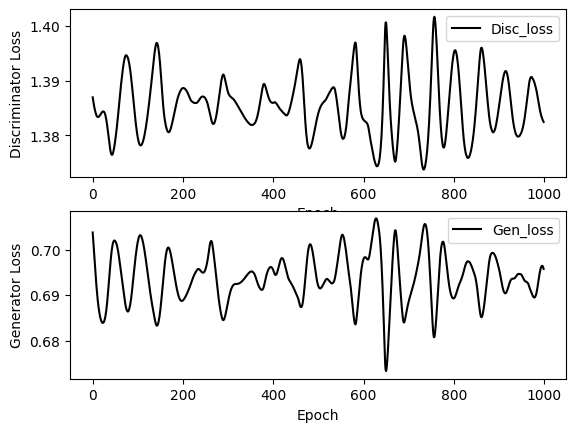

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step
Test MSE: 385.80426855734703
Test MAE: 15.828647769425784
Test RMSE: 19.641900838700593
Test R2 Score: -1.2803614353218697
Test Adjusted R2 Score: -1.327868965224409
Test Accuracy: 94.47556847492027 %


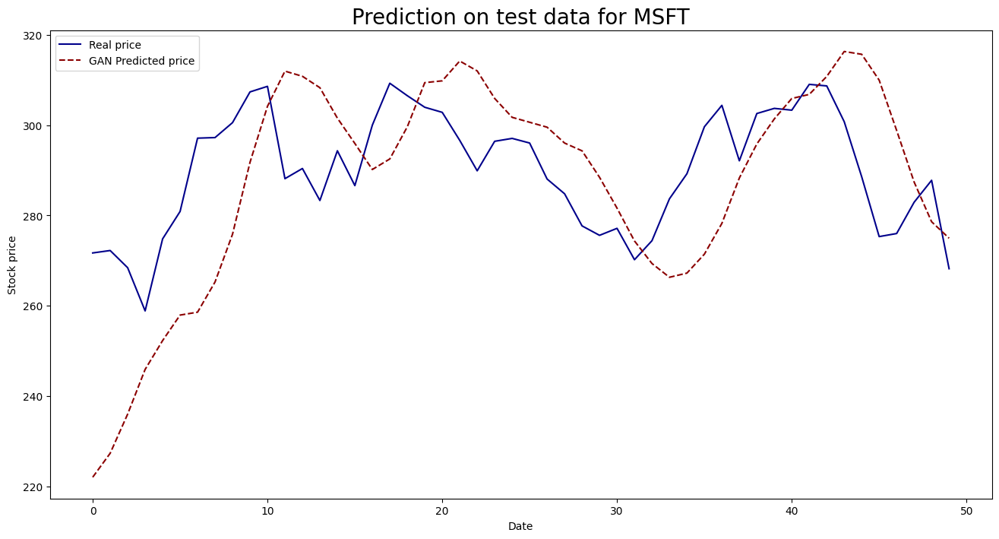

In [63]:
# LSTM+CNN with multiple varibles GAN
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Conv1D, LeakyReLU, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tqdm import tqdm
from pickle import dump, load
import random

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

# Create directory for saving models if it doesn't exist
model_dir = './models_gan'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv', dayfirst=True)
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index(pd.DatetimeIndex(df['Date'].values), inplace=True)
df = df.sort_values(by='Date')

# Filter for MSFT stock data
df_msft = df[df['Stock Name'] == 'TSLA']

# Keep only the necessary columns
df_msft = df_msft[['Adj Close', 'Total_Score_Vader']]

# Normalize data
def normalize_data(df, feature_range, target_col):
    target_df_series = pd.DataFrame(df[target_col])
    data = pd.DataFrame(df)
    X_scaler = MinMaxScaler(feature_range=feature_range)
    y_scaler = MinMaxScaler(feature_range=feature_range)
    X_scaler.fit(data)
    y_scaler.fit(target_df_series)
    X_scale_dataset = X_scaler.transform(data)
    y_scale_dataset = y_scaler.transform(target_df_series)
    dump(X_scaler, open('X_scaler.pkl', 'wb'))
    dump(y_scaler, open('y_scaler.pkl', 'wb'))
    return (X_scale_dataset, y_scale_dataset)

# Normalize the dataset
X_scale_dataset, y_scale_dataset = normalize_data(df_msft, (-1, 1), "Adj Close")

# Batch data
def batch_data(x_data, y_data, batch_size, predict_period):
    X_batched, y_batched, yc = list(), list(), list()
    for i in range(0, len(x_data) - batch_size - predict_period + 1):
        x_value = x_data[i: i + batch_size][:, :]
        y_value = y_data[i + batch_size: i + batch_size + predict_period][:, 0]
        yc_value = y_data[i: i + batch_size][:, :]
        if len(x_value) == batch_size and len(y_value) == predict_period:
            X_batched.append(x_value)
            y_batched.append(y_value)
            yc.append(yc_value)
    return np.array(X_batched), np.array(y_batched), np.array(yc)

# Create batched data
X_batched, y_batched, yc = batch_data(X_scale_dataset, y_scale_dataset, batch_size=5, predict_period=1)

# Split data into training and testing sets
def split_train_test(data):
    train_size = int(len(data) * 0.8)
    data_train = data[:train_size]
    data_test = data[train_size:]
    return data_train, data_test

X_train, X_test = split_train_test(X_batched)
y_train, y_test = split_train_test(y_batched)
yc_train, yc_test = split_train_test(yc)

# Build the generator model
def make_generator_model(input_dim, output_dim, feature_size):
    model = Sequential([
        Input(shape=(input_dim, feature_size)),
        LSTM(64, return_sequences=True),
        LSTM(32, return_sequences=False),
        Dense(10),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build the discriminator model
def make_discriminator_model(input_dim):
    cnn_net = Sequential([
        Input(shape=(input_dim + 1, 1)),
        Conv1D(8, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(16, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(32, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Dense(1, activation='sigmoid')
    ])
    return cnn_net

input_dim = X_train.shape[1]
feature_size = X_train.shape[2]
output_dim = y_train.shape[1]

generator = make_generator_model(input_dim, output_dim, feature_size)
discriminator = make_discriminator_model(input_dim)

# Define loss functions
def discriminator_loss(real_output, fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    real_loss = loss_f(tf.ones_like(real_output), real_output)
    fake_loss = loss_f(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    loss = loss_f(tf.ones_like(fake_output), fake_output)
    return loss

# Training step
@tf.function
def train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_data = generator(real_x, training=True)
        generated_data_reshape = tf.reshape(generated_data, [generated_data.shape[0], generated_data.shape[1], 1])
        d_fake_input = tf.concat([tf.cast(generated_data_reshape, tf.float64), yc], axis=1)
        real_y_reshape = tf.reshape(real_y, [real_y.shape[0], real_y.shape[1], 1])
        d_real_input = tf.concat([real_y_reshape, yc], axis=1)
        real_output = discriminator(d_real_input, training=True)
        fake_output = discriminator(d_fake_input, training=True)
        g_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    g_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    d_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return real_y, generated_data, {'d_loss': disc_loss, 'g_loss': g_loss}

# Train the GAN
def train(real_x, real_y, yc, Epochs, generator, discriminator, g_optimizer, d_optimizer, checkpoint=50):
    train_info = {"discriminator_loss": [], "generator_loss": []}
    for epoch in tqdm(range(Epochs)):
        real_price, fake_price, loss = train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer)
        train_info["discriminator_loss"].append(loss['d_loss'].numpy())
        train_info["generator_loss"].append(loss['g_loss'].numpy())
        if (epoch + 1) % checkpoint == 0:
            generator.save(f'./models_gan/generator_V_{epoch}.keras')
            discriminator.save(f'./models_gan/discriminator_V_{epoch}.keras')
            print('Epoch', epoch + 1, 'Discriminator Loss', loss['d_loss'].numpy(), 'Generator Loss', loss['g_loss'].numpy())
    plt.subplot(2, 1, 1)
    plt.plot(train_info["discriminator_loss"], label='Disc_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Discriminator Loss')
    plt.legend()
    plt.subplot(2, 1, 2)
    plt.plot(train_info["generator_loss"], label='Gen_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Generator Loss')
    plt.legend()
    plt.show()
    return train_info

# Define the optimizers
g_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)
d_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

# Train the model
epochs = 1000
train_info = train(X_train, y_train, yc_train, epochs, generator, discriminator, g_optimizer, d_optimizer)

# Save the model plot
plot_model(generator, to_file='generator_keras_model.png', show_shapes=True)
plot_model(discriminator, to_file='discriminator_keras_model.png', show_shapes=True)

# Evaluate on test data
# Load the last saved model without loading optimizer state
test_generator = tf.keras.models.load_model(f'./models_gan/generator_V_{epochs-1}.keras', compile=False)
test_generator.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Predict test data
predicted_test_data = test_generator.predict(X_test)

# Inverse transform the data for comparison
y_scaler = load(open('y_scaler.pkl', 'rb'))
y_test = y_scaler.inverse_transform(y_test)
predicted_test_data = y_scaler.inverse_transform(predicted_test_data)

# Calculate and print metrics
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = y_true.shape[1] if len(y_true.shape) > 1 else 1
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    accuracy = 100 - (np.mean(np.abs((y_true - y_pred) / y_true)) * 100)
    return mse, mae, rmse, r2, adjusted_r2, accuracy

mse_test, mae_test, rmse_test, r2_test, adjusted_r2_test, accuracy_test = calculate_metrics(y_test, predicted_test_data)

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test RMSE:", rmse_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Plot the test results
plt.figure(figsize=(16, 8))
plt.plot(y_test, color='#00008B')
plt.plot(predicted_test_data, color='#8B0000', linestyle='--')
plt.xlabel("Date")
plt.ylabel("Stock price")
plt.legend(("Real price", "GAN Predicted price"), loc="upper left", fontsize=10)
plt.title("Prediction on test data for MSFT", fontsize=20)
plt.show()

In [64]:
# Extract the first forecasted value from the generator predictions
first_forecasted_value = predicted_test_data[0, 0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_msft.index[-len(predicted_test_data):],  # Corresponding dates from the test set
    'Actual': y_test.flatten(),  # Actual values
    'Predicted': predicted_test_data.flatten()  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows

First Forecasted Value: 222.00

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-21  271.706665  221.997208
1  2022-07-22  272.243347  227.303650
2  2022-07-25  268.433319  235.981018
3  2022-07-26  258.859985  245.890854
4  2022-07-27  274.820007  252.279190
5  2022-07-28  280.899994  257.935364
6  2022-07-29  297.149994  258.576752
7  2022-08-01  297.276672  265.271698
8  2022-08-02  300.586670  275.852295
9  2022-08-03  307.396667  291.778839
10 2022-08-04  308.633331  304.204620
11 2022-08-05  288.170013  312.005249
12 2022-08-08  290.423340  310.860413
13 2022-08-09  283.333344  308.330505
14 2022-08-10  294.356659  301.588837
15 2022-08-11  286.630005  295.974976
16 2022-08-12  300.029999  290.199341
17 2022-08-15  309.320007  292.540924
18 2022-08-16  306.563324  299.656830
19 2022-08-17  303.996674  309.452576
20 2022-08-18  302.869995  309.855408
21 2022-08-19  296.666656  314.246307
22 2022-08-22  289.913330  312.053131


  5%|▌         | 52/1000 [00:14<01:03, 14.96it/s]

Epoch 50 Discriminator Loss 1.391133 Generator Loss 0.69450146


 10%|█         | 103/1000 [00:16<00:45, 19.56it/s]

Epoch 100 Discriminator Loss 1.3860519 Generator Loss 0.6924252


 15%|█▌        | 152/1000 [00:18<00:30, 27.64it/s]

Epoch 150 Discriminator Loss 1.3855884 Generator Loss 0.696394


 21%|██        | 206/1000 [00:20<00:29, 27.24it/s]

Epoch 200 Discriminator Loss 1.3879014 Generator Loss 0.69029146


 25%|██▌       | 254/1000 [00:22<00:26, 28.29it/s]

Epoch 250 Discriminator Loss 1.3873863 Generator Loss 0.6927561


 31%|███       | 306/1000 [00:23<00:25, 27.51it/s]

Epoch 300 Discriminator Loss 1.3852406 Generator Loss 0.6941191


 36%|███▌      | 355/1000 [00:25<00:21, 29.62it/s]

Epoch 350 Discriminator Loss 1.3870044 Generator Loss 0.69171095


 40%|████      | 402/1000 [00:27<00:27, 22.00it/s]

Epoch 400 Discriminator Loss 1.3854122 Generator Loss 0.6930641


 45%|████▌     | 452/1000 [00:29<00:30, 18.09it/s]

Epoch 450 Discriminator Loss 1.3862476 Generator Loss 0.6931963


 50%|█████     | 503/1000 [00:31<00:19, 25.48it/s]

Epoch 500 Discriminator Loss 1.386313 Generator Loss 0.69112104


 55%|█████▌    | 553/1000 [00:33<00:16, 27.93it/s]

Epoch 550 Discriminator Loss 1.3820984 Generator Loss 0.6961362


 60%|██████    | 605/1000 [00:35<00:13, 28.78it/s]

Epoch 600 Discriminator Loss 1.3832366 Generator Loss 0.6961797


 65%|██████▌   | 654/1000 [00:36<00:12, 26.98it/s]

Epoch 650 Discriminator Loss 1.3813856 Generator Loss 0.696948


 70%|███████   | 705/1000 [00:38<00:10, 28.13it/s]

Epoch 700 Discriminator Loss 1.387547 Generator Loss 0.69253725


 76%|███████▌  | 755/1000 [00:40<00:08, 28.16it/s]

Epoch 750 Discriminator Loss 1.3858037 Generator Loss 0.6928253


 80%|████████  | 803/1000 [00:42<00:12, 15.58it/s]

Epoch 800 Discriminator Loss 1.3858979 Generator Loss 0.6938179


 85%|████████▌ | 852/1000 [00:45<00:12, 11.93it/s]

Epoch 850 Discriminator Loss 1.3867272 Generator Loss 0.6927198


 90%|█████████ | 903/1000 [00:48<00:06, 14.15it/s]

Epoch 900 Discriminator Loss 1.3869159 Generator Loss 0.6925971


 95%|█████████▌| 953/1000 [00:51<00:02, 21.20it/s]

Epoch 950 Discriminator Loss 1.3861036 Generator Loss 0.69319886


100%|██████████| 1000/1000 [00:52<00:00, 18.92it/s]


Epoch 1000 Discriminator Loss 1.3863742 Generator Loss 0.69296503


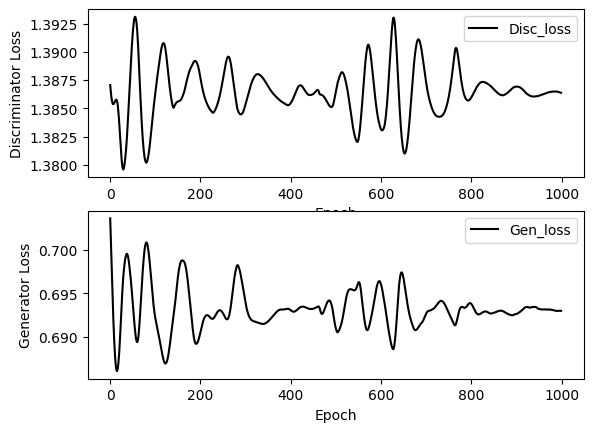

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step
Test MSE: 256.73098997794403
Test MAE: 13.406228030828125
Test RMSE: 16.02282715309455
Test R2 Score: -0.5174519737349348
Test Adjusted R2 Score: -0.5490655565210794
Test Accuracy: 95.42210110190969 %


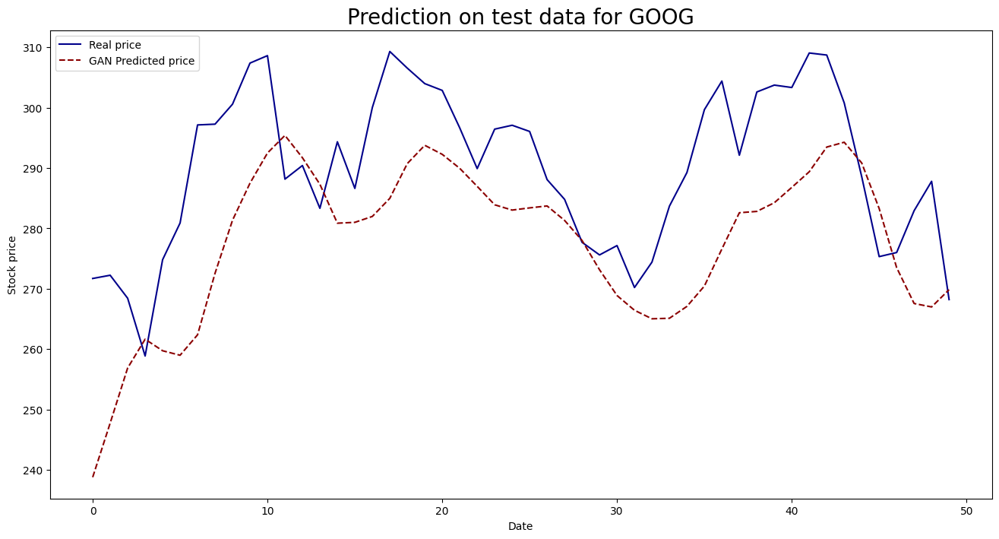

In [65]:
# GRU+cnn with multiple varibles GAN
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Conv1D, LeakyReLU, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tqdm import tqdm
from pickle import dump, load
import random

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

# Create directory for saving models if it doesn't exist
model_dir = './models_gan'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv', dayfirst=True)
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index(pd.DatetimeIndex(df['Date'].values), inplace=True)
df = df.sort_values(by='Date')

# Filter for GOOG stock data
df_goog = df[df['Stock Name'] == 'TSLA']

# Keep only the necessary columns
df_goog = df_goog[['Adj Close','Total_Score_Vader']]

# Normalize data
def normalize_data(df, feature_range, target_col):
    target_df_series = pd.DataFrame(df[target_col])
    data = pd.DataFrame(df)
    X_scaler = MinMaxScaler(feature_range=feature_range)
    y_scaler = MinMaxScaler(feature_range=feature_range)
    X_scaler.fit(data)
    y_scaler.fit(target_df_series)
    X_scale_dataset = X_scaler.transform(data)
    y_scale_dataset = y_scaler.transform(target_df_series)
    dump(X_scaler, open('X_scaler.pkl', 'wb'))
    dump(y_scaler, open('y_scaler.pkl', 'wb'))
    return (X_scale_dataset, y_scale_dataset)

# Normalize the dataset
X_scale_dataset, y_scale_dataset = normalize_data(df_goog, (-1, 1), "Adj Close")

# Batch data
def batch_data(x_data, y_data, batch_size, predict_period):
    X_batched, y_batched, yc = list(), list(), list()
    for i in range(0, len(x_data) - batch_size - predict_period + 1):
        x_value = x_data[i: i + batch_size][:, :]
        y_value = y_data[i + batch_size: i + batch_size + predict_period][:, 0]
        yc_value = y_data[i: i + batch_size][:, :]
        if len(x_value) == batch_size and len(y_value) == predict_period:
            X_batched.append(x_value)
            y_batched.append(y_value)
            yc.append(yc_value)
    return np.array(X_batched), np.array(y_batched), np.array(yc)

# Create batched data
X_batched, y_batched, yc = batch_data(X_scale_dataset, y_scale_dataset, batch_size=5, predict_period=1)

# Split data into training and testing sets
def split_train_test(data):
    train_size = int(len(data) * 0.8)
    data_train = data[:train_size]
    data_test = data[train_size:]
    return data_train, data_test

X_train, X_test = split_train_test(X_batched)
y_train, y_test = split_train_test(y_batched)
yc_train, yc_test = split_train_test(yc)

# Build the generator model using GRU
def make_generator_model(input_dim, output_dim, feature_size):
    model = Sequential([
        Input(shape=(input_dim, feature_size)),
        GRU(64, return_sequences=True),
        GRU(32, return_sequences=False),
        Dense(10),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build the discriminator model using CNN
def make_discriminator_model(input_dim):
    cnn_net = Sequential([
        Input(shape=(input_dim + 1, 1)),
        Conv1D(8, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(16, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(32, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Dense(1, activation='sigmoid')
    ])
    return cnn_net

input_dim = X_train.shape[1]
feature_size = X_train.shape[2]
output_dim = y_train.shape[1]

generator = make_generator_model(input_dim, output_dim, feature_size)
discriminator = make_discriminator_model(input_dim)

# Define loss functions
def discriminator_loss(real_output, fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    real_loss = loss_f(tf.ones_like(real_output), real_output)
    fake_loss = loss_f(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    loss = loss_f(tf.ones_like(fake_output), fake_output)
    return loss

# Training step
@tf.function
def train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_data = generator(real_x, training=True)
        generated_data_reshape = tf.reshape(generated_data, [generated_data.shape[0], generated_data.shape[1], 1])
        d_fake_input = tf.concat([tf.cast(generated_data_reshape, tf.float64), yc], axis=1)
        real_y_reshape = tf.reshape(real_y, [real_y.shape[0], real_y.shape[1], 1])
        d_real_input = tf.concat([real_y_reshape, yc], axis=1)
        real_output = discriminator(d_real_input, training=True)
        fake_output = discriminator(d_fake_input, training=True)
        g_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    g_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    d_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return real_y, generated_data, {'d_loss': disc_loss, 'g_loss': g_loss}

# Train the GAN
def train(real_x, real_y, yc, Epochs, generator, discriminator, g_optimizer, d_optimizer, checkpoint=50):
    train_info = {"discriminator_loss": [], "generator_loss": []}
    for epoch in tqdm(range(Epochs)):
        real_price, fake_price, loss = train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer)
        train_info["discriminator_loss"].append(loss['d_loss'].numpy())
        train_info["generator_loss"].append(loss['g_loss'].numpy())
        if (epoch + 1) % checkpoint == 0:
            generator.save(f'./models_gan/generator_V_{epoch}.keras')
            discriminator.save(f'./models_gan/discriminator_V_{epoch}.keras')
            print('Epoch', epoch + 1, 'Discriminator Loss', loss['d_loss'].numpy(), 'Generator Loss', loss['g_loss'].numpy())
    plt.subplot(2, 1, 1)
    plt.plot(train_info["discriminator_loss"], label='Disc_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Discriminator Loss')
    plt.legend()
    plt.subplot(2, 1, 2)
    plt.plot(train_info["generator_loss"], label='Gen_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Generator Loss')
    plt.legend()
    plt.show()
    return train_info

# Define the optimizers
g_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)
d_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

# Train the model
epochs = 1000
train_info = train(X_train, y_train, yc_train, epochs, generator, discriminator, g_optimizer, d_optimizer)

# Save the model plot
plot_model(generator, to_file='generator_keras_model.png', show_shapes=True)
plot_model(discriminator, to_file='discriminator_keras_model.png', show_shapes=True)

# Evaluate on test data
# Load the last saved model without loading optimizer state
test_generator = tf.keras.models.load_model(f'./models_gan/generator_V_{epochs-1}.keras', compile=False)
test_generator.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Predict test data
predicted_test_data = test_generator.predict(X_test)

# Inverse transform the data for comparison
y_scaler = load(open('y_scaler.pkl', 'rb'))
y_test = y_scaler.inverse_transform(y_test)
predicted_test_data = y_scaler.inverse_transform(predicted_test_data)

# Calculate and print metrics
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = y_true.shape[1] if len(y_true.shape) > 1 else 1
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    accuracy = 100 - (np.mean(np.abs((y_true - y_pred) / y_true)) * 100)
    return mse, mae, rmse, r2, adjusted_r2, accuracy

mse_test, mae_test, rmse_test, r2_test, adjusted_r2_test, accuracy_test = calculate_metrics(y_test, predicted_test_data)

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test RMSE:", rmse_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Plot the test results
plt.figure(figsize=(16, 8))
plt.plot(y_test, color='#00008B')
plt.plot(predicted_test_data, color='#8B0000', linestyle='--')
plt.xlabel("Date")
plt.ylabel("Stock price")
plt.legend(("Real price", "GAN Predicted price"), loc="upper left", fontsize=10)
plt.title("Prediction on test data for GOOG", fontsize=20)
plt.show()

In [66]:
# Extract the first forecasted value from the generator predictions
first_forecasted_value = predicted_test_data[0, 0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_goog.index[-len(predicted_test_data):],  # Corresponding dates from the test set
    'Actual': y_test.flatten(),  # Actual values
    'Predicted': predicted_test_data.flatten()  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows of the comparison

First Forecasted Value: 238.78

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-21  271.706665  238.776718
1  2022-07-22  272.243347  247.745743
2  2022-07-25  268.433319  256.877319
3  2022-07-26  258.859985  261.643890
4  2022-07-27  274.820007  259.731445
5  2022-07-28  280.899994  258.986176
6  2022-07-29  297.149994  262.373016
7  2022-08-01  297.276672  272.570801
8  2022-08-02  300.586670  281.358643
9  2022-08-03  307.396667  287.500977
10 2022-08-04  308.633331  292.495300
11 2022-08-05  288.170013  295.413239
12 2022-08-08  290.423340  291.712769
13 2022-08-09  283.333344  287.315735
14 2022-08-10  294.356659  280.868896
15 2022-08-11  286.630005  281.008911
16 2022-08-12  300.029999  281.987610
17 2022-08-15  309.320007  284.983948
18 2022-08-16  306.563324  290.742401
19 2022-08-17  303.996674  293.773804
20 2022-08-18  302.869995  292.277069
21 2022-08-19  296.666656  289.959198
22 2022-08-22  289.913330  286.970337


  5%|▌         | 53/1000 [00:15<00:48, 19.64it/s]

Epoch 50 Discriminator Loss 1.3827865 Generator Loss 0.6964153


 10%|█         | 105/1000 [00:17<00:33, 26.82it/s]

Epoch 100 Discriminator Loss 1.3793161 Generator Loss 0.69821995


 15%|█▌        | 153/1000 [00:19<00:31, 27.09it/s]

Epoch 150 Discriminator Loss 1.3741691 Generator Loss 0.6998662


 20%|██        | 200/1000 [00:22<01:36,  8.29it/s]

Epoch 200 Discriminator Loss 1.3627942 Generator Loss 0.70493335


 25%|██▌       | 252/1000 [00:25<00:57, 12.91it/s]

Epoch 250 Discriminator Loss 1.3382956 Generator Loss 0.71874547


 30%|███       | 303/1000 [00:29<01:06, 10.53it/s]

Epoch 300 Discriminator Loss 1.2928703 Generator Loss 0.74938655


 35%|███▌      | 354/1000 [00:31<00:27, 23.29it/s]

Epoch 350 Discriminator Loss 1.2003906 Generator Loss 0.8226312


 40%|████      | 403/1000 [00:33<00:26, 22.67it/s]

Epoch 400 Discriminator Loss 1.0958916 Generator Loss 0.95299035


 45%|████▌     | 453/1000 [00:36<00:40, 13.60it/s]

Epoch 450 Discriminator Loss 0.99862945 Generator Loss 1.1330872


 50%|█████     | 504/1000 [00:39<00:21, 22.84it/s]

Epoch 500 Discriminator Loss 0.9156617 Generator Loss 1.3613614


 56%|█████▌    | 555/1000 [00:41<00:20, 21.77it/s]

Epoch 550 Discriminator Loss 0.8493616 Generator Loss 1.6019604


 60%|██████    | 604/1000 [00:43<00:16, 24.35it/s]

Epoch 600 Discriminator Loss 0.79471946 Generator Loss 1.8990047


 65%|██████▌   | 654/1000 [00:45<00:15, 22.70it/s]

Epoch 650 Discriminator Loss 0.7619699 Generator Loss 2.1703792


 70%|███████   | 704/1000 [00:47<00:10, 27.17it/s]

Epoch 700 Discriminator Loss 0.72769076 Generator Loss 2.4703815


 75%|███████▌  | 753/1000 [00:49<00:13, 18.25it/s]

Epoch 750 Discriminator Loss 0.7011611 Generator Loss 2.7470713


 80%|████████  | 803/1000 [00:52<00:12, 15.42it/s]

Epoch 800 Discriminator Loss 0.68590844 Generator Loss 3.0567553


 85%|████████▌ | 854/1000 [00:54<00:06, 21.60it/s]

Epoch 850 Discriminator Loss 0.66211045 Generator Loss 3.289095


 90%|█████████ | 904/1000 [00:56<00:04, 22.22it/s]

Epoch 900 Discriminator Loss 0.64438915 Generator Loss 3.6221306


 95%|█████████▌| 953/1000 [00:58<00:02, 21.40it/s]

Epoch 950 Discriminator Loss 0.6272893 Generator Loss 3.9349782


100%|██████████| 1000/1000 [01:00<00:00, 16.63it/s]


Epoch 1000 Discriminator Loss 0.6128024 Generator Loss 4.218314


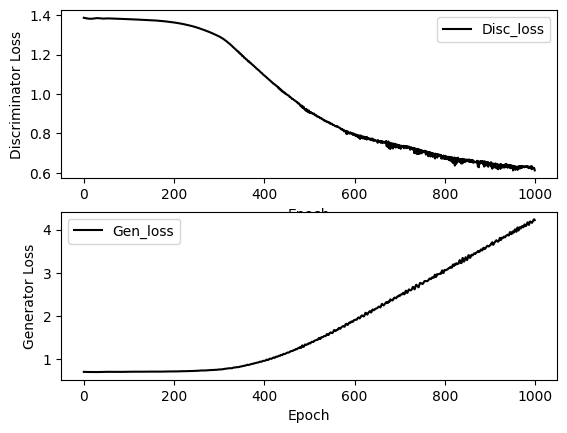

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 813ms/step
Test MSE: 89.19385777887356
Test MAE: 7.241782524832031
Test RMSE: 9.444249984984173
Test R2 Score: 0.472804605539781
Test Adjusted R2 Score: 0.46182136815519315
Test Accuracy: 97.46861300263375 %


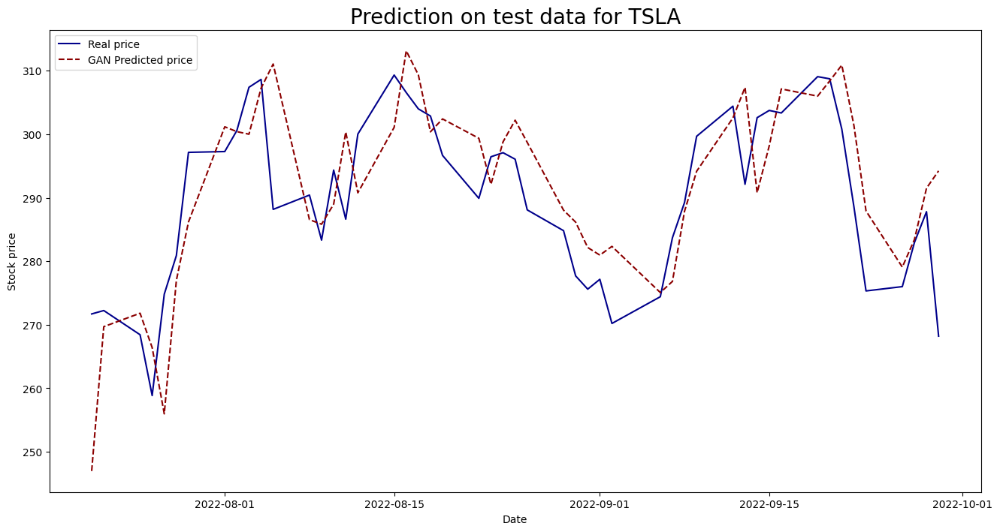

In [67]:
# UNIvarient code for GAN with gru+cnn
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Conv1D, LeakyReLU, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tqdm import tqdm
from pickle import dump, load
import random

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

# Create directory for saving models if it doesn't exist
model_dir = './models_gan'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv', dayfirst=True)
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index(pd.DatetimeIndex(df['Date'].values), inplace=True)
df = df.sort_values(by='Date')

# Filter for TSLA stock data
df_tsla = df[df['Stock Name'] == 'TSLA']

# Keep only the necessary column
df_tsla = df_tsla[['Adj Close']]

# Normalize data
def normalize_data(df, feature_range):
    scaler = MinMaxScaler(feature_range=feature_range)
    scaled_data = scaler.fit_transform(df)
    dump(scaler, open('scaler.pkl', 'wb'))
    return scaled_data

# Normalize the dataset
scaled_data = normalize_data(df_tsla, (-1, 1))

# Batch data
def batch_data(data, batch_size, predict_period):
    X_batched, y_batched = [], []
    for i in range(len(data) - batch_size - predict_period + 1):
        x_value = data[i: i + batch_size]
        y_value = data[i + batch_size: i + batch_size + predict_period]
        if len(x_value) == batch_size and len(y_value) == predict_period:
            X_batched.append(x_value)
            y_batched.append(y_value)
    return np.array(X_batched), np.array(y_batched)

# Create batched data
batch_size = 5
predict_period = 1
X_batched, y_batched = batch_data(scaled_data, batch_size, predict_period)

# Split data into training and testing sets
def split_train_test(data):
    train_size = int(len(data) * 0.8)
    data_train = data[:train_size]
    data_test = data[train_size:]
    return data_train, data_test

X_train, X_test = split_train_test(X_batched)
y_train, y_test = split_train_test(y_batched)

# Ensure yc_train and yc_test are aligned with X_train and X_test
yc_train, yc_test = split_train_test(y_batched)

# Build the generator model using GRU
def make_generator_model(input_dim, output_dim, feature_size):
    model = Sequential([
        Input(shape=(input_dim, feature_size)),
        GRU(64, return_sequences=True),
        GRU(32, return_sequences=False),
        Dense(10),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build the discriminator model using CNN
def make_discriminator_model(input_dim):
    cnn_net = Sequential([
        Input(shape=(input_dim + 1, 1)),
        Conv1D(8, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(16, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(32, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Dense(1, activation='sigmoid')
    ])
    return cnn_net

input_dim = X_train.shape[1]
feature_size = X_train.shape[2]
output_dim = y_train.shape[1]

generator = make_generator_model(input_dim, output_dim, feature_size)
discriminator = make_discriminator_model(input_dim)

# Define loss functions
def discriminator_loss(real_output, fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    real_loss = loss_f(tf.ones_like(real_output), real_output)
    fake_loss = loss_f(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    loss = loss_f(tf.ones_like(fake_output), fake_output)
    return loss

# Training step
@tf.function
def train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_data = generator(real_x, training=True)
        generated_data_reshape = tf.reshape(generated_data, [generated_data.shape[0], generated_data.shape[1], 1])

        # Adjust yc dimensions to match generated_data_reshape for concatenation
        yc_reshape = yc[:, :generated_data_reshape.shape[1], :]

        d_fake_input = tf.concat([tf.cast(generated_data_reshape, tf.float64), yc_reshape], axis=1)
        real_y_reshape = tf.reshape(real_y, [real_y.shape[0], real_y.shape[1], 1])
        d_real_input = tf.concat([real_y_reshape, yc_reshape], axis=1)
        real_output = discriminator(d_real_input, training=True)
        fake_output = discriminator(d_fake_input, training=True)
        g_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    g_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    d_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return real_y, generated_data, {'d_loss': disc_loss, 'g_loss': g_loss}

# Train the GAN
def train(real_x, real_y, yc, Epochs, generator, discriminator, g_optimizer, d_optimizer, checkpoint=50):
    train_info = {"discriminator_loss": [], "generator_loss": []}
    for epoch in tqdm(range(Epochs)):
        real_price, fake_price, loss = train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer)
        train_info["discriminator_loss"].append(loss['d_loss'].numpy())
        train_info["generator_loss"].append(loss['g_loss'].numpy())
        if (epoch + 1) % checkpoint == 0:
            generator.save(f'./models_gan/generator_V_{epoch}.keras')
            discriminator.save(f'./models_gan/discriminator_V_{epoch}.keras')
            print('Epoch', epoch + 1, 'Discriminator Loss', loss['d_loss'].numpy(), 'Generator Loss', loss['g_loss'].numpy())
    plt.subplot(2, 1, 1)
    plt.plot(train_info["discriminator_loss"], label='Disc_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Discriminator Loss')
    plt.legend()
    plt.subplot(2, 1, 2)
    plt.plot(train_info["generator_loss"], label='Gen_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Generator Loss')
    plt.legend()
    plt.show()
    return train_info

# Define the optimizers
g_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)
d_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

# Train the model
epochs = 1000
train_info = train(X_train, y_train, yc_train, epochs, generator, discriminator, g_optimizer, d_optimizer)

# Save the model plot
plot_model(generator, to_file='generator_keras_model.png', show_shapes=True)
plot_model(discriminator, to_file='discriminator_keras_model.png', show_shapes=True)

# Evaluate on test data
# Load the last saved model without loading optimizer state
test_generator = tf.keras.models.load_model(f'./models_gan/generator_V_{epochs-1}.keras', compile=False)
test_generator.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Predict test data
predicted_test_data = test_generator.predict(X_test)

# Reshape the data to 2D for inverse transform
y_test_reshaped = y_test.reshape(-1, y_test.shape[-1])
predicted_test_data_reshaped = predicted_test_data.reshape(-1, predicted_test_data.shape[-1])

# Inverse transform the data for comparison
scaler = load(open('scaler.pkl', 'rb'))
y_test_inverse = scaler.inverse_transform(y_test_reshaped)
predicted_test_data_inverse = scaler.inverse_transform(predicted_test_data_reshaped)

# Reshape the data back to original shape
y_test_inverse = y_test_inverse.reshape(y_test.shape)
predicted_test_data_inverse = predicted_test_data_inverse.reshape(predicted_test_data.shape)

# Calculate and print metrics
def calculate_metrics(y_true, y_pred):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = 1  # For univariate analysis
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    accuracy = 100 - (np.mean(np.abs((y_true - y_pred) / y_true)) * 100)
    return mse, mae, rmse, r2, adjusted_r2, accuracy

mse_test, mae_test, rmse_test, r2_test, adjusted_r2_test, accuracy_test = calculate_metrics(y_test_inverse, predicted_test_data_inverse)

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test RMSE:", rmse_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Plot the test results
plt.figure(figsize=(16, 8))
dates = df_tsla.index[-len(y_test_inverse):]
plt.plot(dates, y_test_inverse.flatten(), color='#00008B')
plt.plot(dates, predicted_test_data_inverse.flatten(), color='#8B0000', linestyle='--')
plt.xlabel("Date")
plt.ylabel("Stock price")
plt.legend(("Real price", "GAN Predicted price"), loc="upper left", fontsize=10)
plt.title("Prediction on test data for TSLA", fontsize=20)
plt.show()

In [68]:
# Extract the first forecasted value from the predictions
first_forecasted_value = predicted_test_data_inverse.flatten()[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_tsla.index[-len(predicted_test_data_inverse.flatten()):],  # Corresponding dates from the test set
    'Actual': y_test_inverse.flatten(),  # Actual values
    'Predicted': predicted_test_data_inverse.flatten()  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows of the comparison


First Forecasted Value: 246.98

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-21  271.706665  246.975616
1  2022-07-22  272.243347  269.702698
2  2022-07-25  268.433319  271.821075
3  2022-07-26  258.859985  266.407349
4  2022-07-27  274.820007  255.981155
5  2022-07-28  280.899994  276.989716
6  2022-07-29  297.149994  286.175995
7  2022-08-01  297.276672  301.175262
8  2022-08-02  300.586670  300.411591
9  2022-08-03  307.396667  300.009460
10 2022-08-04  308.633331  307.250458
11 2022-08-05  288.170013  311.061401
12 2022-08-08  290.423340  286.553802
13 2022-08-09  283.333344  285.833649
14 2022-08-10  294.356659  288.991760
15 2022-08-11  286.630005  300.355377
16 2022-08-12  300.029999  290.781006
17 2022-08-15  309.320007  301.088257
18 2022-08-16  306.563324  313.137512
19 2022-08-17  303.996674  309.354248
20 2022-08-18  302.869995  300.383606
21 2022-08-19  296.666656  302.412994
22 2022-08-22  289.913330  299.367065


  6%|▌         | 55/1000 [00:14<00:43, 21.64it/s]

Epoch 50 Discriminator Loss 1.384622 Generator Loss 0.6898077


 10%|█         | 105/1000 [00:16<00:32, 27.90it/s]

Epoch 100 Discriminator Loss 1.3774829 Generator Loss 0.697536


 15%|█▌        | 153/1000 [00:17<00:30, 27.43it/s]

Epoch 150 Discriminator Loss 1.3626671 Generator Loss 0.7097851


 21%|██        | 206/1000 [00:19<00:28, 28.05it/s]

Epoch 200 Discriminator Loss 1.3492755 Generator Loss 0.7158107


 25%|██▌       | 252/1000 [00:21<00:30, 24.16it/s]

Epoch 250 Discriminator Loss 1.3281891 Generator Loss 0.7261618


 30%|███       | 303/1000 [00:23<00:33, 20.53it/s]

Epoch 300 Discriminator Loss 1.2837346 Generator Loss 0.75128645


 35%|███▌      | 353/1000 [00:25<00:33, 19.23it/s]

Epoch 350 Discriminator Loss 1.2098095 Generator Loss 0.8115572


 40%|████      | 404/1000 [00:27<00:22, 26.07it/s]

Epoch 400 Discriminator Loss 1.115841 Generator Loss 0.9199206


 46%|████▌     | 456/1000 [00:29<00:19, 27.48it/s]

Epoch 450 Discriminator Loss 1.0187607 Generator Loss 1.0799749


 50%|█████     | 504/1000 [00:30<00:18, 27.36it/s]

Epoch 500 Discriminator Loss 0.9290329 Generator Loss 1.2901963


 55%|█████▌    | 554/1000 [00:32<00:17, 25.22it/s]

Epoch 550 Discriminator Loss 0.8680345 Generator Loss 1.5117335


 60%|██████    | 605/1000 [00:34<00:14, 26.88it/s]

Epoch 600 Discriminator Loss 0.803056 Generator Loss 1.7870682


 65%|██████▌   | 654/1000 [00:36<00:15, 23.03it/s]

Epoch 650 Discriminator Loss 0.7499541 Generator Loss 2.0697079


 70%|███████   | 702/1000 [00:38<00:15, 19.03it/s]

Epoch 700 Discriminator Loss 0.7099906 Generator Loss 2.4005501


 75%|███████▌  | 753/1000 [00:40<00:10, 24.42it/s]

Epoch 750 Discriminator Loss 0.6858829 Generator Loss 2.6806195


 80%|████████  | 804/1000 [00:42<00:07, 25.94it/s]

Epoch 800 Discriminator Loss 0.659904 Generator Loss 3.0279894


 85%|████████▌ | 853/1000 [00:44<00:05, 26.98it/s]

Epoch 850 Discriminator Loss 0.6548219 Generator Loss 3.2872486


 90%|█████████ | 903/1000 [00:46<00:03, 24.42it/s]

Epoch 900 Discriminator Loss 0.6511009 Generator Loss 3.5496783


 95%|█████████▌| 953/1000 [00:48<00:02, 22.34it/s]

Epoch 950 Discriminator Loss 0.6027572 Generator Loss 3.8644207


100%|██████████| 1000/1000 [00:49<00:00, 20.15it/s]


Epoch 1000 Discriminator Loss 0.61607903 Generator Loss 4.17652


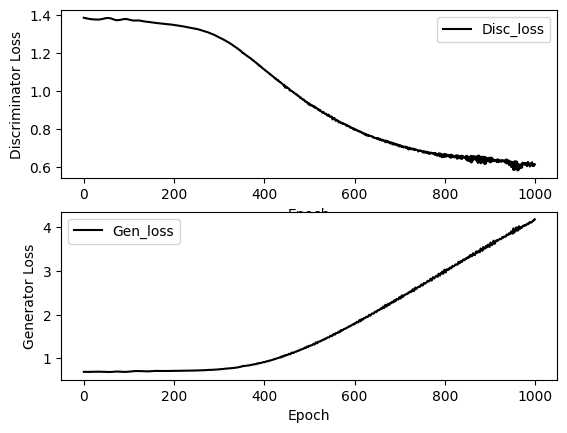

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 406ms/step
Test MSE: 78.98418420698091
Test MAE: 6.7240817180117185
Test RMSE: 8.887304664912806
Test R2 Score: 0.5331506094023801
Test Adjusted R2 Score: 0.5234245804315965
Test Accuracy: 97.64901427859482 %


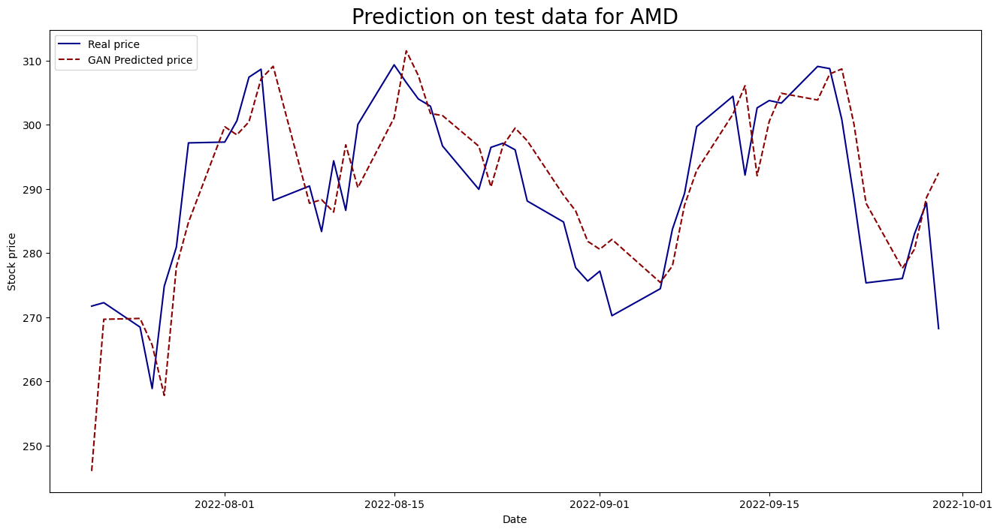

In [87]:
# univarient GAN with lstm+cnn
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Conv1D, LeakyReLU, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tqdm import tqdm
from pickle import dump, load
import random

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

# Create directory for saving models if it doesn't exist
model_dir = './models_gan'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Load and prepare the dataset
df = pd.read_csv('/content/merged_dataset_with_fill.csv', dayfirst=True)
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.set_index(pd.DatetimeIndex(df['Date'].values), inplace=True)
df = df.sort_values(by='Date')

# Filter for AMD stock data
df_amd = df[df['Stock Name'] == 'TSLA']

# Keep only the necessary column
df_amd = df_amd[['Adj Close']]

# Normalize data
def normalize_data(df, feature_range):
    scaler = MinMaxScaler(feature_range=feature_range)
    scaled_data = scaler.fit_transform(df)
    dump(scaler, open('scaler.pkl', 'wb'))
    return scaled_data

# Normalize the dataset
scaled_data = normalize_data(df_amd, (-1, 1))

# Batch data
def batch_data(data, batch_size, predict_period):
    X_batched, y_batched = [], []
    for i in range(len(data) - batch_size - predict_period + 1):
        x_value = data[i: i + batch_size]
        y_value = data[i + batch_size: i + batch_size + predict_period]
        if len(x_value) == batch_size and len(y_value) == predict_period:
            X_batched.append(x_value)
            y_batched.append(y_value)
    return np.array(X_batched), np.array(y_batched)

# Create batched data
batch_size = 5
predict_period = 1
X_batched, y_batched = batch_data(scaled_data, batch_size, predict_period)

# Split data into training and testing sets
def split_train_test(data):
    train_size = int(len(data) * 0.8)
    data_train = data[:train_size]
    data_test = data[train_size:]
    return data_train, data_test

X_train, X_test = split_train_test(X_batched)
y_train, y_test = split_train_test(y_batched)

# Ensure yc_train and yc_test are aligned with X_train and X_test
yc_train, yc_test = split_train_test(y_batched)

# Build the generator model using LSTM
def make_generator_model(input_dim, output_dim, feature_size):
    model = Sequential([
        Input(shape=(input_dim, feature_size)),
        LSTM(64, return_sequences=True),
        LSTM(32, return_sequences=False),
        Dense(10),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build the discriminator model using CNN
def make_discriminator_model(input_dim):
    cnn_net = Sequential([
        Input(shape=(input_dim + 1, 1)),
        Conv1D(8, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(16, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Conv1D(32, kernel_size=3, strides=2, padding='same', activation=LeakyReLU(negative_slope=0.01)),
        Dense(1, activation='sigmoid')
    ])
    return cnn_net

input_dim = X_train.shape[1]
feature_size = X_train.shape[2]
output_dim = y_train.shape[1]

generator = make_generator_model(input_dim, output_dim, feature_size)
discriminator = make_discriminator_model(input_dim)

# Define loss functions
def discriminator_loss(real_output, fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    real_loss = loss_f(tf.ones_like(real_output), real_output)
    fake_loss = loss_f(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    loss_f = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    loss = loss_f(tf.ones_like(fake_output), fake_output)
    return loss

# Training step
@tf.function
def train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_data = generator(real_x, training=True)
        generated_data_reshape = tf.reshape(generated_data, [generated_data.shape[0], generated_data.shape[1], 1])

        # Adjust yc dimensions to match generated_data_reshape for concatenation
        yc_reshape = yc[:, :generated_data_reshape.shape[1], :]

        d_fake_input = tf.concat([tf.cast(generated_data_reshape, tf.float64), yc_reshape], axis=1)
        real_y_reshape = tf.reshape(real_y, [real_y.shape[0], real_y.shape[1], 1])
        d_real_input = tf.concat([real_y_reshape, yc_reshape], axis=1)
        real_output = discriminator(d_real_input, training=True)
        fake_output = discriminator(d_fake_input, training=True)
        g_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    g_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    d_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return real_y, generated_data, {'d_loss': disc_loss, 'g_loss': g_loss}

# Train the GAN
def train(real_x, real_y, yc, Epochs, generator, discriminator, g_optimizer, d_optimizer, checkpoint=50):
    train_info = {"discriminator_loss": [], "generator_loss": []}
    for epoch in tqdm(range(Epochs)):
        real_price, fake_price, loss = train_step(real_x, real_y, yc, generator, discriminator, g_optimizer, d_optimizer)
        train_info["discriminator_loss"].append(loss['d_loss'].numpy())
        train_info["generator_loss"].append(loss['g_loss'].numpy())
        if (epoch + 1) % checkpoint == 0:
            generator.save(f'./models_gan/generator_V_{epoch}.keras')
            discriminator.save(f'./models_gan/discriminator_V_{epoch}.keras')
            print('Epoch', epoch + 1, 'Discriminator Loss', loss['d_loss'].numpy(), 'Generator Loss', loss['g_loss'].numpy())
    plt.subplot(2, 1, 1)
    plt.plot(train_info["discriminator_loss"], label='Disc_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Discriminator Loss')
    plt.legend()
    plt.subplot(2, 1, 2)
    plt.plot(train_info["generator_loss"], label='Gen_loss', color='#000000')
    plt.xlabel('Epoch')
    plt.ylabel('Generator Loss')
    plt.legend()
    plt.show()
    return train_info

# Define the optimizers
g_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)
d_optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

# Train the model
epochs = 1000
train_info = train(X_train, y_train, yc_train, epochs, generator, discriminator, g_optimizer, d_optimizer)

# Save the model plot
plot_model(generator, to_file='generator_keras_model.png', show_shapes=True)
plot_model(discriminator, to_file='discriminator_keras_model.png', show_shapes=True)

# Evaluate on test data
# Load the last saved model without loading optimizer state
test_generator = tf.keras.models.load_model(f'./models_gan/generator_V_{epochs-1}.keras', compile=False)
test_generator.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Predict test data
predicted_test_data = test_generator.predict(X_test)

# Reshape the data to 2D for inverse transform
y_test_reshaped = y_test.reshape(-1, y_test.shape[-1])
predicted_test_data_reshaped = predicted_test_data.reshape(-1, predicted_test_data.shape[-1])

# Inverse transform the data for comparison
scaler = load(open('scaler.pkl', 'rb'))
y_test_inverse = scaler.inverse_transform(y_test_reshaped)
predicted_test_data_inverse = scaler.inverse_transform(predicted_test_data_reshaped)

# Reshape the data back to original shape
y_test_inverse = y_test_inverse.reshape(y_test.shape)
predicted_test_data_inverse = predicted_test_data_inverse.reshape(predicted_test_data.shape)

# Calculate and print metrics
def calculate_metrics(y_true, y_pred):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = 1  # For univariate analysis
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    accuracy = 100 - (np.mean(np.abs((y_true - y_pred) / y_true)) * 100)
    return mse, mae, rmse, r2, adjusted_r2, accuracy

mse_test, mae_test, rmse_test, r2_test, adjusted_r2_test, accuracy_test = calculate_metrics(y_test_inverse, predicted_test_data_inverse)

print("Test MSE:", mse_test)
print("Test MAE:", mae_test)
print("Test RMSE:", rmse_test)
print("Test R2 Score:", r2_test)
print("Test Adjusted R2 Score:", adjusted_r2_test)
print("Test Accuracy:", accuracy_test, "%")

# Plot the test results
plt.figure(figsize=(16, 8))
dates = df_amd.index[-len(y_test_inverse):]
plt.plot(dates, y_test_inverse.flatten(), color='#00008B')
plt.plot(dates, predicted_test_data_inverse.flatten(), color='#8B0000', linestyle='--')
plt.xlabel("Date")
plt.ylabel("Stock price")
plt.legend(("Real price", "GAN Predicted price"), loc="upper left", fontsize=10)
plt.title("Prediction on test data for AMD", fontsize=20)
plt.show()


In [88]:
# Extract the first forecasted value from the predictions
first_forecasted_value = predicted_test_data_inverse.flatten()[0]
print(f"First Forecasted Value: {first_forecasted_value:.2f}")

# Create a DataFrame to compare actual and predicted values on the test set
comparison_df = pd.DataFrame({
    'Date': df_tsla.index[-len(predicted_test_data_inverse.flatten()):],  # Corresponding dates from the test set
    'Actual': y_test_inverse.flatten(),  # Actual values
    'Predicted': predicted_test_data_inverse.flatten()  # Predicted values
})

# Display the comparison table
print("\nComparison of Actual vs Predicted Values from Test Set:")
print(comparison_df.head(50))  # Display the first 10 rows of the comparison

First Forecasted Value: 246.00

Comparison of Actual vs Predicted Values from Test Set:
         Date      Actual   Predicted
0  2022-07-21  271.706665  246.003067
1  2022-07-22  272.243347  269.652618
2  2022-07-25  268.433319  269.787537
3  2022-07-26  258.859985  265.648743
4  2022-07-27  274.820007  257.787506
5  2022-07-28  280.899994  277.828430
6  2022-07-29  297.149994  284.772736
7  2022-08-01  297.276672  299.664917
8  2022-08-02  300.586670  298.406036
9  2022-08-03  307.396667  300.426453
10 2022-08-04  308.633331  307.136169
11 2022-08-05  288.170013  309.087982
12 2022-08-08  290.423340  287.741608
13 2022-08-09  283.333344  288.291016
14 2022-08-10  294.356659  286.362122
15 2022-08-11  286.630005  296.847931
16 2022-08-12  300.029999  290.175201
17 2022-08-15  309.320007  301.060730
18 2022-08-16  306.563324  311.502167
19 2022-08-17  303.996674  307.637085
20 2022-08-18  302.869995  301.739746
21 2022-08-19  296.666656  301.408020
22 2022-08-22  289.913330  296.626740


In [ ]:
import pandas as pd
data_plot=pd.read_csv('/content/plot_model.csv')
data_plot

,Stock_Name,Model,Adjusted_RSquare,R_Square,MAE,MSE,Accuracy,Vader_Score
0,TSLA,LSTM(1_Layer),-0.09840,-0.07350,10.050,140.370,96.54%,NO
1,TSLA,LSTM(2_Layer),-0.18210,-0.15520,10.530,151.060,96.40%,NO
2,TSLA,BiLSTM(1_Layer),0.01487,0.03726,9.549,125.880,96.72%,NO
3,TSLA,LSTM(Hyper Parameter Tunning),0.39819,0.41187,6.904,76.903,97.61%,NO
4,TSLA,GRU(1_Layer),0.10162,0.12204,9.022,114.800,96.89%,NO
...,...,...,...,...,...,...,...,...
124,AMD,LSTM(Hyper Parameter Tunning)+Vader,0.82248,0.83055,4.012,22.738,95.07%,Yes
125,AMD,GRU(1_Layer)+vader,0.17378,0.21133,8.246,105.830,89.65%,Yes
126,AMD,GRU(2_Layer)+vader,0.09416,0.13534,9.502,116.030,88.14%,Yes
127,AMD,BiGRU(1_Layer)+vader,-0.99290,-0.90230,14.650,255.280,81.82%,Yes


In [ ]:
best_models = data_plot.loc[data_plot.groupby('Stock_Name')['Accuracy'].idxmax()]

# Display the best models
print(best_models)

    Stock_Name                               Model  Adjusted_RSquare  \
39       AAPL         GRU(Hyper Parameter Tunning)           0.83290   
128        AMD  GRU(Hyper Parameter Tunning)+vader           0.90589   
102         BA                        GRU(2_Layer)          -0.63400   
96        META  GRU(Hyper Parameter Tunning)+Vader           0.38663   
23         NIO        GRU(Hyper Parameter Tunning)           0.51453   
56          PG        GRU(Hyper Parameter Tunning)           0.80480   
80        PYPL  GRU(Hyper Parameter Tunning)+Vader           0.78373   
7         TSLA        GRU(Hyper Parameter Tunning)           0.47350   

     R_Square    MAE      MSE Accuracy Vader_Score  
39    0.84041  2.466   9.6407   98.45%          No  
128   0.91016  2.837  12.0540   96.61%         Yes  
102  -0.59690  3.945  24.2050   96.99%          No  
96    0.41451  7.176  70.1660   95.56%         Yes  
23    0.53659  0.738   0.9749   96.13%          No  
56    0.81367  1.718   5.1626   9

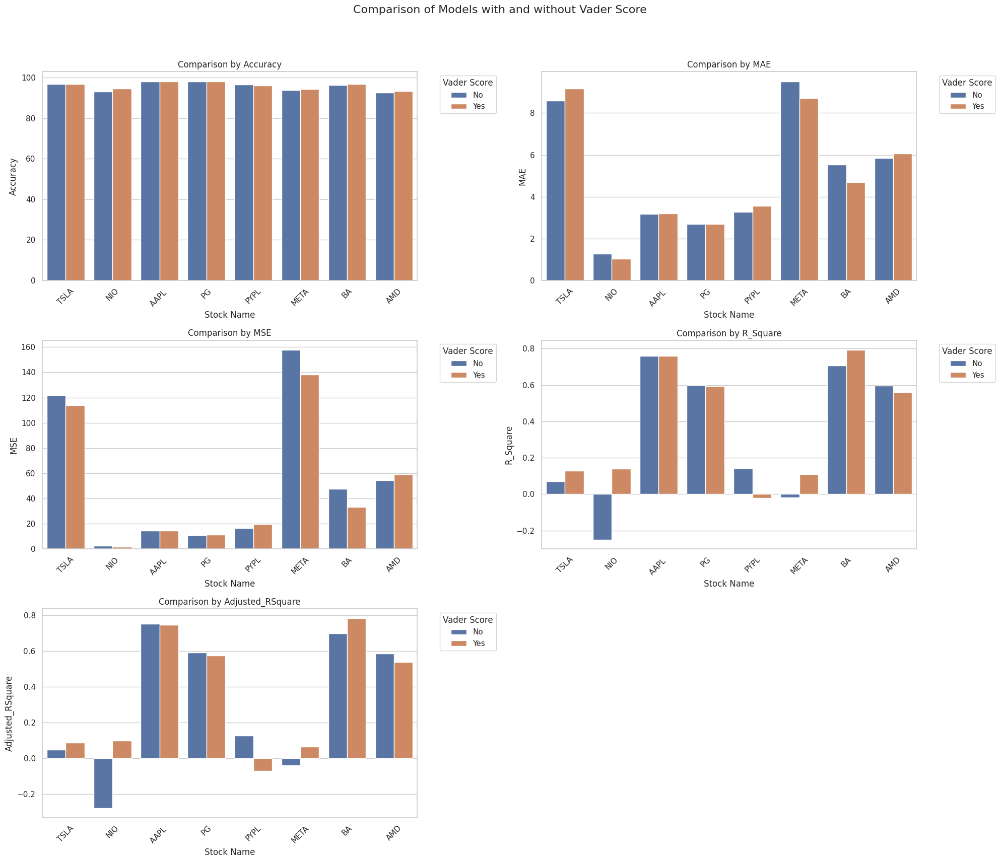

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data_plot = pd.read_csv('/content/plot_model.csv')

# Convert 'Accuracy' from percentage strings to float for comparison
data_plot['Accuracy'] = data_plot['Accuracy'].str.rstrip('%').astype('float')

# Set the style for seaborn
sns.set(style="whitegrid")

# Define the list of metrics you want to compare
metrics = ['Accuracy', 'MAE', 'MSE', 'R_Square', 'Adjusted_RSquare']

# Create a subplot for each metric
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 18))
fig.suptitle('Comparison of Models with and without Vader Score', fontsize=16)

# Flatten axes array for easy indexing
axes = axes.flatten()

for i, metric in enumerate(metrics):
    # Plot each metric with side-by-side bars for Vader Score (Yes/No)
    sns.barplot(x='Stock_Name', y=metric, hue='Vader_Score', data=data_plot, ax=axes[i], errorbar=None)
    axes[i].set_title(f'Comparison by {metric}')
    axes[i].set_ylabel(metric)
    axes[i].set_xlabel('Stock Name')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].legend(title='Vader Score', bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove the last empty subplot if the number of metrics is less than the number of subplots
if len(metrics) < len(axes):
    fig.delaxes(axes[-1])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

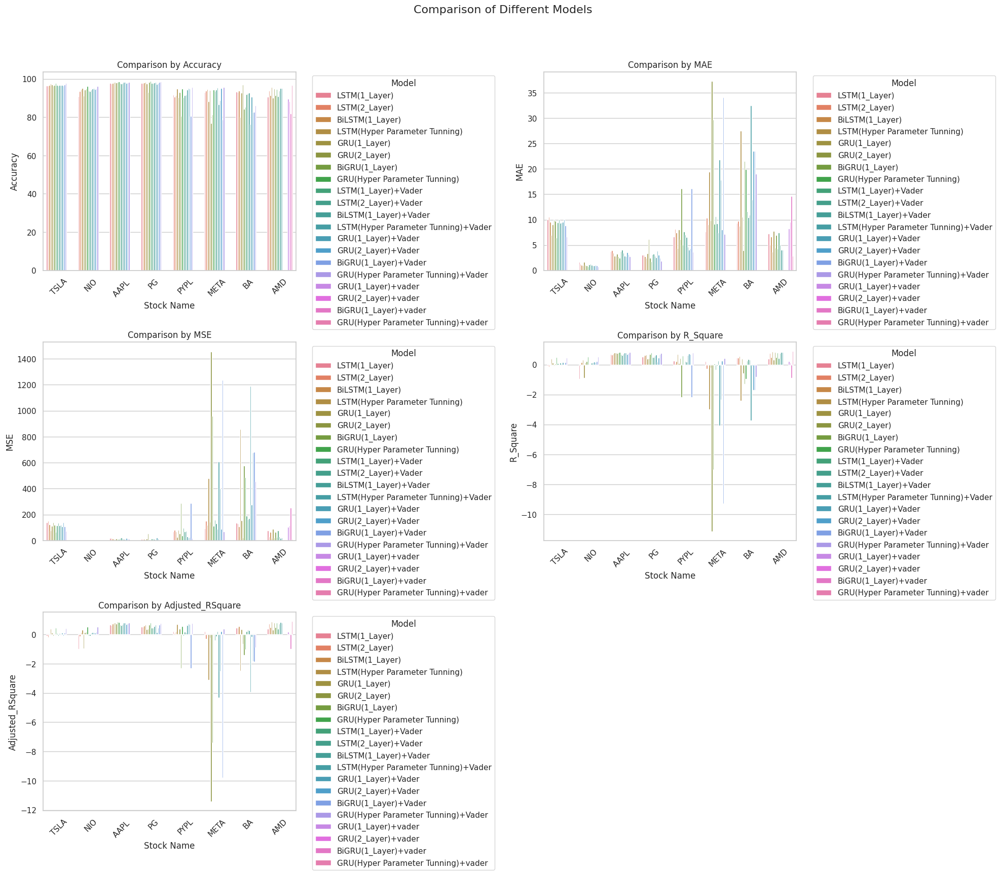

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data_plot = pd.read_csv('/content/plot_model.csv')

# Convert 'Accuracy' from percentage strings to float for comparison
data_plot['Accuracy'] = data_plot['Accuracy'].str.rstrip('%').astype('float')

# Set the style for seaborn
sns.set(style="whitegrid")

# Define the list of metrics you want to compare
metrics = ['Accuracy', 'MAE', 'MSE', 'R_Square', 'Adjusted_RSquare']

# Create a subplot for each metric
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 18))
fig.suptitle('Comparison of Different Models', fontsize=16)

# Flatten axes array for easy indexing
axes = axes.flatten()

for i, metric in enumerate(metrics):
    # Plot each metric with side-by-side bars for each model
    sns.barplot(x='Stock_Name', y=metric, hue='Model', data=data_plot, ax=axes[i], errorbar=None)
    axes[i].set_title(f'Comparison by {metric}')
    axes[i].set_ylabel(metric)
    axes[i].set_xlabel('Stock Name')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove the last empty subplot if the number of metrics is less than the number of subplots
if len(metrics) < len(axes):
    fig.delaxes(axes[-1])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

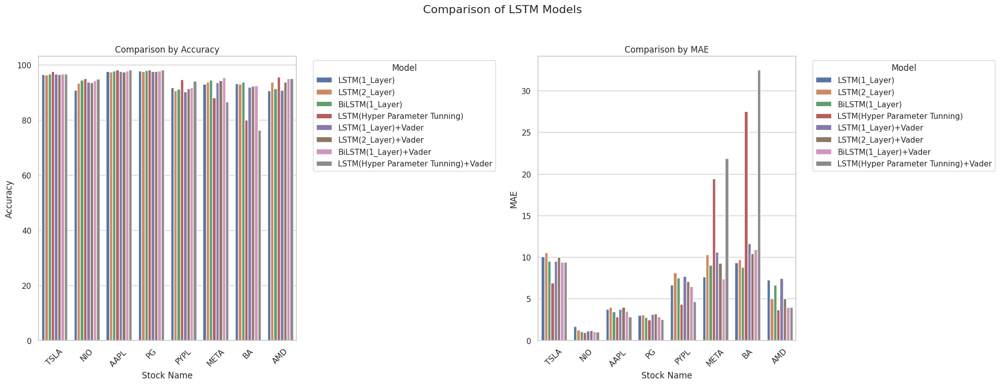

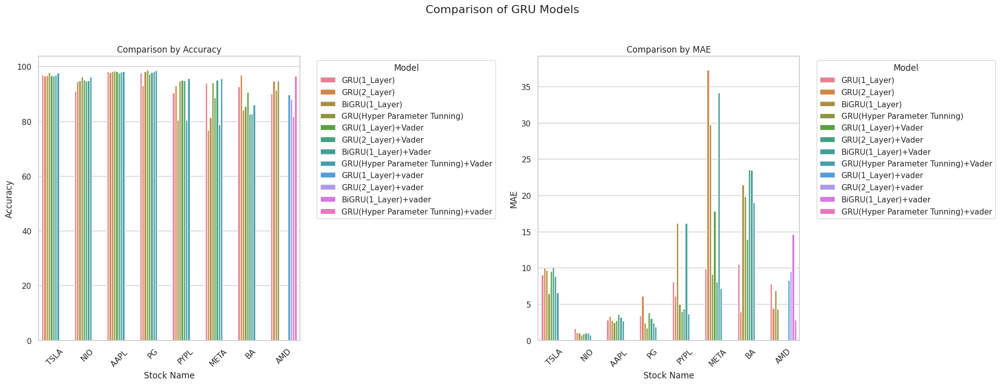

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data_plot = pd.read_csv('/content/plot_model.csv')

# Convert 'Accuracy' from percentage strings to float for comparison
data_plot['Accuracy'] = data_plot['Accuracy'].str.rstrip('%').astype('float')

# Handle any NaN values in the 'Model' column
data_plot['Model'] = data_plot['Model'].fillna('')

# Set the style for seaborn
sns.set(style="whitegrid")

# Focus on key metrics
metrics = ['Accuracy', 'MAE']

# Create separate plots for LSTM models and GRU models
for model_type in ['LSTM', 'GRU']:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
    fig.suptitle(f'Comparison of {model_type} Models', fontsize=16)

    # Filter data for the specific model type
    filtered_data = data_plot[data_plot['Model'].str.contains(model_type)]

    for i, metric in enumerate(metrics):
        sns.barplot(x='Stock_Name', y=metric, hue='Model', data=filtered_data, ax=axes[i], errorbar=None)
        axes[i].set_title(f'Comparison by {metric}')
        axes[i].set_ylabel(metric)
        axes[i].set_xlabel('Stock Name')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

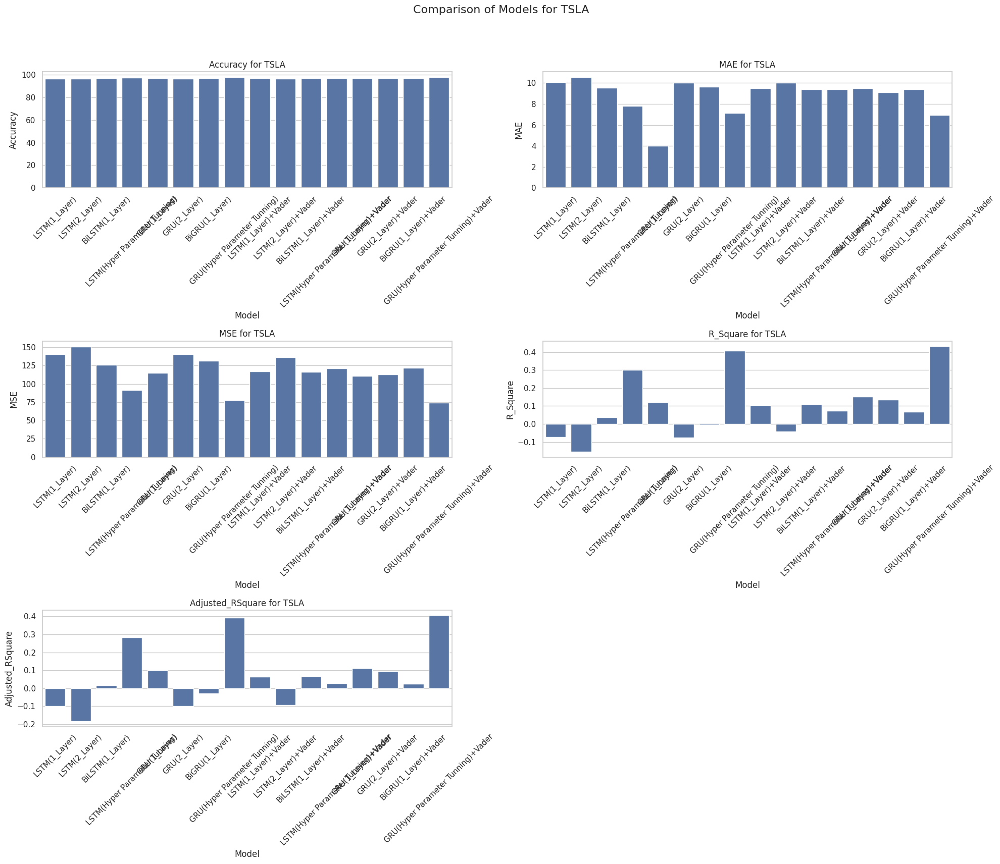

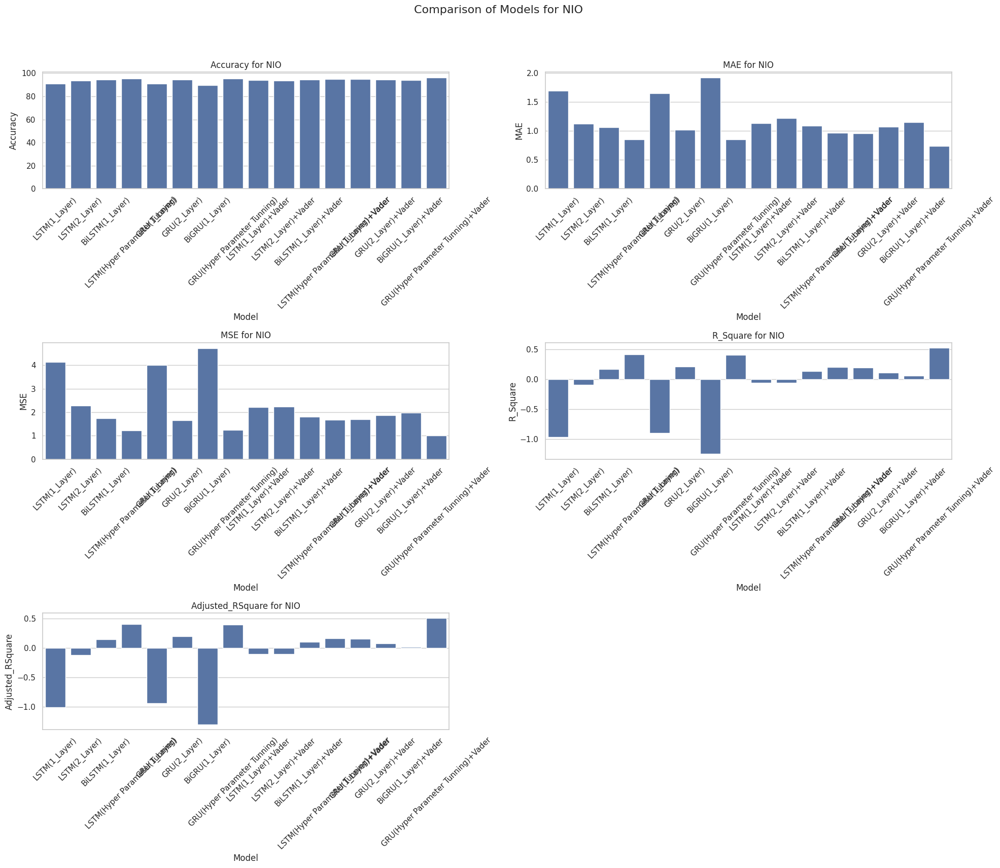

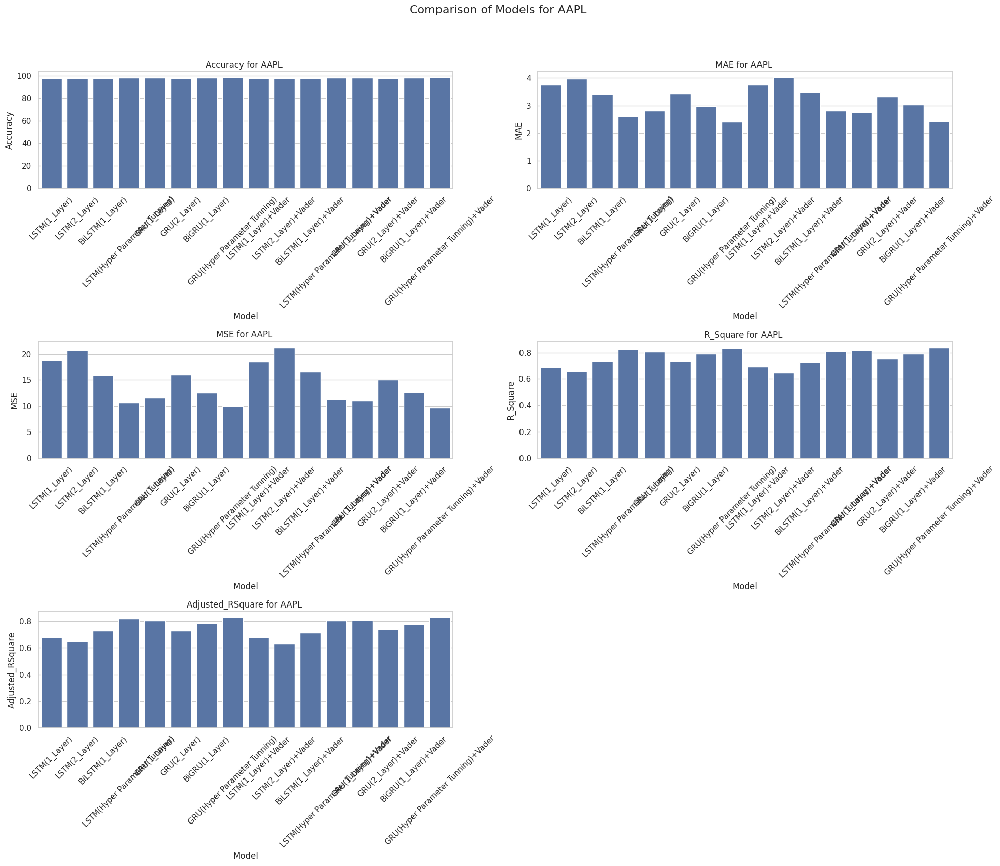

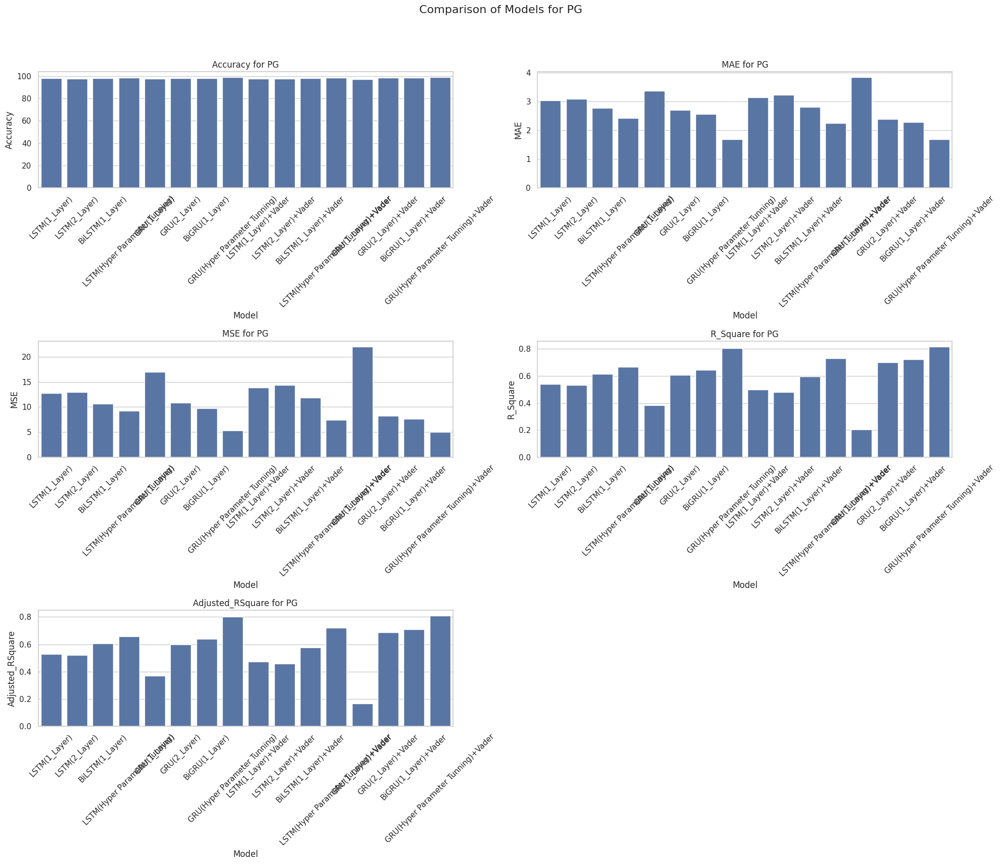

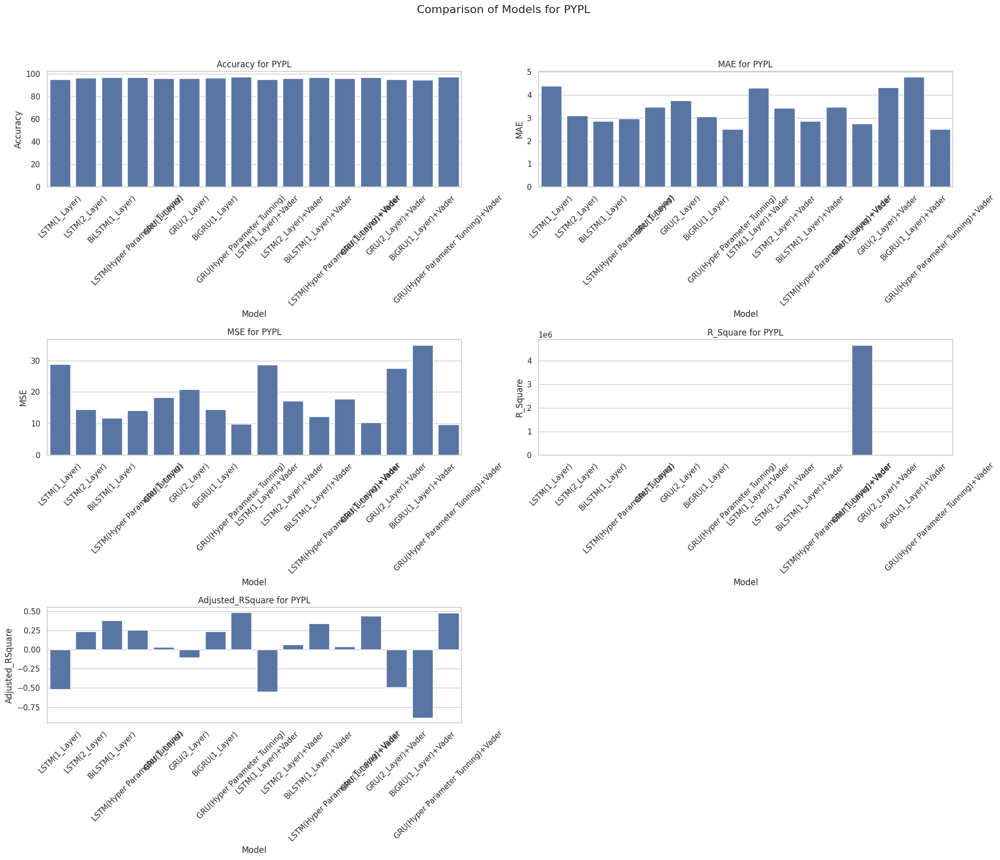

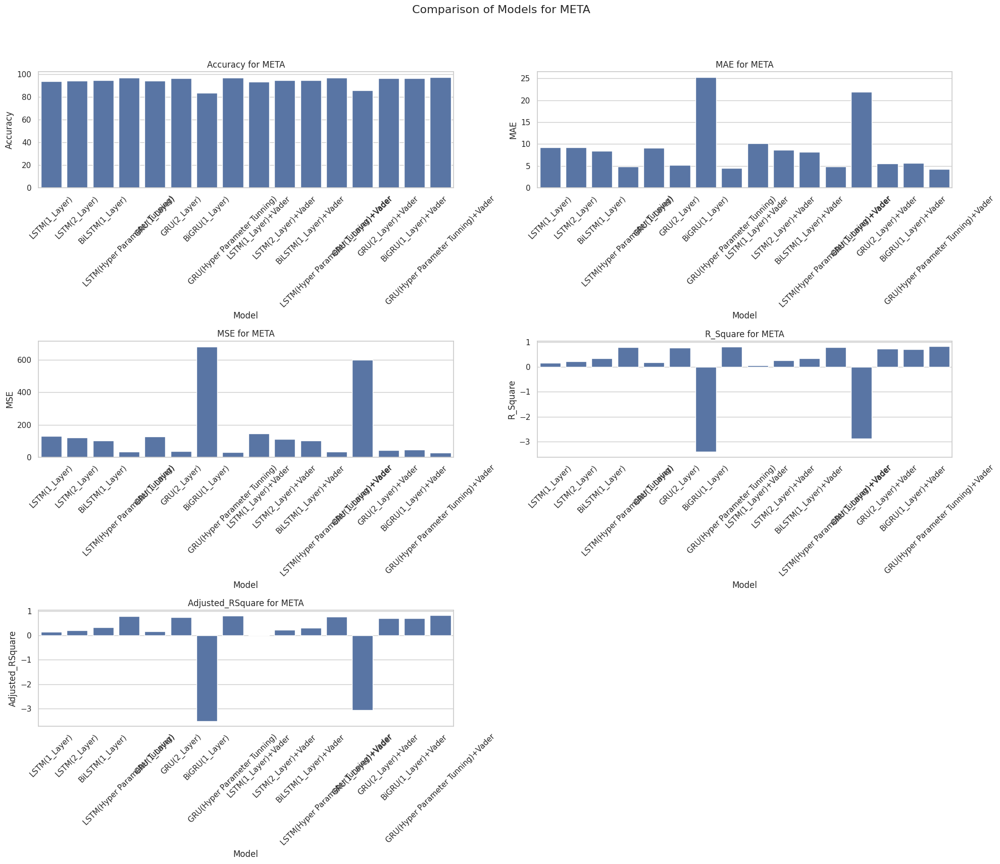

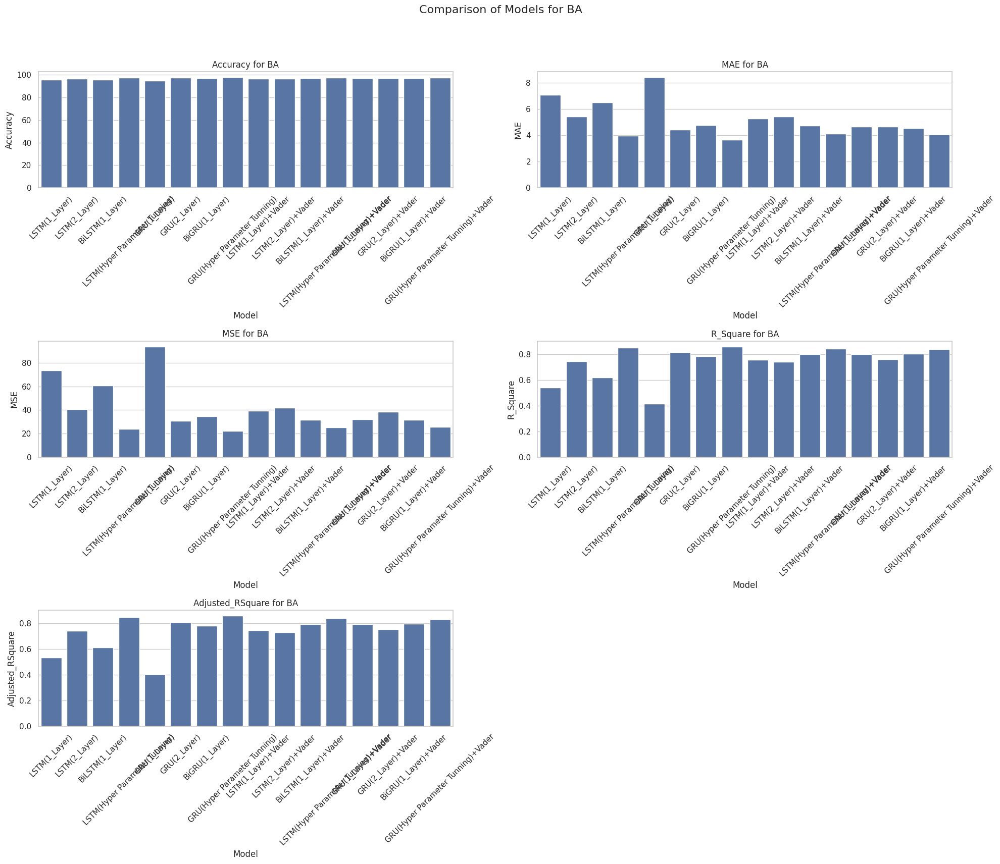

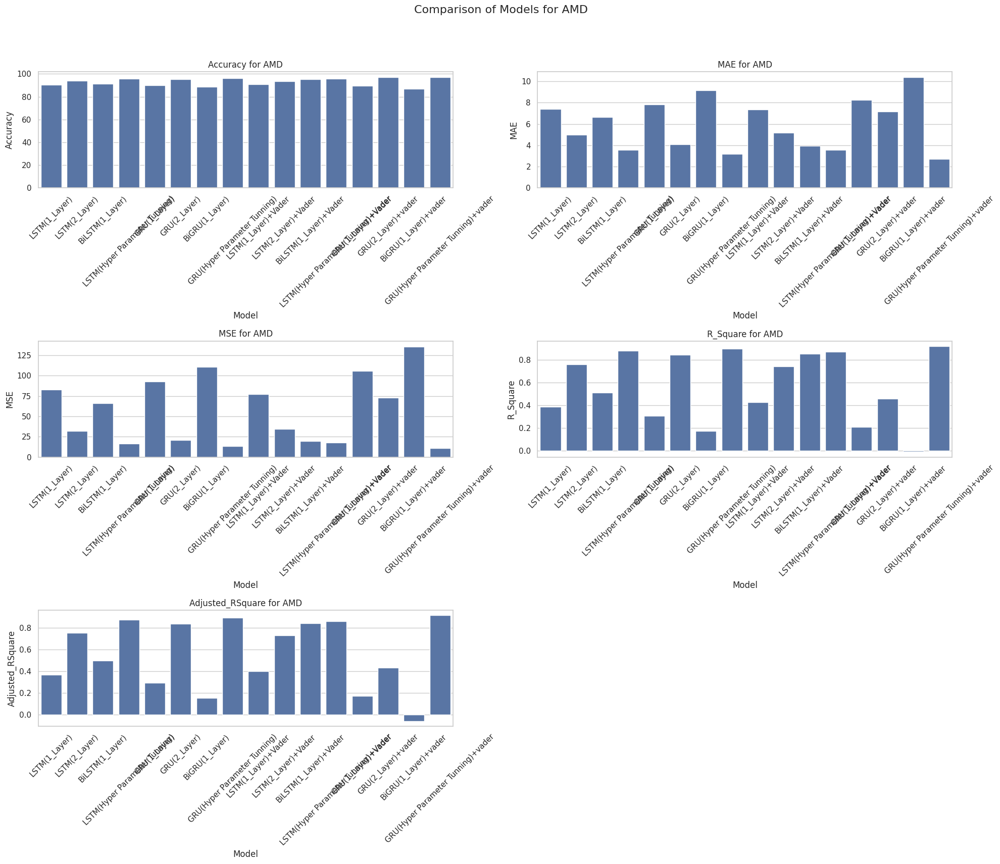

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data_plot = pd.read_csv('/content/plot_model.csv')

# Convert 'Accuracy' from percentage strings to float for comparison
data_plot['Accuracy'] = data_plot['Accuracy'].str.rstrip('%').astype('float')

# Handle any NaN values in the 'Model' column
data_plot['Model'] = data_plot['Model'].fillna('')

# Set the style for seaborn
sns.set(style="whitegrid")

# Define the list of stocks
stocks = data_plot['Stock_Name'].unique()

# Define the list of metrics to compare
metrics = ['Accuracy', 'MAE', 'MSE', 'R_Square', 'Adjusted_RSquare']

# Create separate plots for each stock
for stock in stocks:
    # Filter the data for the specific stock
    stock_data = data_plot[data_plot['Stock_Name'] == stock]

    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 18))
    fig.suptitle(f'Comparison of Models for {stock}', fontsize=16)

    # Flatten axes array for easy indexing
    axes = axes.flatten()

    for i, metric in enumerate(metrics):
        sns.barplot(x='Model', y=metric, data=stock_data, ax=axes[i], errorbar=None)
        axes[i].set_title(f'{metric} for {stock}')
        axes[i].set_ylabel(metric)
        axes[i].set_xlabel('Model')
        axes[i].tick_params(axis='x', rotation=45)

    # Remove the last empty subplot if necessary
    if len(metrics) < len(axes):
        fig.delaxes(axes[-1])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [ ]:
import pandas as pd

# Load the dataset
data_plot = pd.read_csv('/content/plot_model.csv')

# Convert 'Accuracy' from percentage strings to float for comparison
data_plot['Accuracy'] = data_plot['Accuracy'].str.rstrip('%').astype('float')

# Replace any NaN values in the metrics with appropriate defaults
data_plot['Accuracy'] = data_plot['Accuracy'].fillna(0)
data_plot['MAE'] = data_plot['MAE'].fillna(float('inf'))
data_plot['MSE'] = data_plot['MSE'].fillna(float('inf'))
data_plot['R_Square'] = data_plot['R_Square'].fillna(float('-inf'))
data_plot['Adjusted_RSquare'] = data_plot['Adjusted_RSquare'].fillna(float('-inf'))

# Initialize a list to hold the results
summary_data = []

# Define the list of metrics to compare
metrics = ['Accuracy', 'MAE', 'MSE', 'R_Square', 'Adjusted_RSquare']

# Loop through each stock
for stock in data_plot['Stock_Name'].unique():
    stock_data = data_plot[data_plot['Stock_Name'] == stock]

    if not stock_data.empty:
        # Find the best model for each metric
        best_accuracy_model = stock_data.loc[stock_data['Accuracy'].idxmax()]['Model']
        best_mae_model = stock_data.loc[stock_data['MAE'].idxmin()]['Model']
        best_mse_model = stock_data.loc[stock_data['MSE'].idxmin()]['Model']
        best_rsquare_model = stock_data.loc[stock_data['R_Square'].idxmax()]['Model']
        best_adj_rsquare_model = stock_data.loc[stock_data['Adjusted_RSquare'].idxmax()]['Model']

        # Append the results to the summary_data list
        summary_data.append({
            'Stock_Name': stock,
            'Best_Accuracy_Model': best_accuracy_model,
            'Best_MAE_Model': best_mae_model,
            'Best_MSE_Model': best_mse_model,
            'Best_R_Square_Model': best_rsquare_model,
            'Best_Adjusted_R_Square_Model': best_adj_rsquare_model
        })

# Convert the summary data into a DataFrame
summary_df = pd.DataFrame(summary_data)

# Display the summary table
summary_df

,Stock_Name,Best_Accuracy_Model,Best_MAE_Model,Best_MSE_Model,Best_R_Square_Model,Best_Adjusted_R_Square_Model
0,TSLA,GRU(Hyper Parameter Tunning)+Vader,GRU(1_Layer),GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader
1,NIO,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader
2,AAPL,GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader
3,PG,GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader
4,PYPL,GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning)+Vader,GRU(1_Layer)+Vader,GRU(Hyper Parameter Tunning)
5,META,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader,GRU(Hyper Parameter Tunning)+Vader
6,BA,GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning),GRU(Hyper Parameter Tunning)
7,AMD,GRU(2_Layer)+vader,GRU(Hyper Parameter Tunning)+vader,GRU(Hyper Parameter Tunning)+vader,GRU(Hyper Parameter Tunning)+vader,GRU(Hyper Parameter Tunning)+vader


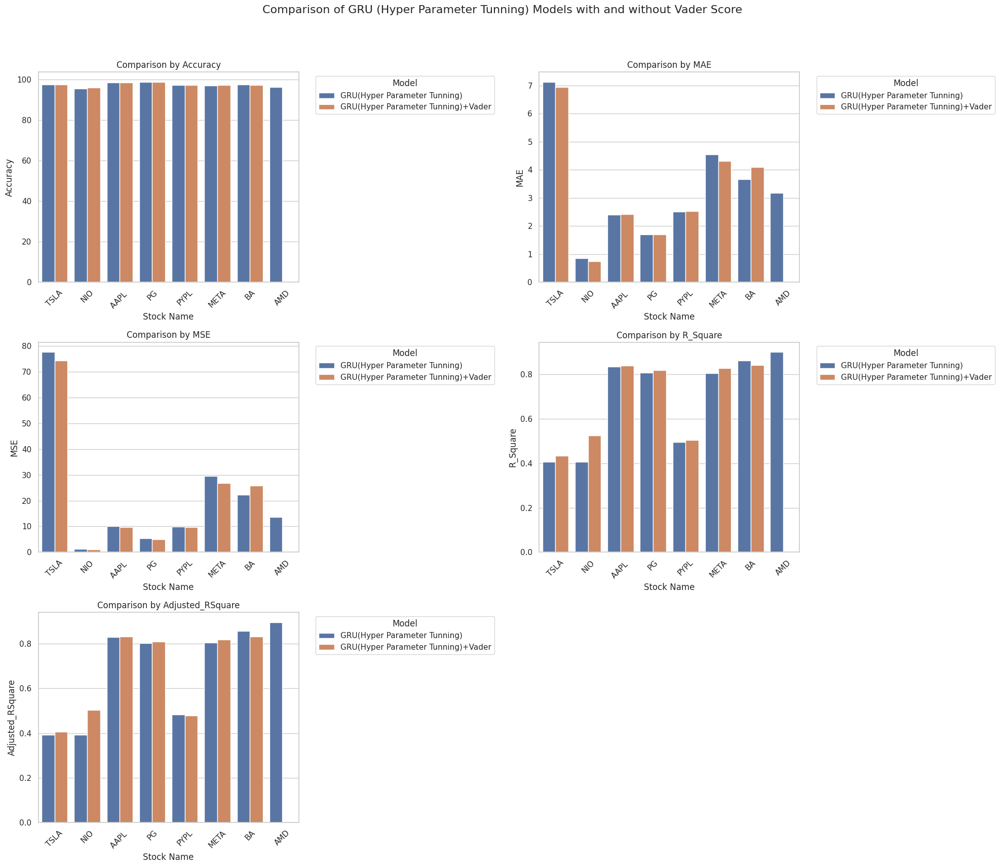

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data_plot = pd.read_csv('/content/plot_model.csv')

# Filter the dataset to include only the two models
models_to_compare = ['GRU(Hyper Parameter Tunning)', 'GRU(Hyper Parameter Tunning)+Vader']
filtered_data = data_plot[data_plot['Model'].isin(models_to_compare)].copy()

# Convert 'Accuracy' from percentage strings to float for comparison using .loc to avoid the SettingWithCopyWarning
filtered_data.loc[:, 'Accuracy'] = filtered_data['Accuracy'].str.rstrip('%').astype('float')

# Set the style for seaborn
sns.set(style="whitegrid")

# Define the list of metrics you want to compare
metrics = ['Accuracy', 'MAE', 'MSE', 'R_Square', 'Adjusted_RSquare']

# Create a subplot for each metric
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 18))
fig.suptitle('Comparison of GRU (Hyper Parameter Tunning) Models with and without Vader Score', fontsize=16)

# Flatten axes array for easy indexing
axes = axes.flatten()

for i, metric in enumerate(metrics):
    # Plot each metric with side-by-side bars for the two models
    sns.barplot(x='Stock_Name', y=metric, hue='Model', data=filtered_data, ax=axes[i], errorbar=None)
    axes[i].set_title(f'Comparison by {metric}')
    axes[i].set_ylabel(metric)
    axes[i].set_xlabel('Stock Name')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove the last empty subplot if the number of metrics is less than the number of subplots
if len(metrics) < len(axes):
    fig.delaxes(axes[-1])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [11]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader
import yfinance as yf

# For time stamps
from datetime import datetime

In [12]:
import pandas as pd

# Load the merged dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')

# Convert 'Date' column to datetime and sort by Date
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data.sort_values(by='Date')

# The tech stocks we'll use for this analysis
tech_list = ['META','AAPL','TSLA','PYPL','BA','NIO','PG','AMD']

# Filter the dataset for the selected tech stocks
filtered_data = data[data['Stock Name'].isin(tech_list)]

# Set company names for each stock for easy reference
company_names = {
    'META': "Meta",
    'AAPL': "Apple",
    'TSLA': "Tesla",
    'PYPL': "PayPal",
    'BA': "Boeing",
    'NIO': "NIO",
    'PG': "Procter & Gamble",
    'AMD': "AMD"
}
filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)

# Display the first few entries and a summary of the dataset
print(filtered_data.head())
print(filtered_data.describe(include='all'))

# Optionally, create separate dataframes for each stock if needed for individual analysis
for stock in tech_list:
    globals()[stock] = filtered_data[filtered_data['Stock Name'] == stock]
    print(f"Data for {stock}:")
    print(globals()[stock].head())

<ipython-input-12-22595470a043>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Company_Name'] = filtered_data['Stock Name'].map(company_names)


           Date        Open        High         Low       Close   Adj Close  \
0    2021-09-30  260.333344  263.043335  258.333344  258.493347  258.493347   
4284 2021-09-30  226.080002  226.149994  219.460007  219.940002  219.940002   
1764 2021-09-30  143.660004  144.380005  141.279999  141.500000  140.478485   
1512 2021-09-30  102.080002  104.440002  101.989998  102.900002  102.900002   
504  2021-09-30  142.639999  142.740005  139.529999  139.800003  135.573044   

        Volume Stock Name  Tweet_Count  Total_Score_Vader  \
0     53868000       TSLA           90            15.4504   
4284  10366900         BA            0             0.0000   
1764  89056700       AAPL            7             0.5054   
1512  57636700        AMD            6             2.1210   
504    6934900         PG            5             1.2850   

      Total_Class_Vader_Mapped class_vader  class_vader_mapped  \
0                           29    positive                   1   
4284                      

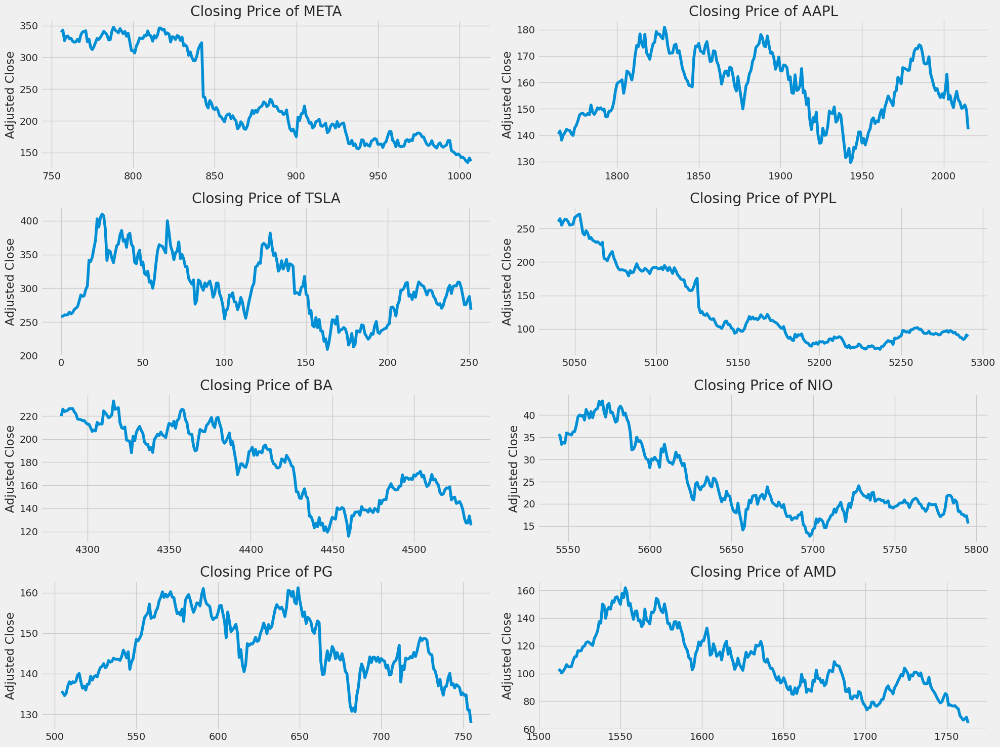

In [16]:
import matplotlib.pyplot as plt

# Assuming 'company_list' has already been defined and contains the DataFrames
company_list = [META, AAPL, TSLA, PYPL, BA, NIO, PG, AMD]
tech_list = ['META', 'AAPL', 'TSLA', 'PYPL', 'BA', 'NIO', 'PG', 'AMD']

# Set up the figure and axes for plotting
plt.figure(figsize=(20, 15))
plt.subplots_adjust(top=1.25, bottom=1.2)

# Loop through each company DataFrame and plot the 'Adj Close' on a separate subplot
for i, company in enumerate(company_list, 1):
    ax = plt.subplot(4, 2, i)  # Changed to a 4x2 grid to accommodate 8 companies
    company['Adj Close'].plot(ax=ax)
    plt.ylabel('Adjusted Close')
    plt.title(f"Closing Price of {tech_list[i - 1]}")

plt.tight_layout()
plt.show()

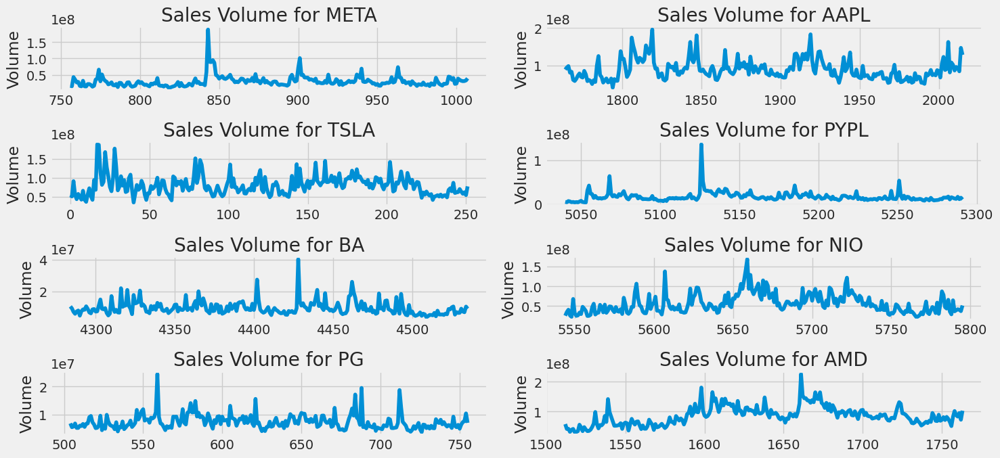

In [17]:
# Now let's plot the total volume of stock being traded each day
plt.figure(figsize=(15, 7))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    plt.subplot(4, 2, i)
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Sales Volume for {tech_list[i - 1]}")

plt.tight_layout()
plt.show()

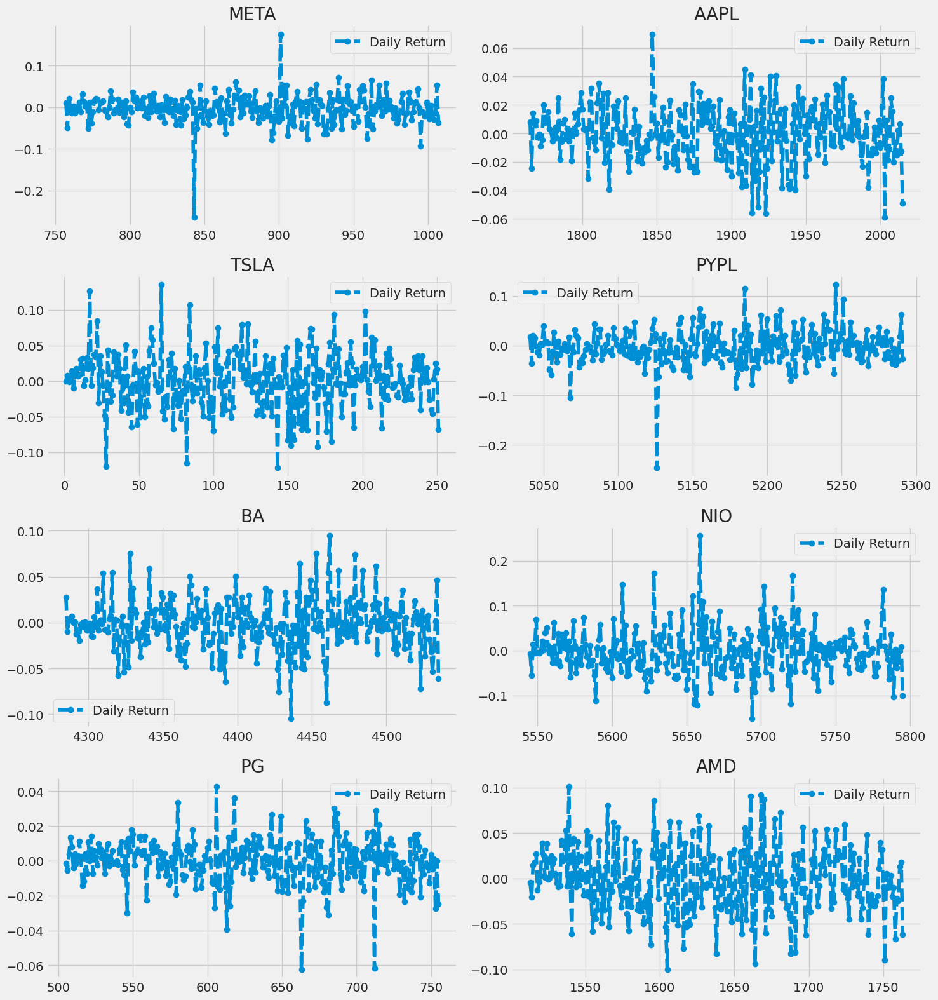

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')
tech_list = ['META', 'AAPL', 'TSLA', 'PYPL', 'BA', 'NIO', 'PG', 'AMD']

# Filter and organize the data
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data[data['Stock Name'].isin(tech_list)]
data = data.sort_values(by='Date')

# Splitting the data into separate DataFrames for each company
company_list = {name: data[data['Stock Name'] == name].copy() for name in tech_list}

# Calculate the daily returns
for name, company in company_list.items():
    company['Daily Return'] = company['Adj Close'].pct_change()
    company_list[name] = company  # Update the dictionary with the modified DataFrame

# Set up the figure and axes for plotting (4 rows and 2 columns to accommodate 8 companies)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 16))
fig.subplots_adjust(top=1.25, bottom=1.2)

# A map to relate company names to subplot indices
pos_map = {
    'META': (0, 0),
    'AAPL': (0, 1),
    'TSLA': (1, 0),
    'PYPL': (1, 1),
    'BA': (2, 0),
    'NIO': (2, 1),
    'PG': (3, 0),
    'AMD': (3, 1)
}

# Plotting each company's daily returns
for name, company in company_list.items():
    row, col = pos_map[name]
    ax = axes[row, col]
    company['Daily Return'].plot(ax=ax, legend=True, linestyle='--', marker='o')
    ax.set_title(name)

fig.tight_layout()
plt.show()

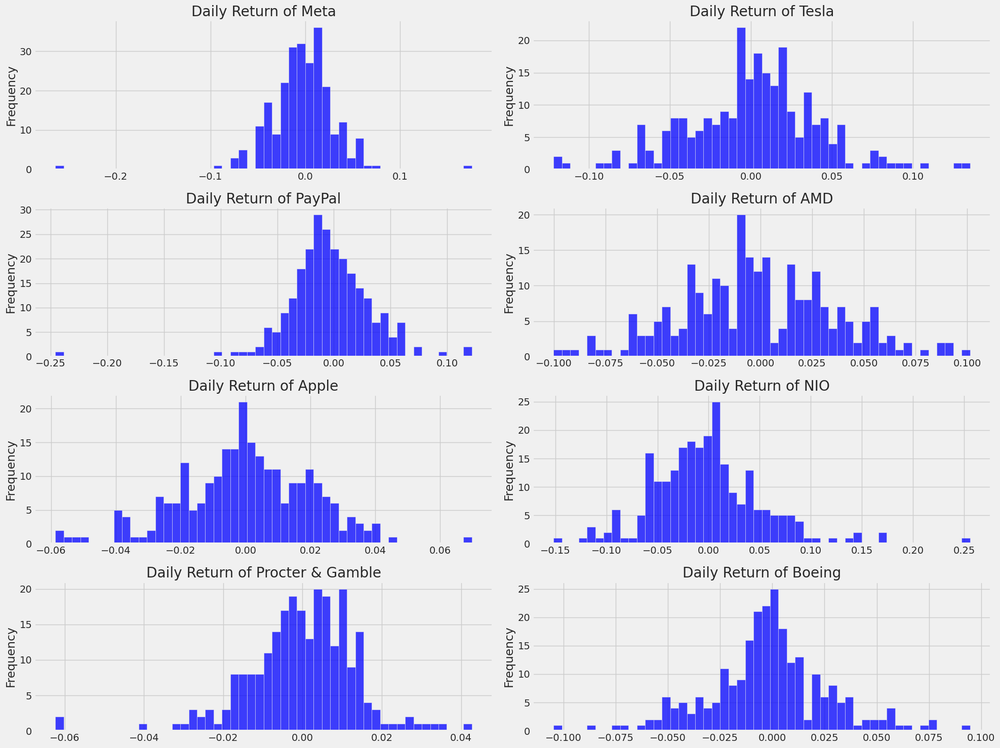

In [23]:
import matplotlib.pyplot as plt

# Assuming company_list is a dictionary where key is the stock symbol and value is the DataFrame
company_list = {
    'META': META,
    'TSLA': TSLA,
    'PYPL': PYPL,
    'AMD': AMD,
    'AAPL': AAPL,
    'NIO': NIO,
    'PG': PG,
    'BA': BA
}

# Define company names in the order of tech_list for title mapping
company_names = {
    'META': "Meta",
    'AAPL': "Apple",
    'TSLA': "Tesla",
    'PYPL': "PayPal",
    'BA': "Boeing",
    'NIO': "NIO",
    'PG': "Procter & Gamble",
    'AMD': "AMD"
}

# Calculate Daily Returns for each company using .loc[] to avoid SettingWithCopyWarning
for symbol, company in company_list.items():
    company.loc[:, 'Daily Return'] = company['Adj Close'].pct_change()

# Set up the figure for plotting
plt.figure(figsize=(20, 15))  # Adjusted size for 8 subplots

# Loop through each company and plot the histogram of daily returns
for i, (symbol, company) in enumerate(company_list.items(), start=1):
    plt.subplot(4, 2, i)
    company['Daily Return'].hist(bins=50, alpha=0.75, color='b')
    plt.ylabel('Frequency')
    plt.title(f'Daily Return of {company_names[symbol]}')

plt.tight_layout()
plt.show()

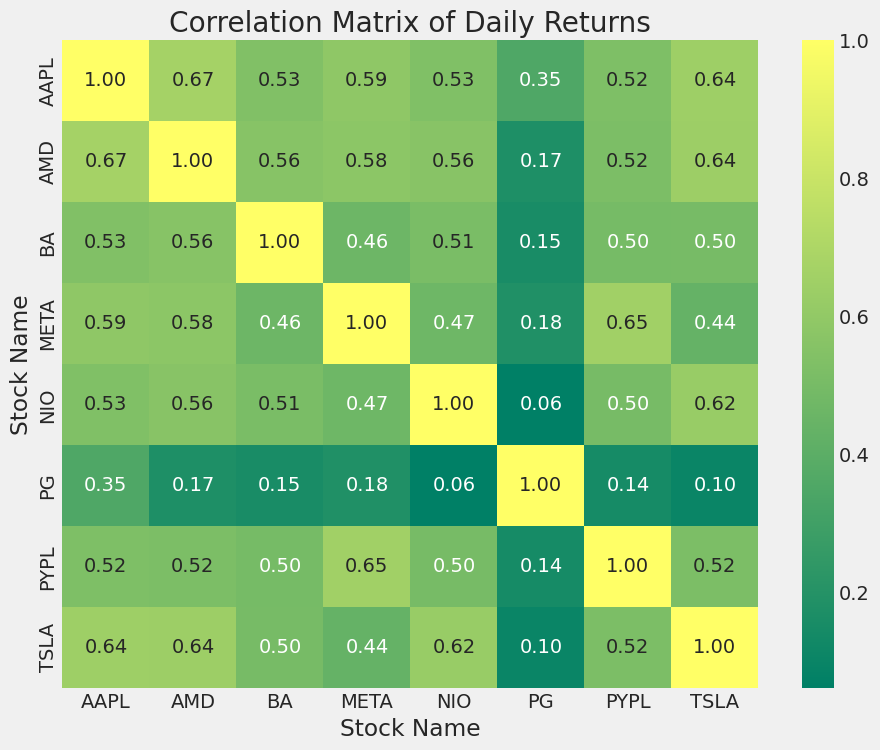

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming the data is already loaded into a DataFrame
data = pd.read_csv('/content/merged_dataset_with_fill.csv')
tech_list = ['META', 'AAPL', 'TSLA', 'PYPL', 'BA', 'NIO', 'PG', 'AMD']

# Filter and organize the data
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data[data['Stock Name'].isin(tech_list)]
data = data.sort_values(by='Date')

# Create a pivot table to have 'Stock_Name' as columns and 'Adj Close' as values
closing_df = data.pivot_table(index='Date', columns='Stock Name', values='Adj Close')

# Calculate the daily returns
tech_rets = closing_df.pct_change()

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(tech_rets.corr(), annot=True, cmap='summer', fmt=".2f")
plt.title('Correlation Matrix of Daily Returns')
plt.show()

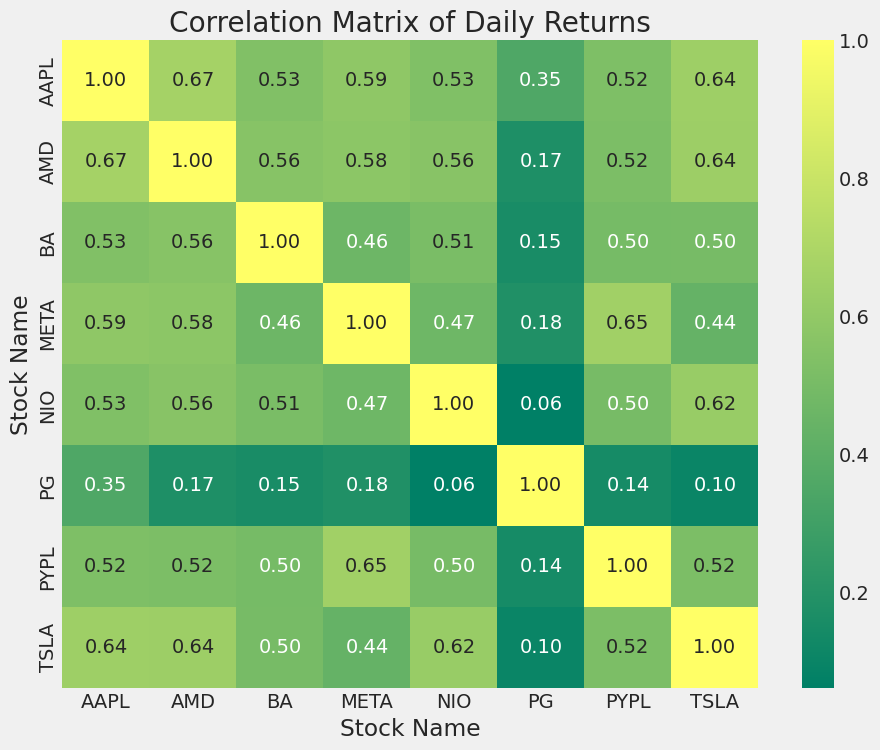

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming closing_df is already defined and loaded with adjusted close prices
# Calculate the daily returns
tech_rets = closing_df.pct_change()

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(tech_rets.corr(), annot=True, cmap='summer', fmt=".2f")
plt.title('Correlation Matrix of Daily Returns')
plt.show()

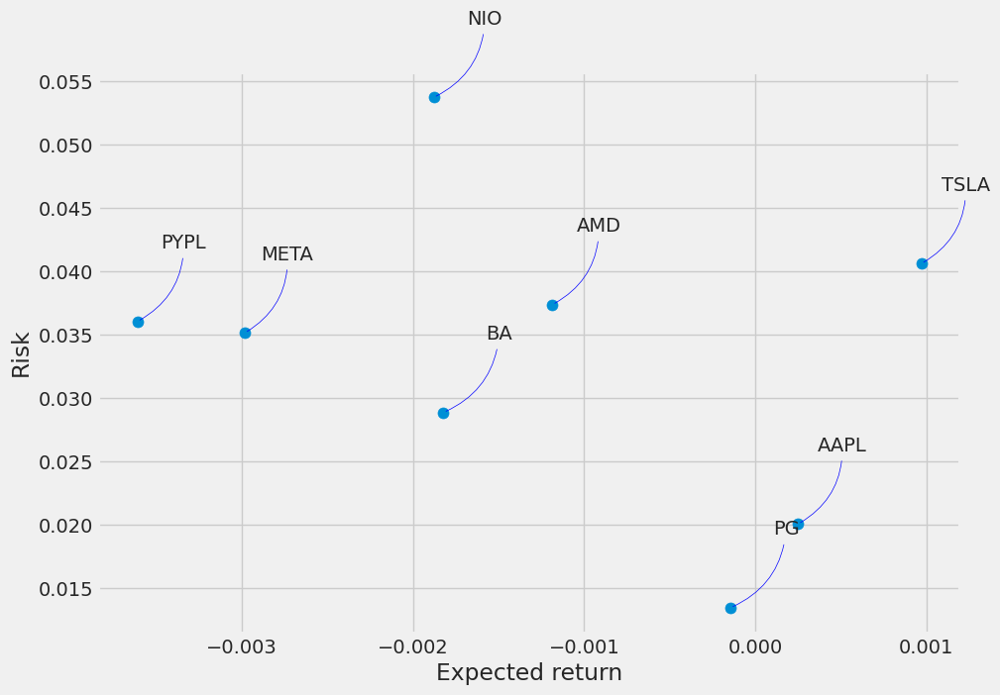

In [29]:
# Let's start by defining a new DataFrame as a cleaned version of the original tech_rets DataFrame
rets = tech_rets.dropna()

area = np.pi * 20

plt.figure(figsize=(10, 7))
plt.scatter(rets.mean(), rets.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom',
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

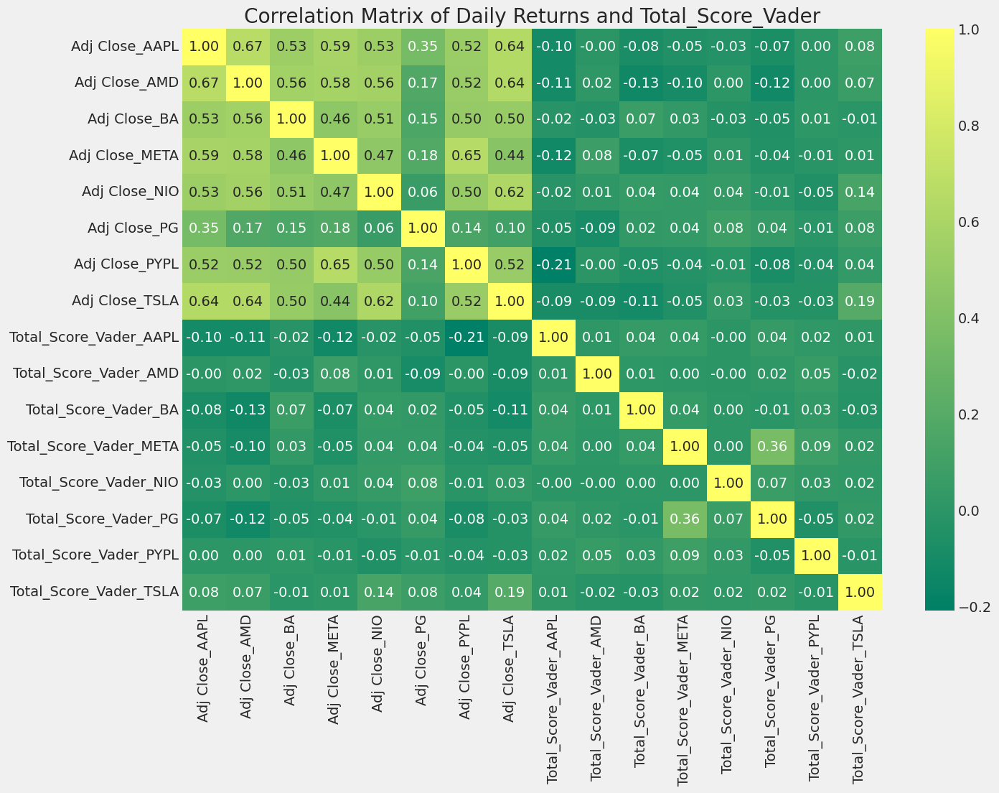

In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')
tech_list = ['META', 'AAPL', 'TSLA', 'PYPL', 'BA', 'NIO', 'PG', 'AMD']

# Filter and organize the data
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data[data['Stock Name'].isin(tech_list)]
data = data.sort_values(by='Date')

# Create pivot tables for 'Adj Close' and 'Total_Score_Vader'
closing_df = data.pivot_table(index='Date', columns='Stock Name', values='Adj Close')
vader_df = data.pivot_table(index='Date', columns='Stock Name', values='Total_Score_Vader')

# Calculate the daily returns for both 'Adj Close' and 'Total_Score_Vader'
tech_rets = closing_df.pct_change()
vader_rets = vader_df.pct_change()

# Combine the two DataFrames into one
combined_rets = pd.concat([tech_rets, vader_rets], axis=1, keys=['Adj Close', 'Total_Score_Vader'])

# Flatten the MultiIndex columns to have a single level of columns
combined_rets.columns = ['_'.join(col).strip() for col in combined_rets.columns.values]

# Plotting the correlation heatmap for the combined returns
plt.figure(figsize=(14, 10))
sns.heatmap(combined_rets.corr(), annot=True, cmap='summer', fmt=".2f")
plt.title('Correlation Matrix of Daily Returns and Total_Score_Vader')
plt.show()

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


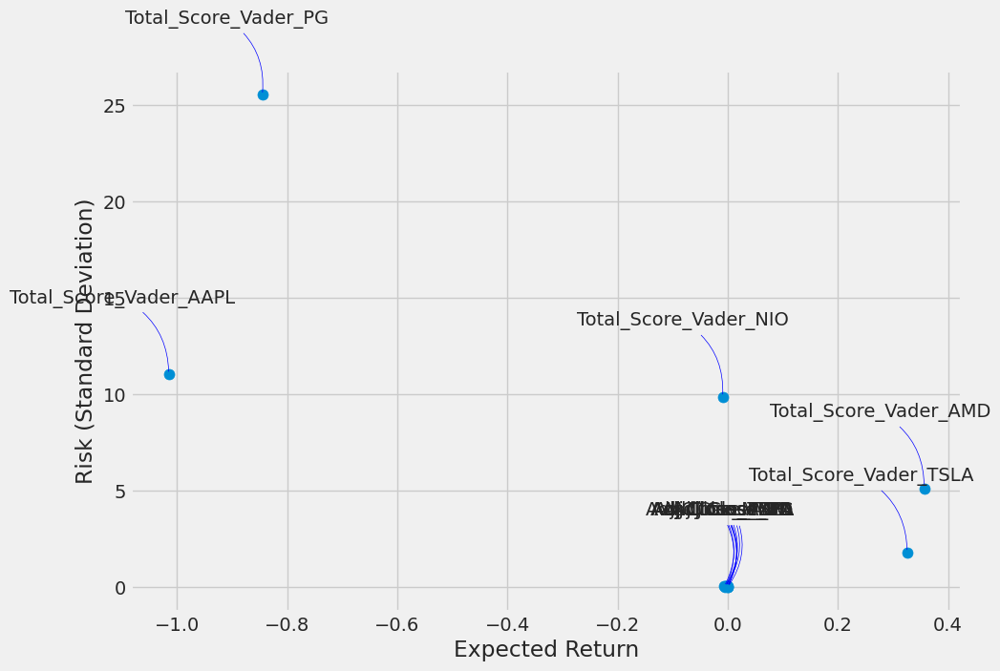

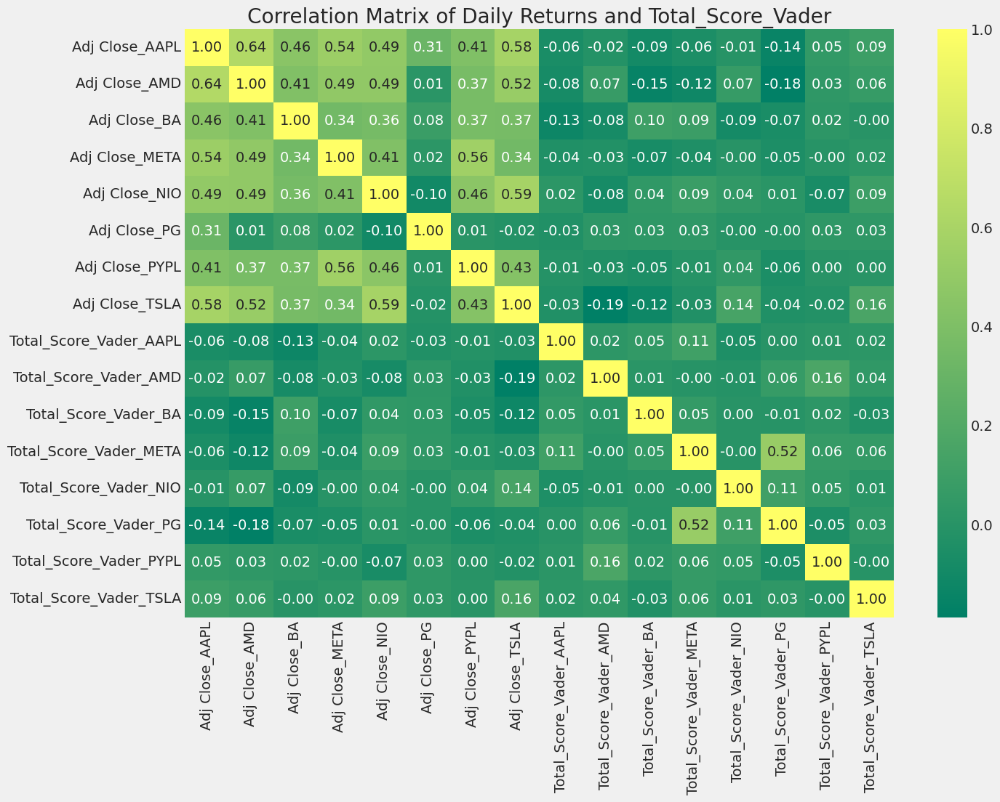

In [31]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')
tech_list = ['META', 'AAPL', 'TSLA', 'PYPL', 'BA', 'NIO', 'PG', 'AMD']

# Filter and organize the data
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data[data['Stock Name'].isin(tech_list)]
data = data.sort_values(by='Date')

# Create pivot tables for 'Adj Close' and 'Total_Score_Vader'
closing_df = data.pivot_table(index='Date', columns='Stock Name', values='Adj Close')
vader_df = data.pivot_table(index='Date', columns='Stock Name', values='Total_Score_Vader')

# Calculate the daily returns for both 'Adj Close' and 'Total_Score_Vader'
tech_rets = closing_df.pct_change()
vader_rets = vader_df.pct_change()

# Combine the two DataFrames into one
combined_rets = pd.concat([tech_rets, vader_rets], axis=1, keys=['Adj Close', 'Total_Score_Vader'])

# Flatten the MultiIndex columns to have a single level of columns
combined_rets.columns = ['_'.join(col).strip() for col in combined_rets.columns.values]

# Drop any rows with missing values
rets = combined_rets.dropna()

# Calculate area for scatter plot points (can be adjusted as needed)
area = np.pi * 20

# Set up the figure for the scatter plot
plt.figure(figsize=(10, 7))
plt.scatter(rets.mean(), rets.std(), s=area)

# Set labels for the axes
plt.xlabel('Expected Return')
plt.ylabel('Risk (Standard Deviation)')

# Annotate each point with the corresponding stock name
for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom',
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

# Show the plot
plt.show()

# Plotting the correlation heatmap for the combined returns
plt.figure(figsize=(14, 10))
sns.heatmap(rets.corr(), annot=True, cmap='summer', fmt=".2f")
plt.title('Correlation Matrix of Daily Returns and Total_Score_Vader')
plt.show()

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


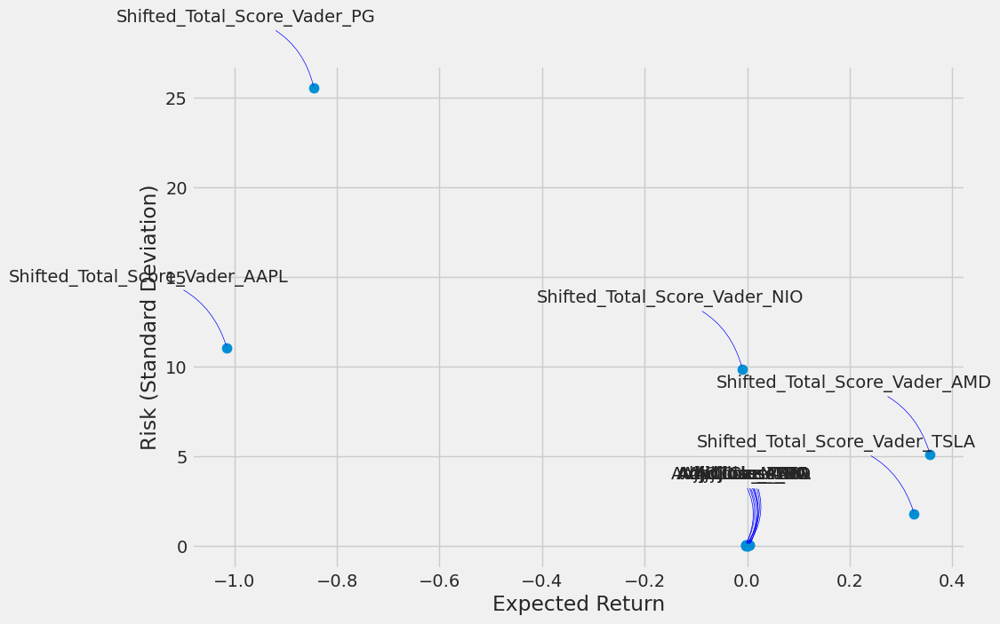

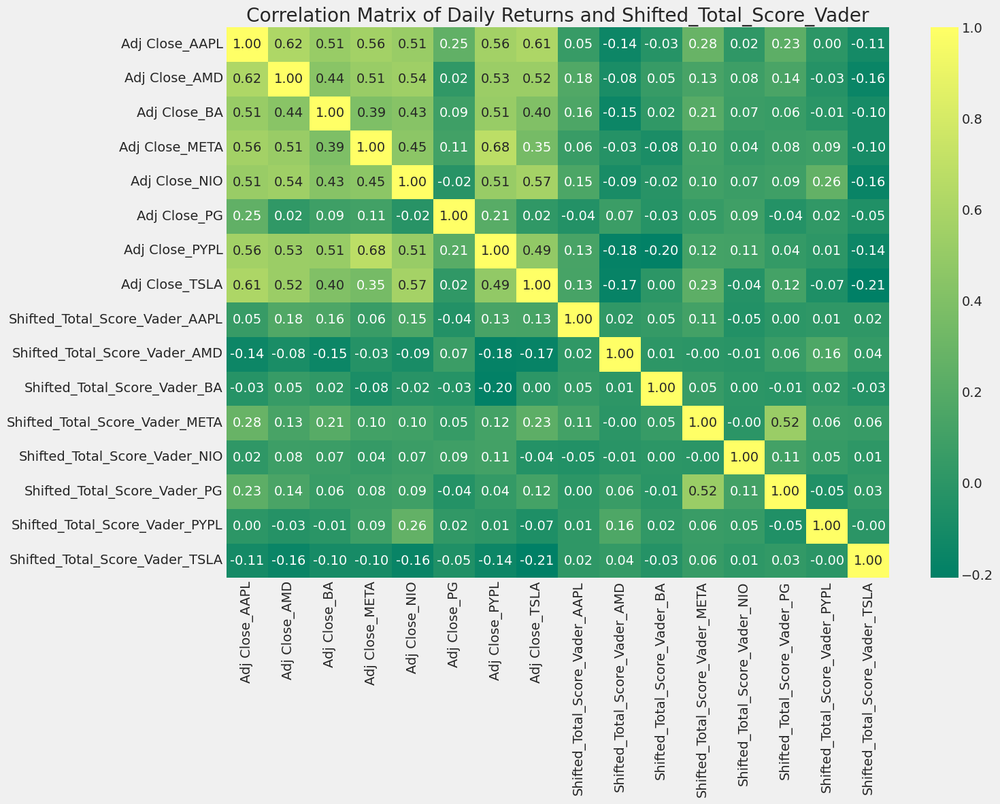

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
data = pd.read_csv('/content/merged_dataset_with_fill.csv')
tech_list = ['META', 'AAPL', 'TSLA', 'PYPL', 'BA', 'NIO', 'PG', 'AMD']

# Filter and organize the data
data['Date'] = pd.to_datetime(data['Date'], dayfirst=True)
data = data[data['Stock Name'].isin(tech_list)]
data = data.sort_values(by='Date')

# Create pivot tables for 'Adj Close' and 'Total_Score_Vader'
closing_df = data.pivot_table(index='Date', columns='Stock Name', values='Adj Close')
vader_df = data.pivot_table(index='Date', columns='Stock Name', values='Total_Score_Vader')

# Shift the sentiment scores by one day to align yesterday's tweets with today's stock prices
vader_df_shifted = vader_df.shift(1)

# Calculate the daily returns for both 'Adj Close' and 'Shifted Total_Score_Vader'
tech_rets = closing_df.pct_change()
vader_rets_shifted = vader_df_shifted.pct_change()

# Combine the two DataFrames into one
combined_rets_shifted = pd.concat([tech_rets, vader_rets_shifted], axis=1, keys=['Adj Close', 'Shifted_Total_Score_Vader'])

# Flatten the MultiIndex columns to have a single level of columns
combined_rets_shifted.columns = ['_'.join(col).strip() for col in combined_rets_shifted.columns.values]

# Drop any rows with missing values
rets_shifted = combined_rets_shifted.dropna()

# Calculate area for scatter plot points (can be adjusted as needed)
area = np.pi * 20

# Set up the figure for the scatter plot
plt.figure(figsize=(10, 7))
plt.scatter(rets_shifted.mean(), rets_shifted.std(), s=area)

# Set labels for the axes
plt.xlabel('Expected Return')
plt.ylabel('Risk (Standard Deviation)')

# Annotate each point with the corresponding stock name
for label, x, y in zip(rets_shifted.columns, rets_shifted.mean(), rets_shifted.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom',
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

# Show the plot
plt.show()

# Plotting the correlation heatmap for the combined returns
plt.figure(figsize=(14, 10))
sns.heatmap(rets_shifted.corr(), annot=True, cmap='summer', fmt=".2f")
plt.title('Correlation Matrix of Daily Returns and Shifted_Total_Score_Vader')
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                  252
Model:                 ARIMA(7, 1, 7)   Log Likelihood                -961.918
Date:                Tue, 03 Sep 2024   AIC                           1955.836
Time:                        13:06:17   BIC                           2012.243
Sample:                             0   HQIC                          1978.536
                                - 252                                         
Covariance Type:                  opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Total_Score_Vader     0.3743      0.069      5.455      0.000       0.240       0.509
ar.L1                -0.9606      0.129     -7.419      0.000      -1.214      -0.707
ar.L2                -0.

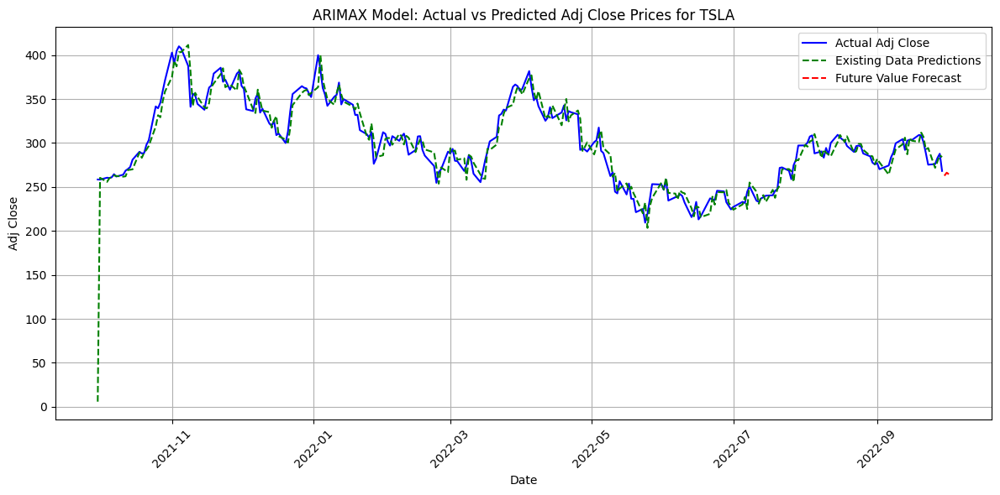

Existing Data predictions: 0        5.782597
1      260.385095
2      255.728603
3      259.878470
4      261.225844
          ...    
247    294.329402
248    271.791573
249    279.096106
250    286.111569
251    283.975158
Name: predicted_mean, Length: 252, dtype: float64
Future Value predictions: 252    262.755692
253    266.259414
254    264.277204
Name: predicted_mean, dtype: float64
Mean Absolute Error: 9.481524371411892
Mean Squared Error: 377.31829633710964


In [3]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Import dataset
file_path = '/content/merged_dataset_with_fill.csv'
df = pd.read_csv(file_path)

# Parse Date as datetime with the specified format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Filter the data for the specific stock, e.g., TSLA
stock_name = 'TSLA'
df = df[df['Stock Name'] == stock_name]  # Ensure your dataset has a 'Stock' column with stock names

# Assign target variable (Adj Close) and exogenous variable (Total_Score_Vader)
y = df['Adj Close']
X = df[['Total_Score_Vader']]  # Use the correct exogenous variable for TSLA

# Define the ARIMA model order (p, d, q)
p = 7
d = 1
q = 7

# Fit the ARIMAX model
model = sm.tsa.ARIMA(y, order=(p, d, q), exog=X)
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Generate predictions for the existing data
exdata_pred = model_fit.predict(start=0, end=len(y)-1, exog=X)

# Prepare data for future value predictions
last_known_value = df['Total_Score_Vader'].iloc[-1]
X_forecast = np.array([[last_known_value]] * 3)  # Adjust the number of steps if necessary

# Predict future values
fut_value_pred = model_fit.forecast(steps=3, exog=X_forecast)

# Combine the existing data and future value predictions for plotting
full_predictions = np.concatenate([exdata_pred, fut_value_pred])

# Create a date range for the extended forecast period
forecast_dates = pd.date_range(start=df['Date'].iloc[-1] + pd.Timedelta(days=1), periods=3, freq='D')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df['Date'], y, label='Actual Adj Close', color='blue')
plt.plot(df['Date'], exdata_pred, label='Existing Data Predictions', color='green', linestyle='--')
plt.plot(forecast_dates, fut_value_pred, label='Future Value Forecast', color='red', linestyle='--')

# Add labels and title to the plots
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.title(f'ARIMAX Model: Actual vs Predicted Adj Close Prices for {stock_name}')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

# Print predictions
print("Existing Data predictions:", exdata_pred)
print("Future Value predictions:", fut_value_pred)

# Model Evaluation
mae = mean_absolute_error(y, exdata_pred)
mse = mean_squared_error(y, exdata_pred)

print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                  201
Model:                 ARIMA(7, 1, 7)   Log Likelihood                -774.722
Date:                Tue, 03 Sep 2024   AIC                           1581.445
Time:                        13:09:34   BIC                           1634.218
Sample:                             0   HQIC                          1602.801
                                - 201                                         
Covariance Type:                  opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Total_Score_Vader     0.3845      0.074      5.183      0.000       0.239       0.530
ar.L1                -1.1083      0.214     -5.168      0.000      -1.529      -0.688
ar.L2                -0.

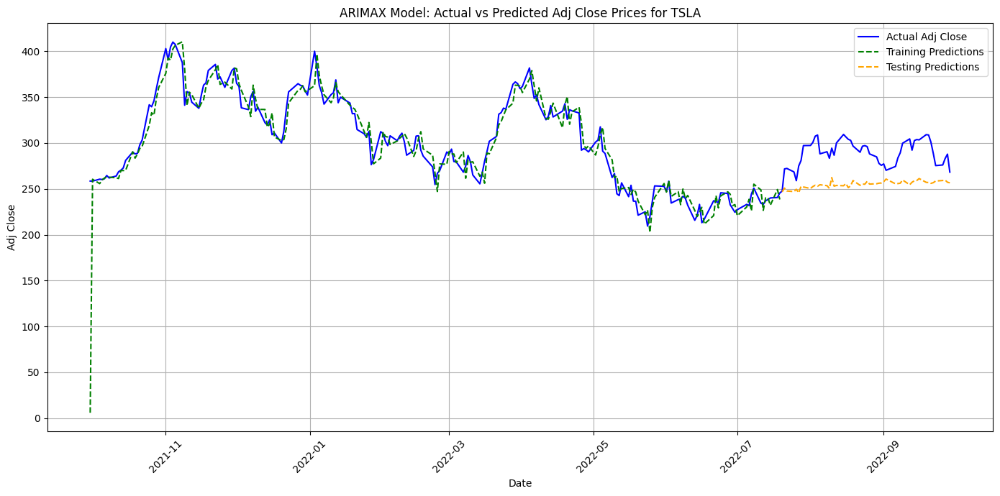

Mean Absolute Error (MAE): 34.33064293903349
Mean Squared Error (MSE): 1359.261471025533
Root Mean Squared Error (RMSE): 36.86816338015135
R-squared: -5.771553836281573
Adjusted R-squared: -6.053701912793305
Future Value predictions: 201    240.732676
202    244.627661
203    244.357928
Name: predicted_mean, dtype: float64


In [4]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Import dataset
file_path = '/content/merged_dataset_with_fill.csv'
df = pd.read_csv(file_path)

# Parse Date as datetime with the specified format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Filter the data for the specific stock, e.g., TSLA
stock_name = 'TSLA'
df = df[df['Stock Name'] == stock_name]  # Ensure your dataset has a 'Stock' column with stock names

# Assign target variable (Adj Close) and exogenous variable (Total_Score_Vader)
y = df['Adj Close']
X = df[['Total_Score_Vader']]  # Use the correct exogenous variable for TSLA

# Split the data into training (80%) and testing (20%)
train_size = int(len(df) * 0.8)
y_train, y_test = y[:train_size], y[train_size:]
X_train, X_test = X[:train_size], X[train_size:]

# Define the ARIMA model order (p, d, q)
p = 7
d = 1
q = 7

# Fit the ARIMAX model on training data
model = sm.tsa.ARIMA(y_train, order=(p, d, q), exog=X_train)
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Make predictions on the training set
train_pred = model_fit.predict(start=0, end=len(y_train)-1, exog=X_train)

# Make predictions on the test set
test_pred = model_fit.predict(start=len(y_train), end=len(y)-1, exog=X_test)

# Combine the predictions
full_predictions = np.concatenate([train_pred, test_pred])

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], y, label='Actual Adj Close', color='blue')
plt.plot(df['Date'][:len(train_pred)], train_pred, label='Training Predictions', color='green', linestyle='--')
plt.plot(df['Date'][len(train_pred):], test_pred, label='Testing Predictions', color='orange', linestyle='--')

# Add labels and title to plots
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.title(f'ARIMAX Model: Actual vs Predicted Adj Close Prices for {stock_name}')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

# Model Evaluation Metrics
# Evaluate on Test Set
mae = mean_absolute_error(y_test, test_pred)
mse = mean_squared_error(y_test, test_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, test_pred)

# Calculate Adjusted R-squared
n = len(y_test)
p = X_test.shape[1] + 1  # Number of predictors including constant
adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Print Evaluation Metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

# Predictions for future values (optional)
last_known_value = df['Total_Score_Vader'].iloc[-1]
X_forecast = np.array([[last_known_value]] * 3)  # Adjust the number of steps if necessary

# Predict future values
fut_value_pred = model_fit.forecast(steps=3, exog=X_forecast)

# Print future value predictions
print("Future Value predictions:", fut_value_pred)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                  201
Model:                 ARIMA(7, 1, 7)   Log Likelihood                -774.722
Date:                Tue, 03 Sep 2024   AIC                           1581.445
Time:                        13:14:23   BIC                           1634.218
Sample:                             0   HQIC                          1602.801
                                - 201                                         
Covariance Type:                  opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Total_Score_Vader     0.3845      0.074      5.183      0.000       0.239       0.530
ar.L1                -1.1083      0.214     -5.168      0.000      -1.529      -0.688
ar.L2                -0.

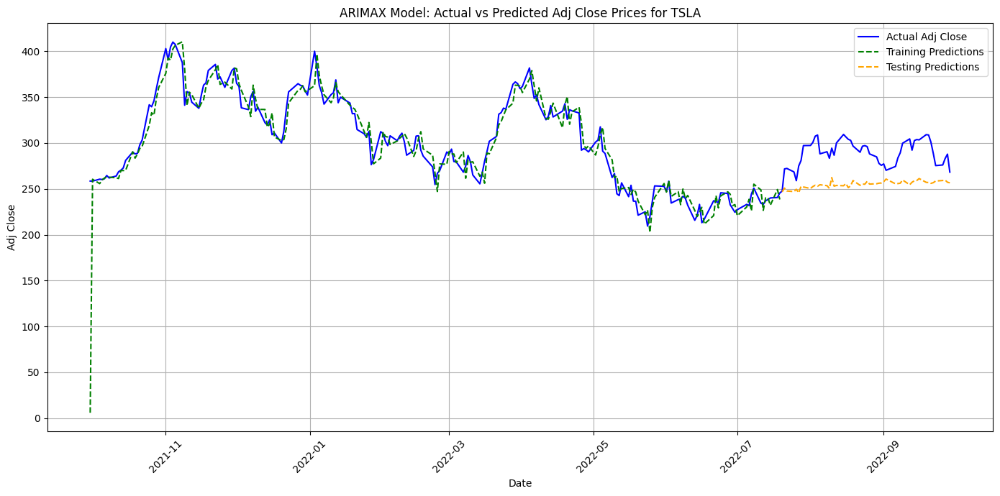

Training Set Metrics:
Training RMSE: 21.24854891547319
Training MSE: 451.5008310132569
Training MAE: 10.157871382531681
Training R2 Score: 0.821827017324479
Training Adjusted R2 Score: 0.8200272902267465
Training Accuracy: 96.53%

Testing Set Metrics:
Test RMSE: 36.86816338015135
Test MSE: 1359.261471025533
Test MAE: 34.33064293903349
Test R2 Score: -5.771553836281573
Test Adjusted R2 Score: -6.053701912793305
Test Accuracy: 88.33%

Future Value predictions: 201    240.732676
202    244.627661
203    244.357928
Name: predicted_mean, dtype: float64


In [5]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Import dataset
file_path = '/content/merged_dataset_with_fill.csv'
df = pd.read_csv(file_path)

# Parse Date as datetime with the specified format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Filter the data for the specific stock, e.g., TSLA
stock_name = 'TSLA'
df = df[df['Stock Name'] == stock_name]  # Ensure your dataset has a 'Stock' column with stock names

# Assign target variable (Adj Close) and exogenous variable (Total_Score_Vader)
y = df['Adj Close']
X = df[['Total_Score_Vader']]  # Use the correct exogenous variable for TSLA

# Split the data into training (80%) and testing (20%)
train_size = int(len(df) * 0.8)
y_train, y_test = y[:train_size], y[train_size:]
X_train, X_test = X[:train_size], X[train_size:]

# Define the ARIMA model order (p, d, q)
p = 7
d = 1
q = 7

# Fit the ARIMAX model on training data
model = sm.tsa.ARIMA(y_train, order=(p, d, q), exog=X_train)
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Make predictions on the training set
train_pred = model_fit.predict(start=0, end=len(y_train)-1, exog=X_train)

# Make predictions on the test set
test_pred = model_fit.predict(start=len(y_train), end=len(y)-1, exog=X_test)

# Combine the predictions
full_predictions = np.concatenate([train_pred, test_pred])

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], y, label='Actual Adj Close', color='blue')
plt.plot(df['Date'][:len(train_pred)], train_pred, label='Training Predictions', color='green', linestyle='--')
plt.plot(df['Date'][len(train_pred):], test_pred, label='Testing Predictions', color='orange', linestyle='--')

# Add labels and title to plots
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.title(f'ARIMAX Model: Actual vs Predicted Adj Close Prices for {stock_name}')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

# Model Evaluation Metrics for Training Set
mse_train = mean_squared_error(y_train, train_pred)
mae_train = mean_absolute_error(y_train, train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, train_pred)
n_train = len(y_train)
p_train = X_train.shape[1] + 1  # Number of predictors including constant
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_pred) / y_train)) * 100)

# Print Training Set Metrics
print("Training Set Metrics:")
print(f"Training RMSE: {rmse_train}")
print(f"Training MSE: {mse_train}")
print(f"Training MAE: {mae_train}")
print(f"Training R2 Score: {r2_train}")
print(f"Training Adjusted R2 Score: {adjusted_r2_train}")
print(f"Training Accuracy: {accuracy_train:.2f}%")

# Model Evaluation Metrics for Testing Set
mse_test = mean_squared_error(y_test, test_pred)
mae_test = mean_absolute_error(y_test, test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, test_pred)
n_test = len(y_test)
p_test = X_test.shape[1] + 1  # Number of predictors including constant
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_pred) / y_test)) * 100)

# Print Testing Set Metrics
print("\nTesting Set Metrics:")
print(f"Test RMSE: {rmse_test}")
print(f"Test MSE: {mse_test}")
print(f"Test MAE: {mae_test}")
print(f"Test R2 Score: {r2_test}")
print(f"Test Adjusted R2 Score: {adjusted_r2_test}")
print(f"Test Accuracy: {accuracy_test:.2f}%")

# Predictions for future values (optional)
last_known_value = df['Total_Score_Vader'].iloc[-1]
X_forecast = np.array([[last_known_value]] * 3)  # Adjust the number of steps if necessary

# Predict future values
fut_value_pred = model_fit.forecast(steps=3, exog=X_forecast)

# Print future value predictions
print("\nFuture Value predictions:", fut_value_pred)


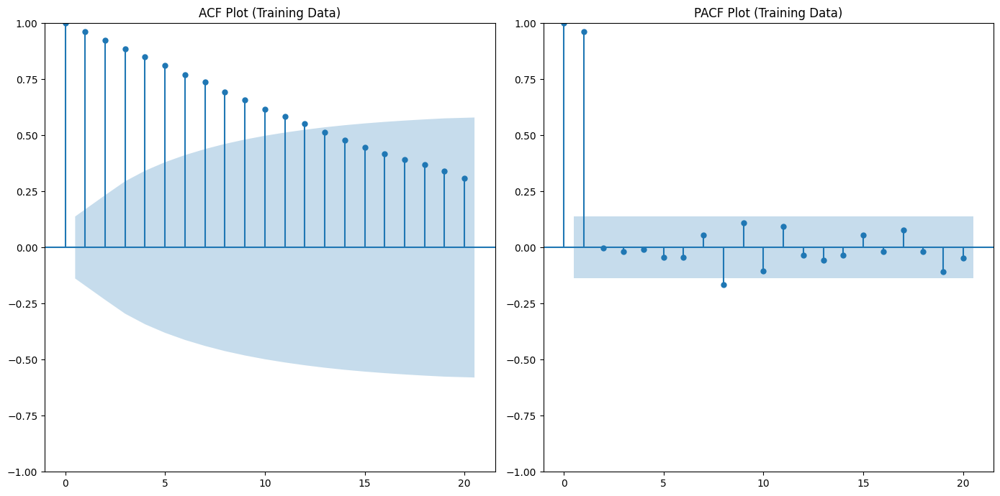

                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                  201
Model:                 ARIMA(7, 1, 0)   Log Likelihood                -783.791
Date:                Tue, 03 Sep 2024   AIC                           1585.581
Time:                        13:27:22   BIC                           1615.266
Sample:                             0   HQIC                          1597.594
                                - 201                                         
Covariance Type:                  opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Total_Score_Vader     0.3930      0.077      5.091      0.000       0.242       0.544
ar.L1                 0.0371      0.082      0.453      0.651      -0.123       0.197
ar.L2                 0.

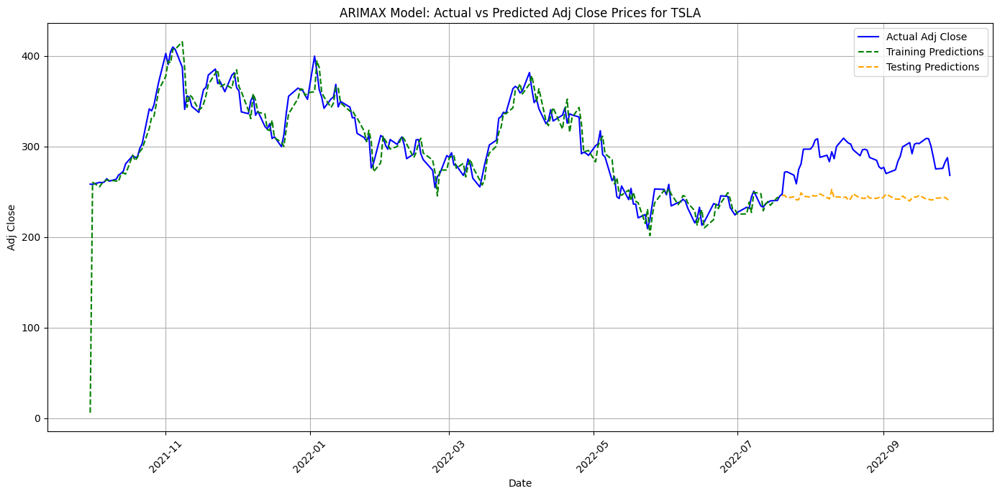

Training Set Metrics:
Training RMSE: 21.55242094072736
Training MSE: 464.5068484063031
Training MAE: 10.491356347609376
Training R2 Score: 0.8166945330576213
Training Adjusted R2 Score: 0.814842962684466
Training Accuracy: 96.43%

Testing Set Metrics:
Test RMSE: 47.5266815136112
Test MSE: 2258.785455696233
Test MAE: 45.320170741159636
Test R2 Score: -10.252792522925509
Test Adjusted R2 Score: -10.721658878047405
Test Accuracy: 84.54%

Future Value predictions: 201    239.716685
202    240.070160
203    239.976070
Name: predicted_mean, dtype: float64


In [11]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Import dataset
file_path = '/content/merged_dataset_with_fill.csv'
df = pd.read_csv(file_path)

# Parse Date as datetime with the specified format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Filter the data for the specific stock, e.g., TSLA
stock_name = 'TSLA'
df = df[df['Stock Name'] == stock_name]  # Ensure your dataset has a 'Stock' column with stock names

# Assign target variable (Adj Close) and exogenous variable (Total_Score_Vader)
y = df['Adj Close']
X = df[['Total_Score_Vader']]  # Use the correct exogenous variable for TSLA

# Split the data into training (80%) and testing (20%)
train_size = int(len(df) * 0.8)
y_train, y_test = y[:train_size], y[train_size:]
X_train, X_test = X[:train_size], X[train_size:]

# Plot ACF and PACF to help determine p and q
plt.figure(figsize=(14, 7))

# ACF Plot
plt.subplot(121)
plot_acf(y_train, lags=20, ax=plt.gca())  # Adjust lags as needed
plt.title('ACF Plot (Training Data)')

# PACF Plot
plt.subplot(122)
plot_pacf(y_train, lags=20, ax=plt.gca(), method='ywm')  # Adjust lags as needed
plt.title('PACF Plot (Training Data)')

plt.tight_layout()
plt.show()


# Define the ARIMA model order (p, d, q) based on ACF and PACF observations
p = 7  # Based on PACF spikes up to lag 2
d = 1  # Differencing order, typically 1 for non-stationary series
q = 0  # Start with q=1 or q=2 as ACF does not have a clear cutoff

# Fit the ARIMAX model on training data
model = sm.tsa.ARIMA(y_train, order=(p, d, q), exog=X_train)
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Fit the ARIMAX model on training data
model = sm.tsa.ARIMA(y_train, order=(p, d, q), exog=X_train)
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Make predictions on the training set
train_pred = model_fit.predict(start=0, end=len(y_train)-1, exog=X_train)

# Make predictions on the test set
test_pred = model_fit.predict(start=len(y_train), end=len(y)-1, exog=X_test)

# Combine the predictions
full_predictions = np.concatenate([train_pred, test_pred])

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], y, label='Actual Adj Close', color='blue')
plt.plot(df['Date'][:len(train_pred)], train_pred, label='Training Predictions', color='green', linestyle='--')
plt.plot(df['Date'][len(train_pred):], test_pred, label='Testing Predictions', color='orange', linestyle='--')

# Add labels and title to plots
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.title(f'ARIMAX Model: Actual vs Predicted Adj Close Prices for {stock_name}')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

# Model Evaluation Metrics for Training Set
mse_train = mean_squared_error(y_train, train_pred)
mae_train = mean_absolute_error(y_train, train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, train_pred)
n_train = len(y_train)
p_train = X_train.shape[1] + 1  # Number of predictors including constant
adjusted_r2_train = 1 - (1 - r2_train) * (n_train - 1) / (n_train - p_train - 1)

# Calculate training accuracy
accuracy_train = 100 - (np.mean(np.abs((y_train - train_pred) / y_train)) * 100)

# Print Training Set Metrics
print("Training Set Metrics:")
print(f"Training RMSE: {rmse_train}")
print(f"Training MSE: {mse_train}")
print(f"Training MAE: {mae_train}")
print(f"Training R2 Score: {r2_train}")
print(f"Training Adjusted R2 Score: {adjusted_r2_train}")
print(f"Training Accuracy: {accuracy_train:.2f}%")

# Model Evaluation Metrics for Testing Set
mse_test = mean_squared_error(y_test, test_pred)
mae_test = mean_absolute_error(y_test, test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, test_pred)
n_test = len(y_test)
p_test = X_test.shape[1] + 1  # Number of predictors including constant
adjusted_r2_test = 1 - (1 - r2_test) * (n_test - 1) / (n_test - p_test - 1)

# Calculate testing accuracy
accuracy_test = 100 - (np.mean(np.abs((y_test - test_pred) / y_test)) * 100)

# Print Testing Set Metrics
print("\nTesting Set Metrics:")
print(f"Test RMSE: {rmse_test}")
print(f"Test MSE: {mse_test}")
print(f"Test MAE: {mae_test}")
print(f"Test R2 Score: {r2_test}")
print(f"Test Adjusted R2 Score: {adjusted_r2_test}")
print(f"Test Accuracy: {accuracy_test:.2f}%")

# Predictions for future values (optional)
last_known_value = df['Total_Score_Vader'].iloc[-1]
X_forecast = np.array([[last_known_value]] * 3)  # Adjust the number of steps if necessary

# Predict future values
fut_value_pred = model_fit.forecast(steps=3, exog=X_forecast)

# Print future value predictions
print("\nFuture Value predictions:", fut_value_pred)


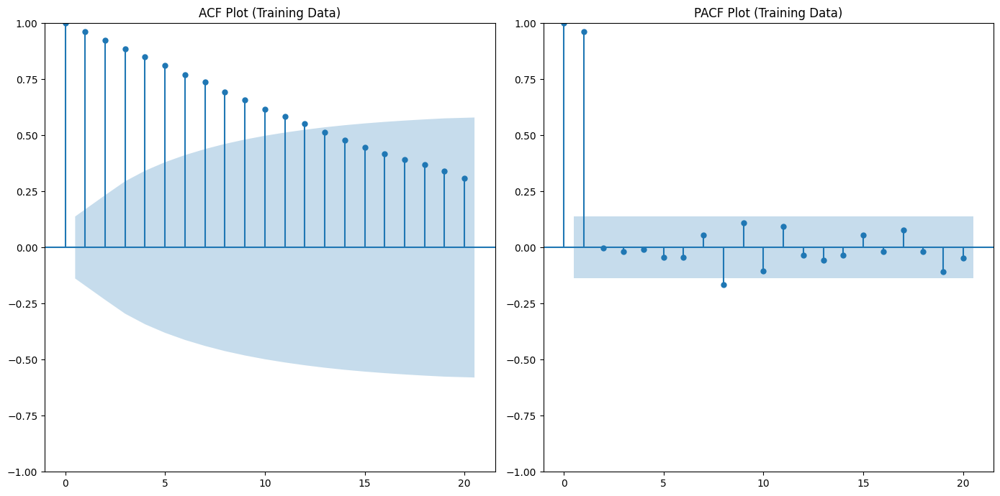

<ipython-input-12-c4a657b29629>:49: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(lags, ccf_values, basefmt=" ", use_line_collection=True)


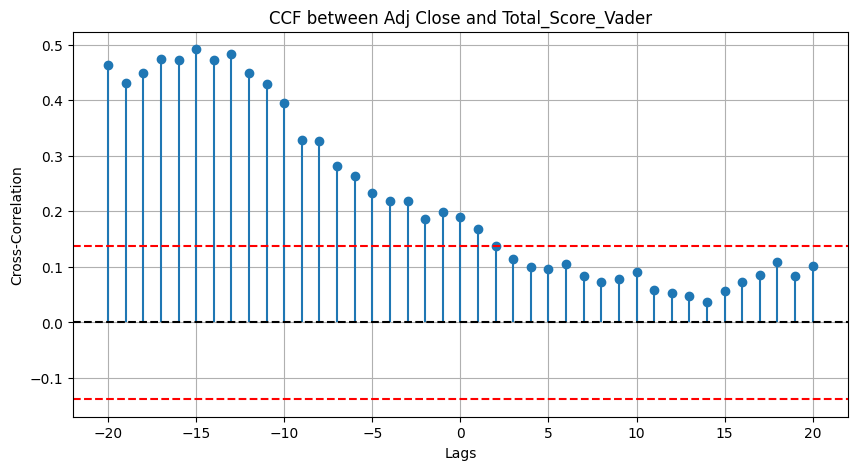

In [12]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import ccf
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Import dataset
file_path = '/content/merged_dataset_with_fill.csv'
df = pd.read_csv(file_path)

# Parse Date as datetime with the specified format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Filter the data for the specific stock, e.g., TSLA
stock_name = 'TSLA'
df = df[df['Stock Name'] == stock_name]  # Ensure your dataset has a 'Stock' column with stock names

# Assign target variable (Adj Close) and exogenous variable (Total_Score_Vader)
y = df['Adj Close']
X = df[['Total_Score_Vader']]  # Use the correct exogenous variable for TSLA

# Split the data into training (80%) and testing (20%)
train_size = int(len(df) * 0.8)
y_train, y_test = y[:train_size], y[train_size:]
X_train, X_test = X[:train_size], X[train_size:]

# Plot ACF and PACF to help determine p and q
plt.figure(figsize=(14, 7))

# ACF Plot
plt.subplot(121)
plot_acf(y_train, lags=20, ax=plt.gca())  # Adjust lags as needed
plt.title('ACF Plot (Training Data)')

# PACF Plot
plt.subplot(122)
plot_pacf(y_train, lags=20, ax=plt.gca(), method='ywm')  # Adjust lags as needed
plt.title('PACF Plot (Training Data)')

plt.tight_layout()
plt.show()

# Plot Cross-Correlation Function (CCF) between Adj_Close and Total_Score_Vader
plt.figure(figsize=(10, 5))
lags = np.arange(-20, 21, 1)  # Define lag range, adjust if needed
ccf_values = ccf(y_train, X_train['Total_Score_Vader'])[:len(lags)]
plt.stem(lags, ccf_values, basefmt=" ", use_line_collection=True)
plt.axhline(y=0, color='black', linestyle='--')
plt.axhline(y=1.96/np.sqrt(len(y_train)), color='red', linestyle='--')
plt.axhline(y=-1.96/np.sqrt(len(y_train)), color='red', linestyle='--')
plt.xlabel('Lags')
plt.ylabel('Cross-Correlation')
plt.title('CCF between Adj Close and Total_Score_Vader')
plt.grid(True)
plt.show()